#Avance 5. Modelo final

###Tecnológico de Monterrey

###Maestría en Inteligencia Artificial Aplicada

**Proyecto**: Predicción de la demanda de aguacate mexicano a Estados Unidos

**Organización:** APEJAL

Prof. Gerardo Camacho González, PhD


**Equipo 28:**

Nayelhi Yajaira de Anda de la Torre - A01795504

Iris Monserrat Urbina Casas - A01795999

José Luis Plata Osorio - A01796090


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive




---



In [2]:
# Importación de Librerías:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

import xgboost as xgb
from sklearn.model_selection import train_test_split, TimeSeriesSplit, GridSearchCV, RandomizedSearchCV, ParameterSampler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge

!pip install --upgrade prophet

try:
    from prophet import Prophet
except ImportError:
    from fbprophet import Prophet

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import (
    RBF, ConstantKernel, Matern, ExpSineSquared, WhiteKernel
)

from statsmodels.tsa.statespace.sarimax import SARIMAX

import statsmodels.api as sm

from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor

import time
from lightgbm import LGBMRegressor

!pip install -q catboost
from catboost import CatBoostRegressor

!pip -q install statsmodels
from statsmodels.tsa.statespace.structural import UnobservedComponents

!pip -q install lightgbm

import lightgbm as lgb

!pip -q install --upgrade catboost optuna

import optuna

from itertools import product


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.9/413.9 kB 16.8 MB/s eta 0:00:00


#**Análisis exploratorio de datos**

## Estructura de los datos

### Descripción de las variables del dataset:

- **Amount** *(float / numérica continua)*: Importaciones totales de aguacate mexicano a Estados Unidos de América, medidas en *thousand pounds*. Datos obtenidos del Departamento de Agricultura de Estados Unidos (USDA).
- **tipo_cambio_usd_mxn** *(float / numérica continua)*: Tipo de cambio peso mexicano – dólar estadounidense, obtenido del Banco de México.
- **Year** *(int / numérica discreta)*: Año de importación.
- **MonthNumber** *(int / numérica discreta)*: Mes de importación (1–12).
- **evento_exportacion** *(int / dummy binaria 0–1)*: Variable dummy que considera eventos relevantes en Estados Unidos, como el Super Bowl y el 5 de mayo.
- **inspeccion_intensificada** *(int / dummy binaria 0–1)*: Variable dummy que indica periodos con inspecciones intensificadas a las exportaciones.
- **cierre_exportacion** *(int / dummy binaria 0–1)*: Variable dummy que indica periodos con cierres temporales de exportación.


##Procesamiento de los datos

##**Archivo `fruit-trade-data.csv` (importaciones USA)**
El archivo mostrado a continuación, es el dataset proveniente del Departamento de Agricultura de Estados Unidos (USDA).
A continuación presentamos el pre-procesamiento realizado para obtener los datos de Importación de aguacate mexicano a Estados Unidos de América:

## 0. Carga de archivo

In [3]:
PATH_TRADE = "fruit-trade-data.csv"
df_trade = pd.read_csv(PATH_TRADE)
df_trade


,Trade,GeographicDesc,Year,MonthNumber,MarketYear,Group,Subgroup,MarketSegment,CommodityName,CommodityDetail,UnitType,UnitDesc,Amount
0,Import,Argentina,2025,10,2024/25,Fruit and tree nuts,Citrus,Prepared or preserved,Oranges,Peel,Value,Thousand dollars,243.52500
1,Import,Argentina,2025,10,2024/25,Fruit and tree nuts,Citrus,Prepared or preserved,Oranges,Peel,Volume,Thousand pounds,216.93487
2,Import,Australia,2025,10,2024/25,Fruit and tree nuts,Citrus,Fresh,Oranges,Temples,Value,Thousand dollars,12.60000
3,Import,Australia,2025,10,2024/25,Fruit and tree nuts,Citrus,Fresh,Oranges,Temples,Volume,Thousand pounds,44.44519
4,Import,Australia,2025,10,2024/25,Fruit and tree nuts,Citrus,Fresh,Oranges,Unspecified,Value,Thousand dollars,2816.94800
...,...,...,...,...,...,...,...,...,...,...,...,...,...
842407,Export,World,2017,1,2017,Fruit and tree nuts,Tree nuts,Fresh,"Nuts, other",Other,Volume,Thousand pounds,850.45081
842408,Export,World,2017,1,2017,Fruit and tree nuts,Tree nuts,Fresh,"Nuts, other",Other,Unit value,Dollars per pound,2.19140
842409,Export,World,2017,1,2017,Fruit and tree nuts,Tree nuts,Prepared or preserved,"Nuts, other",Other,Value,Thousand dollars,13808.77600
842410,Export,World,2017,1,2017,Fruit and tree nuts,Tree nuts,Prepared or preserved,"Nuts, other",Other,Volume,Thousand pounds,6209.32402


 1. Se aplican filtros para obtener los datos del volumen de importaciones de aguacates mexicanos



In [4]:
def norm(s):
    return s.astype(str).str.strip().str.lower()

# Se crea fecha mensual a partir de Year + MonthNumber (para ordenar)
df_trade["fecha"] = pd.to_datetime(
    df_trade["Year"].astype(int).astype(str) + "-" +
    df_trade["MonthNumber"].astype(int).astype(str) + "-01",
    errors="coerce"
)

# Se aplican filtros
df_trade_f = df_trade[
    (norm(df_trade["Trade"]) == "import") &
    (norm(df_trade["GeographicDesc"]) == "mexico") &
    (norm(df_trade["CommodityName"]) == "avocados") &
    (norm(df_trade["CommodityDetail"]) == "hass avocados and hass-like avocados") &
    (norm(df_trade["MarketSegment"]) == "fresh") &
    (norm(df_trade["UnitType"]) == "volume")
].copy()

print("Shape (df_trade filtrado):", df_trade_f.shape)
display(df_trade_f[["Year","MonthNumber","Trade","GeographicDesc","CommodityName","CommodityDetail","MarketSegment","UnitType","UnitDesc","Amount","fecha"]].head(10))


Shape (df_trade filtrado): (106, 14)


,Year,MonthNumber,Trade,GeographicDesc,CommodityName,CommodityDetail,MarketSegment,UnitType,UnitDesc,Amount,fecha
1382,2025,10,Import,Mexico,Avocados,Hass avocados and Hass-like avocados,Fresh,Volume,Thousand pounds,250302.35186,2025-10-01
9779,2025,9,Import,Mexico,Avocados,Hass avocados and Hass-like avocados,Fresh,Volume,Thousand pounds,207860.15867,2025-09-01
17760,2025,8,Import,Mexico,Avocados,Hass avocados and Hass-like avocados,Fresh,Volume,Thousand pounds,185185.00873,2025-08-01
26824,2025,7,Import,Mexico,Avocados,Hass avocados and Hass-like avocados,Fresh,Volume,Thousand pounds,157471.70306,2025-07-01
35401,2025,6,Import,Mexico,Avocados,Hass avocados and Hass-like avocados,Fresh,Volume,Thousand pounds,140346.36208,2025-06-01
43752,2025,5,Import,Mexico,Avocados,Hass avocados and Hass-like avocados,Fresh,Volume,Thousand pounds,153833.52899,2025-05-01
52279,2025,4,Import,Mexico,Avocados,Hass avocados and Hass-like avocados,Fresh,Volume,Thousand pounds,161459.68460,2025-04-01
60614,2025,3,Import,Mexico,Avocados,Hass avocados and Hass-like avocados,Fresh,Volume,Thousand pounds,219103.38350,2025-03-01
68896,2025,2,Import,Mexico,Avocados,Hass avocados and Hass-like avocados,Fresh,Volume,Thousand pounds,170956.37433,2025-02-01
77160,2025,1,Import,Mexico,Avocados,Hass avocados and Hass-like avocados,Fresh,Volume,Thousand pounds,259771.49483,2025-01-01


2. Se convierte `Amount` de Thousand pounds a toneladas métricas para:

* Entender magnitudes reales (evitar interpretar miles de libras sin contexto).

* Comparar con otras fuentes (SIAVI, FAOSTAT, Banxico) que reportan en toneladas.

* Visualizar series en una escala comprensible.

* Validar órdenes de magnitud y detectar outliers.


In [5]:
# Se convierte Amount a numérico
df_trade_f["Amount"] = pd.to_numeric(df_trade_f["Amount"], errors="coerce")

# Conversión: thousand pounds -> toneladas métricas
# 1 thousand pounds = 0.453592 toneladas
CONV_TON = 0.453592
df_trade_f["importaciones_ton"] = df_trade_f["Amount"] * CONV_TON

# Se valida unicidad Year-MonthNumber
dup_months = df_trade_f.duplicated(subset=["Year","MonthNumber"]).sum()
print("Duplicados por (Year, MonthNumber):", dup_months)

# Se define serie mensual
df_trade_f_monthly = (
    df_trade_f[["Year","MonthNumber","fecha","importaciones_ton"]]
    .dropna()
    .sort_values(["Year","MonthNumber"])
    .reset_index(drop=True)
)

print("Serie mensual importaciones:", df_trade_f_monthly.shape)
display(df_trade_f_monthly.head(12))


Duplicados por (Year, MonthNumber): 0
Serie mensual importaciones: (106, 4)


,Year,MonthNumber,fecha,importaciones_ton
0,2017,1,2017-01-01,90275.525358
1,2017,2,2017-02-01,66692.899595
2,2017,3,2017-03-01,73229.683266
3,2017,4,2017-04-01,69023.139695
4,2017,5,2017-05-01,56802.240664
5,2017,6,2017-06-01,51053.703352
6,2017,7,2017-07-01,46745.537869
7,2017,8,2017-08-01,48425.876495
8,2017,9,2017-09-01,55755.854519
9,2017,10,2017-10-01,65462.255602


## 1. Análisis descriptivo (univariante)

1. Se utiliza el método `info()` del dataframe, para obtener el resumen de los tipos de datos.

In [6]:
df_trade_f_monthly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106 entries, 0 to 105
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Year               106 non-null    int64         
 1   MonthNumber        106 non-null    int64         
 2   fecha              106 non-null    datetime64[ns]
 3   importaciones_ton  106 non-null    float64       
dtypes: datetime64[ns](1), float64(1), int64(2)
memory usage: 3.4 KB


Número de columnas datetime: 1

Número de columnas numéricas: 3

Número de columnas cualitativas: 0

 2. Se determina el porcentaje de valores faltantes por columna.

In [7]:
df_trade_f_monthly.isna().mean() * 100

,0
Year,0.0
MonthNumber,0.0
fecha,0.0
importaciones_ton,0.0


###Análisis de variables numéricas

3. Se obtienen las siguientes estadísticas descriptivas para todas las variables numéricas:
*   Tendencia central (media, mediana)
*   Dispersión o variabilidad (min, max, desviación estándar, cuartiles)

In [8]:
# Tendencia central y Dispersión
df_trade_f_monthly.describe().T

,count,mean,min,25%,50%,75%,max,std
Year,106.0,2020.924528,2017.0,2019.0,2021.0,2023.0,2025.0,2.558638
MonthNumber,106.0,6.40566,1.0,3.25,6.0,9.0,12.0,3.430336
fecha,106,2021-05-16 21:44:09.056603648,2017-01-01 00:00:00,2019-03-08 18:00:00,2021-05-16 12:00:00,2023-07-24 06:00:00,2025-10-01 00:00:00,NaN
importaciones_ton,106.0,82505.470858,34103.622182,69232.132276,82770.250483,94911.210328,131092.233064,20556.689229


El conjunto de datos cuenta con 106 observaciones mensuales entre 2017 y 2025, lo que proporciona una base temporal adecuada para el análisis de series de tiempo. La variable de importaciones presenta una media y mediana similares, indicando una distribución relativamente simétrica, aunque con una variabilidad significativa asociada a factores estacionales y eventos específicos. Estas características justifican el uso de modelos que capturen estacionalidad y choques temporales en la demanda.

4. Se utilizan histogramas para determinar la distribución de los valores representados en cada variable.

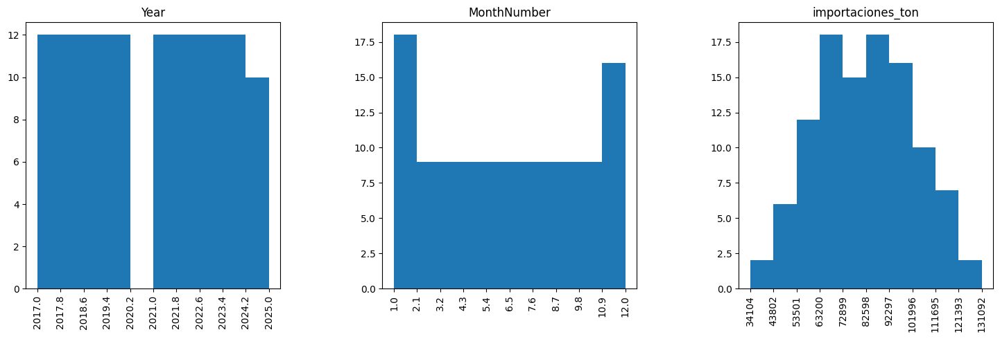

In [9]:
# Se hace una lista de variables numéricas
num_cols = df_trade_f_monthly.select_dtypes(include=np.number).columns.tolist()

fig, axes = plt.subplots(1,3, figsize=(18,5))
plt.subplots_adjust(wspace=0.4)

axes = axes.ravel()
for col, ax in zip(df_trade_f_monthly[num_cols], axes):
  n, bins, edges = ax.hist(df_trade_f_monthly[col])
  ax.set_xticks(bins)
  ax.tick_params(axis='x',rotation=90)
  ax.set(title=f'{col}', xlabel=None)

Los histogramas indican que los datos cubren de manera equilibrada el periodo de 2017 a 2025 y que se cuenta con información para todos los meses del año, lo que facilita el análisis de la estacionalidad sin distorsiones. Asimismo, las importaciones mensuales muestran una variación relevante, pero sin presencia de valores extremos, lo que respalda que la serie es adecuada para modelar la demanda internacional.

5. Se emplean boxplots para mostrar la distribución de los datos a través de sus cuartiles.

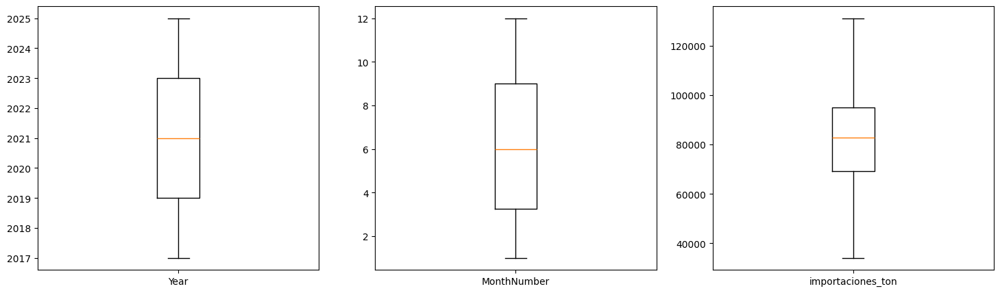

In [10]:
fig, axes = plt.subplots(1,3, figsize=(18,5))
axes = axes.ravel()
for col, ax in zip(df_trade_f_monthly[num_cols], axes):
  ax.boxplot(df_trade_f_monthly[col], tick_labels=[f'{col}'])


Los boxplots indican que las variables de tiempo se distribuyen de manera homogénea durante el periodo analizado, mientras que las importaciones mensuales presentan una dispersión relevante sin la presencia de valores atípicos extremos. Esto sugiere que los datos representan de forma adecuada el comportamiento del mercado y resultan apropiados para el análisis y modelado de la demanda internacional.

### Gráficas de Importaciones USA y Estacionalidad (promedio por mes)


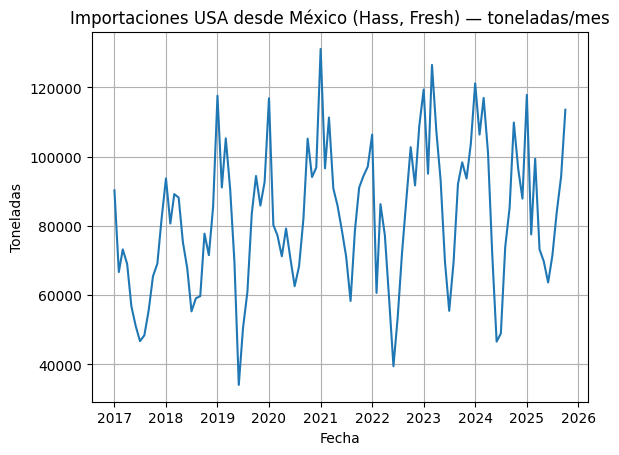

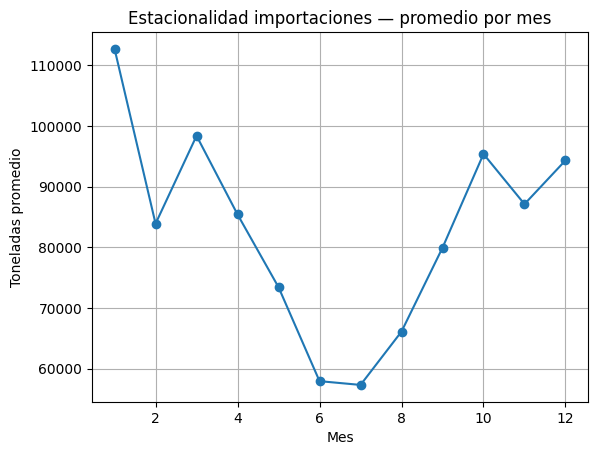

In [11]:
# Importaciones USA
plt.plot(df_trade_f_monthly["fecha"], df_trade_f_monthly["importaciones_ton"])
plt.title("Importaciones USA desde México (Hass, Fresh) — toneladas/mes")
plt.xlabel("Fecha")
plt.ylabel("Toneladas")
plt.grid(True)
plt.show()

# Estacionalidad importaciones
imports_seasonal = df_trade_f_monthly.groupby("MonthNumber")["importaciones_ton"].mean().reset_index()
plt.plot(imports_seasonal["MonthNumber"], imports_seasonal["importaciones_ton"], marker="o")
plt.title("Estacionalidad importaciones — promedio por mes")
plt.xlabel("Mes")
plt.ylabel("Toneladas promedio")
plt.grid(True)
plt.show()


## Análisis de variables de texto
No aplica

---

##**Archivo `BM Tipos de cambio diarios.csv`**


## 0. Carga de archivo


In [12]:
PATH_FX = "BM Tipos de cambio diarios.csv"
df_fx = pd.read_csv(PATH_FX)
df_fx

,Fecha,SF60653,SF43718,SF43787,SF43784,SF43788,SF43786,SF43785,SF43717,SF63528,SF343410
0,02/01/91,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E,2.9447,N/E
1,03/01/91,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E,2.9459,N/E
2,04/01/91,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E,2.9463,N/E
3,07/01/91,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E,2.9467,N/E
4,08/01/91,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E,2.9471,N/E
...,...,...,...,...,...,...,...,...,...,...,...
12701,16/01/26,17.8167,17.6867,17.7235,17.728,N/E,N/E,17.735,17.639,17.6867,17.6465
12702,17/01/26,17.6897,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E
12703,18/01/26,17.6897,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E
12704,19/01/26,17.6897,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E,N/E


 1. Se aplican filtros para obtener los datos del Tipo de Cambio correspondientes al mismo período de los datos de las importaciones

In [13]:
# Se convierte Fecha en formato dd/mm/aa
df_fx["Fecha"] = pd.to_datetime(df_fx["Fecha"], format="%d/%m/%y", errors="coerce")

# Se filtra rango de fechas
df_fx = df_fx[(df_fx["Fecha"] >= "2017-01-01") & (df_fx["Fecha"] <= "2025-10-31")].copy()

# Se conservan columnas Fecha y Tipo de cambio diario (SF60653)
df_fx = df_fx[["Fecha","SF60653"]].rename(columns={"SF60653":"tipo_cambio"})
df_fx["tipo_cambio"] = pd.to_numeric(df_fx["tipo_cambio"], errors="coerce")
df_fx = df_fx.dropna().reset_index(drop=True)

# Se crea Year y MonthNumber
df_fx["Year"] = df_fx["Fecha"].dt.year
df_fx["MonthNumber"] = df_fx["Fecha"].dt.month

# Se crea Tipo de cambio promedio mensual
df_fx_monthly = (
    df_fx.groupby(["Year","MonthNumber"], as_index=False)["tipo_cambio"]
    .mean()
    .sort_values(["Year","MonthNumber"])
    .reset_index(drop=True)
)
# Se crea fecha mensual de referencia
df_fx_monthly["fecha"] = pd.to_datetime(
    df_fx_monthly["Year"].astype(str) + "-" + df_fx_monthly["MonthNumber"].astype(str) + "-01",
    errors="coerce"
)

display(df_fx_monthly.head(12))
print("Rango:", df_fx_monthly["fecha"].min(), "→", df_fx_monthly["fecha"].max())


,Year,MonthNumber,tipo_cambio,fecha
0,2017,1,21.395497,2017-01-01
1,2017,2,20.352457,2017-02-01
2,2017,3,19.416481,2017-03-01
3,2017,4,18.781217,2017-04-01
4,2017,5,18.799710,2017-05-01
5,2017,6,18.208147,2017-06-01
6,2017,7,17.854590,2017-07-01
7,2017,8,17.806497,2017-08-01
8,2017,9,17.805537,2017-09-01
9,2017,10,18.713616,2017-10-01


Rango: 2017-01-01 00:00:00 → 2025-10-01 00:00:00


## 1. Análisis descriptivo (univariante)

1. Se utiliza el método `info()` del dataframe, para obtener el resumen de los tipos de datos.

In [14]:
df_fx_monthly.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 106 entries, 0 to 105
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   Year         106 non-null    int32         
 1   MonthNumber  106 non-null    int32         
 2   tipo_cambio  106 non-null    float64       
 3   fecha        106 non-null    datetime64[ns]
dtypes: datetime64[ns](1), float64(1), int32(2)
memory usage: 2.6 KB


Número de columnas datetime: 1

Número de columnas numéricas: 3

Número de columnas cualitativas: 0

 2. Se determina el porcentaje de valores faltantes por columna.

In [15]:
df_fx_monthly.isna().mean() * 100

,0
Year,0.0
MonthNumber,0.0
tipo_cambio,0.0
fecha,0.0


###Análisis de variables numéricas

3. Se obtienen las siguientes estadísticas descriptivas para todas las variables numéricas:
*   Tendencia central (media, mediana)
*   Dispersión o variabilidad (min, max, desviación estándar, cuartiles)

In [16]:
# Tendencia central y Dispersión
df_fx_monthly.describe().T

,count,mean,min,25%,50%,75%,max,std
Year,106.0,2020.924528,2017.0,2019.0,2021.0,2023.0,2025.0,2.558638
MonthNumber,106.0,6.40566,1.0,3.25,6.0,9.0,12.0,3.430336
tipo_cambio,106.0,19.424452,16.782557,18.662206,19.338172,20.221078,24.239883,1.393885
fecha,106,2021-05-16 21:44:09.056603648,2017-01-01 00:00:00,2019-03-08 18:00:00,2021-05-16 12:00:00,2023-07-24 06:00:00,2025-10-01 00:00:00,NaN


Las estadísticas descriptivas muestran que el conjunto de datos abarca de manera continua el periodo de 2017 a 2025 y una distribución mensual uniforme. El tipo de cambio presenta una variabilidad moderada y consistente con el contexto macroeconómico del periodo considerado. En general, no se identifican comportamientos atípicos en los datos y resultan adecuados para el análisis exploratorio y el posterior modelado de la demanda internacional.

4. Se utilizan histogramas para determinar la distribución de los valores representados en cada variable.

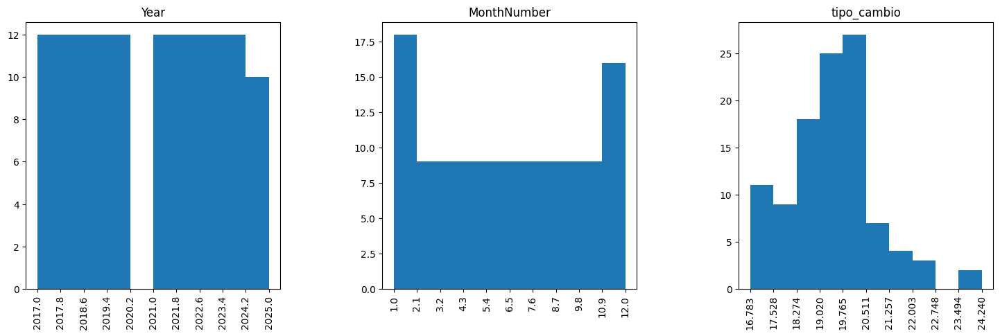

In [17]:
# Se hace una lista de variables numéricas
num_cols = df_fx_monthly.select_dtypes(include=np.number).columns.tolist()

fig, axes = plt.subplots(1,3, figsize=(18,5))
plt.subplots_adjust(wspace=0.4)

axes = axes.ravel()
for col, ax in zip(df_fx_monthly[num_cols], axes):
  n, bins, edges = ax.hist(df_fx_monthly[col])
  ax.set_xticks(bins)
  ax.tick_params(axis='x',rotation=90)
  ax.set(title=f'{col}', xlabel=None)

Los histogramas muestran una cobertura temporal equilibrada y una distribución mensual completa, mientras que el tipo de cambio presenta una variación moderada consistente con el contexto macroeconómico. En conjunto, los datos no exhiben comportamientos atípicos y resultan adecuados para el análisis exploratorio y el modelado de la demanda.

5. Se emplean boxplots para mostrar la distribución de los datos a través de sus cuartiles.

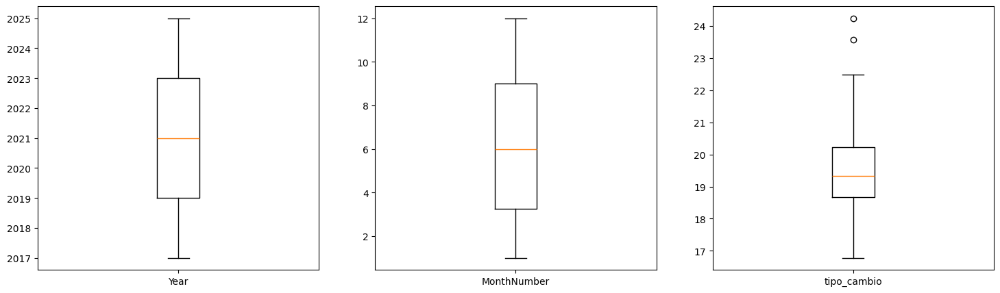

In [18]:
fig, axes = plt.subplots(1,3, figsize=(18,5))
axes = axes.ravel()
for col, ax in zip(df_fx_monthly[num_cols], axes):
  ax.boxplot(df_fx_monthly[col], tick_labels=[f'{col}'])

Los boxplots muestran una distribución equilibrada de las variables temporales y una variabilidad moderada en el tipo de cambio. Aunque se identifican algunos valores atípicos en esta última variable, estos corresponden a episodios macroeconómicos reales y no a errores en los datos, por lo que se considera apropiado conservarlos para el análisis y modelado de la demanda.

###Gráfica de Tipo de cambio mensual (promedio)

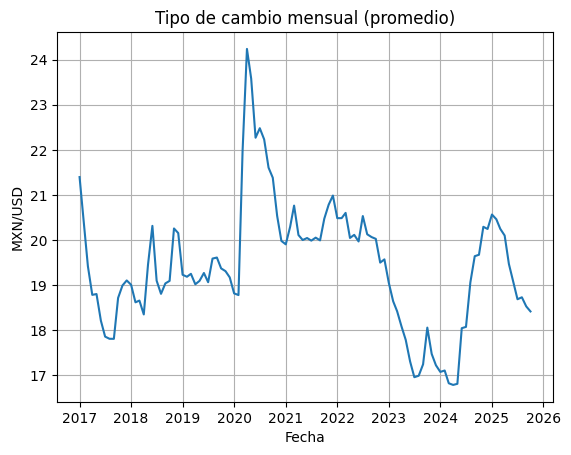

In [19]:
plt.plot(df_fx_monthly["fecha"], df_fx_monthly["tipo_cambio"])
plt.title("Tipo de cambio mensual (promedio)")
plt.xlabel("Fecha")
plt.ylabel("MXN/USD")
plt.grid(True)
plt.show()


##Integración de archivos (merge mensual) y análisis conjunto


In [20]:
# Se hace Merge mensual por Year y MonthNumber
df_trade_merged = df_trade_f_monthly.merge(
    df_fx_monthly[["Year","MonthNumber","tipo_cambio"]],
    on=["Year","MonthNumber"],
    how="left",
    validate="one_to_one"
)

print("Shape:", df_trade_merged.shape)
print("NAs tipo_cambio_mensual:", df_trade_merged["tipo_cambio"].isna().sum())
display(df_trade_merged.head(12))


Shape: (106, 5)
NAs tipo_cambio_mensual: 0


,Year,MonthNumber,fecha,importaciones_ton,tipo_cambio
0,2017,1,2017-01-01,90275.525358,21.395497
1,2017,2,2017-02-01,66692.899595,20.352457
2,2017,3,2017-03-01,73229.683266,19.416481
3,2017,4,2017-04-01,69023.139695,18.781217
4,2017,5,2017-05-01,56802.240664,18.799710
5,2017,6,2017-06-01,51053.703352,18.208147
6,2017,7,2017-07-01,46745.537869,17.854590
7,2017,8,2017-08-01,48425.876495,17.806497
8,2017,9,2017-09-01,55755.854519,17.805537
9,2017,10,2017-10-01,65462.255602,18.713616


1. Mapa de calor con los valores de correlación de todas las variables del dataframe.

<Axes: >

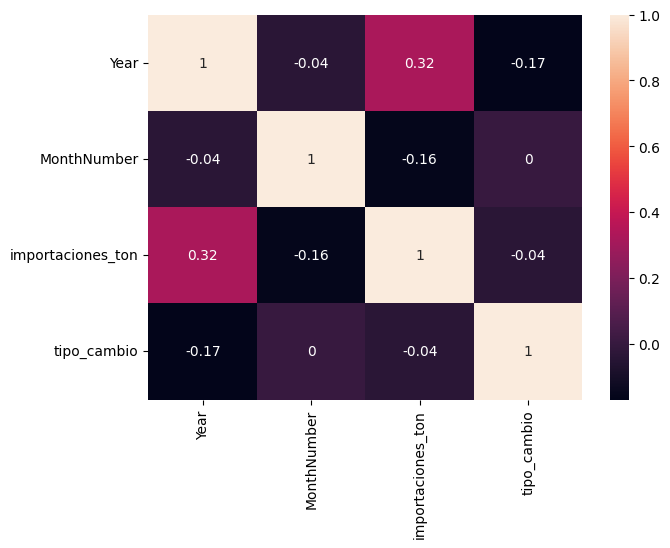

In [21]:
plt.figure(figsize = (7, 5))
sns.heatmap(round(df_trade_merged.corr(numeric_only=True),2), annot = True)

**Interpretación**

**1. Year - importaciones_ton (0.32)**

* Correlación positiva moderada.

* Indica que, conforme avanzan los años, las importaciones tienden a incrementarse.

**Implicación:**
  Existe una tendencia de crecimiento de largo plazo en la demanda. Esto refuerza:

* la necesidad de normalizar la serie (definir un índice de demanda),

* evitar usar Year directamente como variable explicativa.

**2. MonthNumber - importaciones_ton (-0.16)**

* Correlación negativa débil.

* El mes, tratado de forma lineal, no explica correctamente las variaciones en importaciones.

**Implicación:**
La estacionalidad no es lineal, por lo que es correcto:

* no usar MonthNumber directamente,

* usar transformaciones cíclicas (mes_sin, mes_cos).

**3. tipo_cambio - importaciones_ton (-0.04)**

* Correlación prácticamente nula.

* No existe una relación lineal directa entre tipo de cambio e importaciones mensuales.

**Implicación clave:**

El tipo de cambio:

* actúa como incentivo económico indirecto,

* su efecto no se refleja de forma inmediata ni lineal en el volumen importado,

* es correcto incluirlo como variable exógena, no esperar alta correlación simple.

**4. Year - tipo_cambio (-0.17)**

* Relación negativa débil.

* Sugiere que algunos periodos recientes tuvieron tipo de cambio más alto, pero sin patrón fuerte.

**Implicación:**
* No hay colinealidad problemática entre Year y tipo_cambio.

**5. MonthNumber - tipo_cambio (0.00)**

* Correlación nula.

**Implicación:**

El tipo de cambio no tiene estacionalidad mensual, lo cual es coherente con su naturaleza macroeconómica.

El mapa de calor muestra una correlación positiva moderada entre el tiempo y las importaciones, lo que sugiere una tendencia creciente de largo plazo. El mes del año no presenta una relación lineal fuerte con las importaciones, confirmando que la estacionalidad debe modelarse mediante transformaciones cíclicas. Asimismo, el tipo de cambio no exhibe una correlación lineal directa con el volumen importado, lo que es consistente con su papel como incentivo económico indirecto. En conjunto, no se identifican problemas de multicolinealidad en las variables analizadas.

2. Gráficas

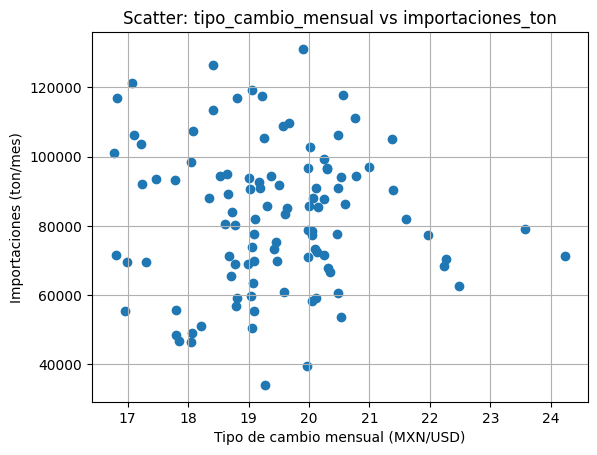

In [22]:
# Scatter
plt.scatter(df_trade_merged["tipo_cambio"], df_trade_merged["importaciones_ton"])
plt.title("Scatter: tipo_cambio_mensual vs importaciones_ton")
plt.xlabel("Tipo de cambio mensual (MXN/USD)")
plt.ylabel("Importaciones (ton/mes)")
plt.grid(True)
plt.show()

El diagrama de dispersión muestra una relación débil y no lineal entre el tipo de cambio mensual y el volumen de importaciones. La alta dispersión de los puntos indica que el tipo de cambio actúa como un factor contextual que influye de manera indirecta en la demanda, mientras que otros factores como la estacionalidad y los eventos específicos tienen un papel más relevante. Estos resultados respaldan su inclusión como variable exógena en el modelo de demanda.

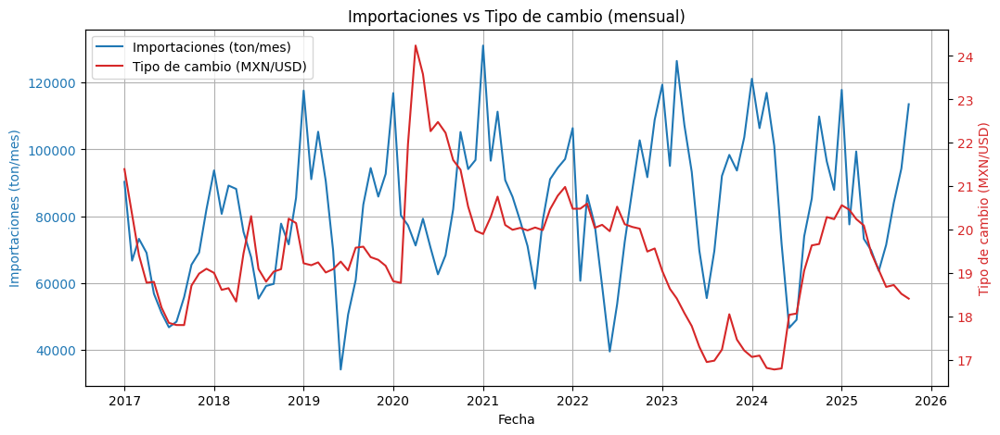

In [23]:
# Series alineadas (dos ejes)
fig, ax1 = plt.subplots(figsize=(12,5))

# Línea 1: Importaciones (eje izquierdo)
ax1.plot(
    df_trade_merged["fecha"],
    df_trade_merged["importaciones_ton"],
    color="tab:blue",
    label="Importaciones (ton/mes)"
)
ax1.set_xlabel("Fecha")
ax1.set_ylabel("Importaciones (ton/mes)", color="tab:blue")
ax1.tick_params(axis="y", labelcolor="tab:blue")
ax1.grid(True)

# Línea 2: Tipo de cambio (eje derecho)
ax2 = ax1.twinx()
ax2.plot(
    df_trade_merged["fecha"],
    df_trade_merged["tipo_cambio"],
    color="tab:red",
    label="Tipo de cambio (MXN/USD)"
)
ax2.set_ylabel("Tipo de cambio (MXN/USD)", color="tab:red")
ax2.tick_params(axis="y", labelcolor="tab:red")

# Título y leyenda combinada
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc="upper left")

plt.title("Importaciones vs Tipo de cambio (mensual)")
plt.show()


La comparación visual de las series muestra que las importaciones mensuales presentan una estacionalidad marcada y variaciones abruptas, mientras que el tipo de cambio evoluciona de manera más gradual. No se observa una sincronización directa entre ambas series, lo que sugiere que el tipo de cambio actúa como un factor contextual cuyo efecto sobre la demanda es indirecto y depende de la interacción con otros elementos, como la estacionalidad y los eventos específicos.

##Variables dummy asociadas a eventos específicos

En esta etapa se crearán variables dummy asociadas a eventos específicos que podrían afectar el comportamiento de la demanda de aguacate mexicano hacia Estados Unidos. Dichas variables se definirán a partir de información externa y calendarios de eventos, y se incorporarán como variables explicativas en el análisis.


In [24]:
# =========================================
# 1. Crear eje temporal mensual
# =========================================
years = range(2017, 2026)
months = range(1, 13)

calendar = pd.DataFrame(
    [(y, m) for y in years for m in months],
    columns=["Year", "MonthNumber"]
)

# =========================================
# 2. evento_exportacion
# Enero y Febrero (Super Bowl) + Mayo (5 de mayo)
# =========================================
calendar["evento_exportacion"] = np.where(
    calendar["MonthNumber"].isin([1, 2, 5]),
    1,
    0
)

# =========================================
# 3. inspeccion_intensificada
# Fechas exactas
# =========================================
inspeccion_periodos = [
    (2017, 5),
    (2017, 6),
    (2022, 3),
    (2022, 4),
    (2024, 6),
    (2024, 7),
    (2025, 4),
    (2025, 5)
]

calendar["inspeccion_intensificada"] = np.where(
    calendar[["Year", "MonthNumber"]].apply(tuple, axis=1).isin(inspeccion_periodos),
    1,
    0
)

# =========================================
# 4. cierre_exportacion
# Fechas exactas
# =========================================
cierre_periodos = [
    (2022, 2),
    (2024, 6)
]

calendar["cierre_exportacion"] = np.where(
    calendar[["Year", "MonthNumber"]].apply(tuple, axis=1).isin(cierre_periodos),
    1,
    0
)

# Vista rápida del calendario
display(calendar.head(12))


,Year,MonthNumber,evento_exportacion,inspeccion_intensificada,cierre_exportacion
0,2017,1,1,0,0
1,2017,2,1,0,0
2,2017,3,0,0,0
3,2017,4,0,0,0
4,2017,5,1,1,0
5,2017,6,0,1,0
6,2017,7,0,0,0
7,2017,8,0,0,0
8,2017,9,0,0,0
9,2017,10,0,0,0


In [25]:
# 1) Confirmar tamaño esperado: (2017–2025) = 9 años * 12 meses = 108 filas
print(calendar.shape)

(108, 5)


##Construir Data Frame final

In [26]:
df_final = df_trade_merged.merge(
    calendar,
    on=["Year", "MonthNumber"],
    how="left",
    validate="one_to_one"
)

In [27]:
print(
    df_final[
        ["evento_exportacion", "inspeccion_intensificada", "cierre_exportacion"]
    ].isna().sum()
)

display(df_final.head(20))

evento_exportacion          0
inspeccion_intensificada    0
cierre_exportacion          0
dtype: int64


,Year,MonthNumber,fecha,importaciones_ton,tipo_cambio,evento_exportacion,inspeccion_intensificada,cierre_exportacion
0,2017,1,2017-01-01,90275.525358,21.395497,1,0,0
1,2017,2,2017-02-01,66692.899595,20.352457,1,0,0
2,2017,3,2017-03-01,73229.683266,19.416481,0,0,0
3,2017,4,2017-04-01,69023.139695,18.781217,0,0,0
4,2017,5,2017-05-01,56802.240664,18.799710,1,1,0
5,2017,6,2017-06-01,51053.703352,18.208147,0,1,0
6,2017,7,2017-07-01,46745.537869,17.854590,0,0,0
7,2017,8,2017-08-01,48425.876495,17.806497,0,0,0
8,2017,9,2017-09-01,55755.854519,17.805537,0,0,0
9,2017,10,2017-10-01,65462.255602,18.713616,0,0,0


In [28]:
# Renombrar columnas
df_final = df_final.rename(columns={
    "importaciones_ton": "Amount",
    "tipo_cambio": "tipo_cambio_usd_mxn"
})
df_final.head(10)



,Year,MonthNumber,fecha,Amount,tipo_cambio_usd_mxn,evento_exportacion,inspeccion_intensificada,cierre_exportacion
0,2017,1,2017-01-01,90275.525358,21.395497,1,0,0
1,2017,2,2017-02-01,66692.899595,20.352457,1,0,0
2,2017,3,2017-03-01,73229.683266,19.416481,0,0,0
3,2017,4,2017-04-01,69023.139695,18.781217,0,0,0
4,2017,5,2017-05-01,56802.240664,18.799710,1,1,0
5,2017,6,2017-06-01,51053.703352,18.208147,0,1,0
6,2017,7,2017-07-01,46745.537869,17.854590,0,0,0
7,2017,8,2017-08-01,48425.876495,17.806497,0,0,0
8,2017,9,2017-09-01,55755.854519,17.805537,0,0,0
9,2017,10,2017-10-01,65462.255602,18.713616,0,0,0


In [29]:
df_final = df_final[
    [
        "fecha",
        "Year",
        "MonthNumber",
        "Amount",
        "tipo_cambio_usd_mxn",
        "evento_exportacion",
        "inspeccion_intensificada",
        "cierre_exportacion"
    ]
].reset_index(drop=True)

In [30]:
print(df_final.columns.tolist())
df_final.head()


['fecha', 'Year', 'MonthNumber', 'Amount', 'tipo_cambio_usd_mxn', 'evento_exportacion', 'inspeccion_intensificada', 'cierre_exportacion']


,fecha,Year,MonthNumber,Amount,tipo_cambio_usd_mxn,evento_exportacion,inspeccion_intensificada,cierre_exportacion
0,2017-01-01,2017,1,90275.525358,21.395497,1,0,0
1,2017-02-01,2017,2,66692.899595,20.352457,1,0,0
2,2017-03-01,2017,3,73229.683266,19.416481,0,0,0
3,2017-04-01,2017,4,69023.139695,18.781217,0,0,0
4,2017-05-01,2017,5,56802.240664,18.799710,1,1,0


## Resumen descriptivo de la variable objetivo por dummy (0 vs 1)

In [31]:
dummy_cols = ["evento_exportacion", "inspeccion_intensificada", "cierre_exportacion"]
target = "Amount"

for c in dummy_cols:
    print(f"\n=== {c} vs {target} ===")
    summary = (
        df_final.groupby(c)[target]
        .agg(n="count", mean="mean", median="median", std="std", min="min", max="max")
        .round(2)
    )
    display(summary)


=== evento_exportacion vs Amount ===


,n,mean,median,std,min,max
evento_exportacion,,,,,,
0,79,79944.00,82041.41,19815.43,34103.62,126480.41
1,27,90000.14,90275.53,21221.29,56802.24,131092.23



=== inspeccion_intensificada vs Amount ===


,n,mean,median,std,min,max
inspeccion_intensificada,,,,,,
0,98,84035.87,85388.94,20253.32,34103.62,131092.23
1,8,63758.05,63289.95,14833.78,46599.58,86285.75



=== cierre_exportacion vs Amount ===


,n,mean,median,std,min,max
cierre_exportacion,,,,,,
0,104,83060.67,83746.30,20330.43,34103.62,131092.23
1,2,53635.32,53635.32,9950.04,46599.58,60671.06


### Impacto preliminar de variables dummy sobre la demanda (Amount)

El análisis descriptivo muestra diferencias claras en el volumen de importaciones de aguacate mexicano hacia Estados Unidos asociadas a las variables dummy consideradas.

En los meses marcados con **evento_exportacion = 1**, el volumen promedio de importaciones es mayor en comparación con los meses sin evento, lo que sugiere que eventos de alto consumo como el Super Bowl y el 5 de mayo están asociados a un incremento en la demanda.

Por el contrario, los periodos con **inspeccion_intensificada = 1** presentan un volumen promedio de importaciones significativamente menor respecto a los meses sin inspección intensificada, lo que indica un posible efecto restrictivo sobre el flujo comercial.

De manera similar, los meses con **cierre_exportacion = 1** muestran una reducción notable en el volumen importado en comparación con los meses sin cierres, aunque el número de observaciones en este grupo es limitado.

Estos resultados son de carácter exploratorio y descriptivo, pero sugieren que las variables dummy capturan comportamientos diferenciados en la demanda, por lo que resultan relevantes como variables explicativas para análisis posteriores y para su inclusión en modelos predictivos.


## Visualización

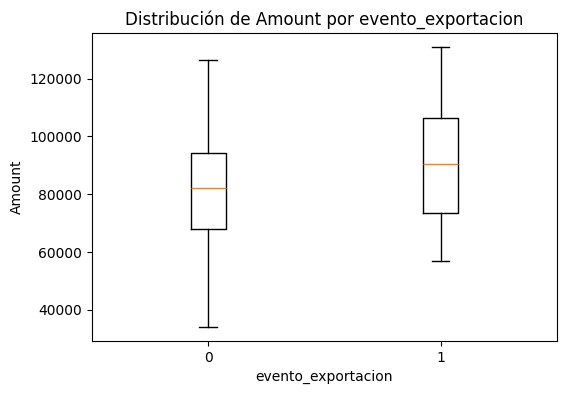

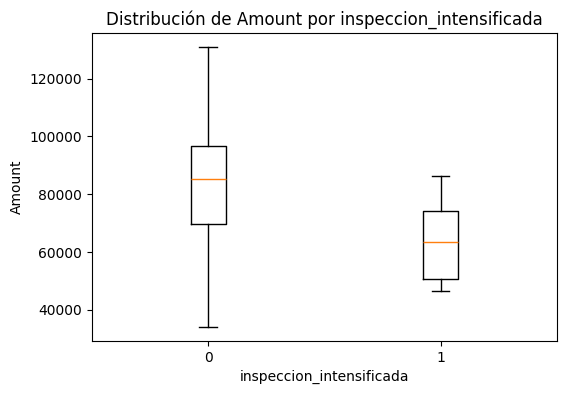

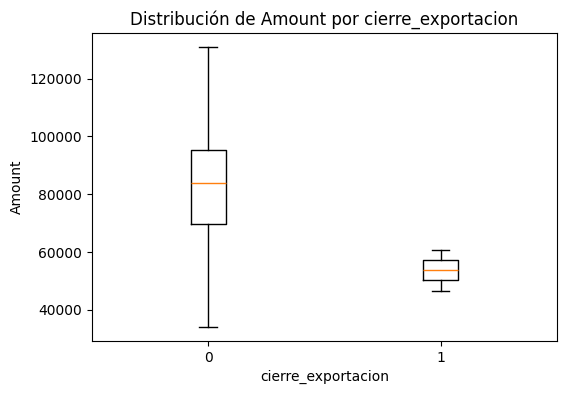

In [32]:
dummy_cols = [
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion"
]

for c in dummy_cols:
    plt.figure(figsize=(6,4))
    plt.boxplot(
        [
            df_final.loc[df_final[c] == 0, "Amount"],
            df_final.loc[df_final[c] == 1, "Amount"]
        ],
        tick_labels=["0", "1"]
    )
    plt.title(f"Distribución de Amount por {c}")
    plt.xlabel(c)
    plt.ylabel("Amount")
    plt.show()


##**Conclusiones**

El análisis exploratorio se llevó a cabo utilizando información de las importaciones mensuales de aguacate Hass fresco provenientes de México hacia Estados Unidos, así como el tipo de cambio promedio mensual. Los resultados muestran que el conjunto de datos abarca de forma continua el periodo de 2017 a 2025 y presenta una distribución homogénea de los meses del año, lo que permite evaluar la estacionalidad sin distorsiones.

Las estadísticas descriptivas y los diagramas de caja indican que las importaciones mensuales muestran una variación relevante, acorde con el comportamiento esperado del mercado, pero sin la presencia de valores extremos que puedan asociarse a errores en los datos. Esta variabilidad refleja la influencia de factores estacionales, eventos particulares y condiciones propias del entorno comercial.

El comportamiento del tipo de cambio presenta una fluctuación moderada y consistente con el contexto macroeconómico del periodo analizado, con algunos casos de mayor volatilidad que corresponden a momentos económicos específicos y no a inconsistencias en la información. Los histogramas y diagramas de caja apoyan la decisión de conservar estos valores, ya que representan situaciones reales del mercado.

Por otra parte, el análisis de correlación y el diagrama de dispersión evidencian la ausencia de una relación lineal significativa entre el tipo de cambio y el volumen de importaciones. De igual manera, la comparación de las series temporales muestra que los aumentos y disminuciones en las importaciones no coinciden de manera sistemática con las variaciones del tipo de cambio. Estos resultados sugieren que el tipo de cambio funciona como un factor de contexto o incentivo económico indirecto, cuyo impacto sobre la demanda depende de su interacción con otros elementos, como la estacionalidad y los eventos específicos.

Adicionalmente, la incorporación de variables dummy asociadas a eventos relevantes, periodos de inspección intensificada y cierres temporales de exportación permitió identificar comportamientos diferenciados en el volumen de importaciones. El análisis descriptivo y los diagramas de caja muestran que los meses asociados a eventos de alto consumo presentan, en promedio, mayores niveles de importación, mientras que los periodos con inspecciones intensificadas o cierres se asocian con reducciones en el volumen importado. Aunque estos resultados son de carácter exploratorio, sugieren que dichas variables capturan efectos estructurales y choques exógenos relevantes, por lo que su inclusión como variables explicativas resulta pertinente para el modelado de la demanda.


El Análisis exploratorio de datos nos permite concluir que los datos presentan una calidad adecuada, consistencia temporal y una variabilidad suficiente para el desarrollo del modelo de demanda. Los resultados obtenidos respaldan el uso de enfoques de modelado que consideren la estacionalidad, la incorporación de eventos y variables exógenas, así como la separación conceptual entre el análisis de la demanda y la formación de precios.



---



# **Ingeniería de Características**

Para mejorar el desempeño del modelo, se realizan las siguientes transformaciones:

###**1. Variables cíclicas**


  **Cálculo del Seno y coseno del mes (para capturar estacionalidad)**
  
  Son transformaciones trigonométricas del mes que permiten representar el tiempo como un ciclo, no como un número lineal.

  El año es un círculo, no una línea.
  Si se usa el mes como número: Enero = 1, Diciembre = 12

  Para el modelo, Enero (1) está muy lejos de diciembre (12). Pero en la realidad, están uno junto al otro. Eso rompe la estacionalidad.

  La solución es representar el mes como un círculo:

    12 meses = 360°
    Cada mes = 30°

  Usamos seno y coseno para ubicar cada mes en un círculo.

  **Definición matemática**

  mes_sin = sin(2π * m / 12)

  mes_cos = cos(2π * m / 12)

  Con esto, se convierte el mes en un par de coordenadas (x, y) sobre un círculo unitario.

  | Mes            | mes_sin | mes_cos |
  | -------------- | ------- | ------- |
  | Enero (1)      | ~0.50   | ~0.87   |
  | Marzo (3)      | 1.00    | 0.00    |
  | Junio (6)      | 0.00    | -1.00   |
  | Septiembre (9) | -1.00   | 0.00    |
  | Diciembre (12) | 0.00    | 1.00    |

  * Enero y diciembre quedan cerca en el espacio del modelo
  * Marzo y septiembre quedan opuestos

  **Importancia para el Modelo de Demanda del aguacate**

  El aguacate tiene:

  + Ciclos de producción

  + Ciclos de consumo (ej. Super Bowl)

  + Ciclos climáticos

  `mes_sin` y `mes_cos` permiten al modelo:

  + Captar picos y valles anuales

  + Aprender patrones suaves y repetitivos

  + Anticipar transiciones entre temporadas

  `mes_sin` y `mes_cos` permiten representar la estacionalidad anual del aguacate de forma continua y circular, evitando discontinuidades artificiales entre diciembre y enero y mejorando la capacidad del modelo para capturar ciclos reales de producción y consumo.

In [33]:
# Estacionalidad cíclica
df_final["mes_sin"] = np.sin(2*np.pi*df_final["MonthNumber"]/12)
df_final["mes_cos"] = np.cos(2*np.pi*df_final["MonthNumber"]/12)

In [34]:
df_final

,fecha,Year,MonthNumber,Amount,tipo_cambio_usd_mxn,evento_exportacion,inspeccion_intensificada,cierre_exportacion,mes_sin,mes_cos
0,2017-01-01,2017,1,90275.525358,21.395497,1,0,0,5.000000e-01,8.660254e-01
1,2017-02-01,2017,2,66692.899595,20.352457,1,0,0,8.660254e-01,5.000000e-01
2,2017-03-01,2017,3,73229.683266,19.416481,0,0,0,1.000000e+00,6.123234e-17
3,2017-04-01,2017,4,69023.139695,18.781217,0,0,0,8.660254e-01,-5.000000e-01
4,2017-05-01,2017,5,56802.240664,18.799710,1,1,0,5.000000e-01,-8.660254e-01
...,...,...,...,...,...,...,...,...,...,...
101,2025-06-01,2025,6,63659.987069,19.070290,0,0,0,1.224647e-16,-1.000000e+00
102,2025-07-01,2025,7,71427.904734,18.684161,0,0,0,-5.000000e-01,-8.660254e-01
103,2025-08-01,2025,8,83998.438480,18.727542,0,0,0,-8.660254e-01,-5.000000e-01
104,2025-09-01,2025,9,94283.705091,18.525080,0,0,0,-1.000000e+00,-1.836970e-16


###**2. Variable objetivo**

La columna `indice_demanda_exportacion` es el componente principal del modelo de demanda.

Es una medida normalizada que representa la presión relativa de la demanda internacional por el aguacate mexicano en un periodo determinado.

+ No es un volumen

+ No es un precio

+ Es un índice comparativo

Su función es indicar qué tan alta o baja es la demanda externa en relación con lo que históricamente se considera normal.

El volumen exportado por sí solo no dice nada si no se compara con un contexto:

105,000 toneladas pueden ser:

+ altas en un mes típico de baja

+ normales en un mes de alta demanda

El índice corrige esto, al comparar el volumen observado contra un nivel de referencia histórico.

**Cálculo**

El índice de demanda de exportación se calcula como la razón entre el volumen mensual exportado y su promedio móvil de doce meses, lo que permite medir la presión de la demanda respecto a su comportamiento histórico. Este valor base se ajusta mediante un factor asociado al tipo de cambio, que captura el incentivo económico para exportar, y un factor de eventos, que incorpora el efecto de situaciones extraordinarias como eventos comerciales, inspecciones intensificadas o cierres temporales. De esta forma, el índice refleja no solo la estacionalidad y tendencia de la demanda, sino también el impacto de factores externos que afectan la dinámica del mercado.

**Interpretación**
| Valor del índice | Interpretación |
| ---------------- | -------------- |
| < 0.90           | Demanda baja   |
| 0.90 – 1.05      | Demanda normal |
| 1.05 – 1.20      | Demanda alta   |
| > 1.20           | Demanda pico   |

Ejemplo:

indice_demanda_exportacion = 1.15
→ la demanda fue 15 % mayor que su nivel histórico esperado.

Este índice permite evaluar si la demanda se encuentra por encima, dentro o por debajo de su nivel normal y constituye la variable central del modelo de demanda.


**1. Se construye promedio móvil de Demanda**

Se define como un promedio móvil histórico, que captura:

+ Estacionalidad

+ Tendencia de largo plazo

+ “Comportamiento típico” del mercado

In [35]:
# Promedio móvil 12m del volumen exportado (baseline)
df_final["promedio_movil_12m_Amount"] = df_final["Amount"].rolling(12).mean()
df_final

,fecha,Year,MonthNumber,Amount,tipo_cambio_usd_mxn,evento_exportacion,inspeccion_intensificada,cierre_exportacion,mes_sin,mes_cos,promedio_movil_12m_Amount
0,2017-01-01,2017,1,90275.525358,21.395497,1,0,0,5.000000e-01,8.660254e-01,NaN
1,2017-02-01,2017,2,66692.899595,20.352457,1,0,0,8.660254e-01,5.000000e-01,NaN
2,2017-03-01,2017,3,73229.683266,19.416481,0,0,0,1.000000e+00,6.123234e-17,NaN
3,2017-04-01,2017,4,69023.139695,18.781217,0,0,0,8.660254e-01,-5.000000e-01,NaN
4,2017-05-01,2017,5,56802.240664,18.799710,1,1,0,5.000000e-01,-8.660254e-01,NaN
...,...,...,...,...,...,...,...,...,...,...,...
101,2025-06-01,2025,6,63659.987069,19.070290,0,0,0,1.224647e-16,-1.000000e+00,83652.823845
102,2025-07-01,2025,7,71427.904734,18.684161,0,0,0,-5.000000e-01,-8.660254e-01,85523.418902
103,2025-08-01,2025,8,83998.438480,18.727542,0,0,0,-8.660254e-01,-5.000000e-01,86360.166136
104,2025-09-01,2025,9,94283.705091,18.525080,0,0,0,-1.000000e+00,-1.836970e-16,87109.398609


**2. Se construye la demanda base (sin eventos)**

In [36]:
# Demanda base sin ajustes
df_final["demanda_base"] = (
    df_final["Amount"] /
    df_final["promedio_movil_12m_Amount"]
)

df_calib = df_final.dropna().copy()

**3. Se estiman impactos de eventos**

Se usa una regresión lineal sencilla, donde:

+ Variable dependiente: demanda_base

+ Variables explicativas: eventos

In [37]:
X = df_calib[[
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion"
]]

X = sm.add_constant(X)
y = df_calib["demanda_base"]

modelo_eventos = sm.OLS(y, X).fit()
print(modelo_eventos.summary())


                            OLS Regression Results                            
Dep. Variable:           demanda_base   R-squared:                       0.164
Model:                            OLS   Adj. R-squared:                  0.136
Method:                 Least Squares   F-statistic:                     5.935
Date:                Fri, 27 Feb 2026   Prob (F-statistic):           0.000961
Time:                        20:31:12   Log-Likelihood:                 10.286
No. Observations:                  95   AIC:                            -12.57
Df Residuals:                      91   BIC:                            -2.357
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                   

**4. Se extraen coeficientes calibrados**

In [38]:
coef_evento = modelo_eventos.params["evento_exportacion"]
coef_inspeccion = modelo_eventos.params["inspeccion_intensificada"]
coef_cierre = modelo_eventos.params["cierre_exportacion"]

coef_evento, coef_inspeccion, coef_cierre

(np.float64(0.1411705423970768),
 np.float64(-0.16838522989295426),
 np.float64(-0.3761054665762173))

**5. Se calcula el factor de eventos (calibrado)**

In [39]:
df_final["evento_factor"] = (
    1
    + coef_evento * df_final["evento_exportacion"]
    + coef_inspeccion * df_final["inspeccion_intensificada"]
    + coef_cierre * df_final["cierre_exportacion"]
)

**6. Se calcula el factor del Tipo de Cambio**

In [40]:
#Ajuste por tipo de cambio (normalizado)
df_final["fx_factor"] = (
    df_final["tipo_cambio_usd_mxn"] /
    df_final["tipo_cambio_usd_mxn"].rolling(12).mean()
)

**7. Se calcula Índice de demanda final (ya calibrado)**

In [41]:
df_final["indice_demanda_exportacion"] = (
    df_final["demanda_base"]
    * df_final["fx_factor"]
    * df_final["evento_factor"]
)
df_final["y"] = df_final["indice_demanda_exportacion"].shift(-1)
df_final

,fecha,Year,MonthNumber,Amount,tipo_cambio_usd_mxn,evento_exportacion,inspeccion_intensificada,cierre_exportacion,mes_sin,mes_cos,promedio_movil_12m_Amount,demanda_base,evento_factor,fx_factor,indice_demanda_exportacion,y
0,2017-01-01,2017,1,90275.525358,21.395497,1,0,0,5.000000e-01,8.660254e-01,NaN,NaN,1.141171,NaN,NaN,NaN
1,2017-02-01,2017,2,66692.899595,20.352457,1,0,0,8.660254e-01,5.000000e-01,NaN,NaN,1.141171,NaN,NaN,NaN
2,2017-03-01,2017,3,73229.683266,19.416481,0,0,0,1.000000e+00,6.123234e-17,NaN,NaN,1.000000,NaN,NaN,NaN
3,2017-04-01,2017,4,69023.139695,18.781217,0,0,0,8.660254e-01,-5.000000e-01,NaN,NaN,1.000000,NaN,NaN,NaN
4,2017-05-01,2017,5,56802.240664,18.799710,1,1,0,5.000000e-01,-8.660254e-01,NaN,NaN,0.972785,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,2025-06-01,2025,6,63659.987069,19.070290,0,0,0,1.224647e-16,-1.000000e+00,83652.823845,0.761002,1.000000,0.966064,0.735177,0.788463
102,2025-07-01,2025,7,71427.904734,18.684161,0,0,0,-5.000000e-01,-8.660254e-01,85523.418902,0.835185,1.000000,0.944058,0.788463,0.921656
103,2025-08-01,2025,8,83998.438480,18.727542,0,0,0,-8.660254e-01,-5.000000e-01,86360.166136,0.972653,1.000000,0.947570,0.921656,1.019314
104,2025-09-01,2025,9,94283.705091,18.525080,0,0,0,-1.000000e+00,-1.836970e-16,87109.398609,1.082360,1.000000,0.941752,1.019314,1.222273


###**3. Variables de rezago (lags)**

Un lag es el valor pasado de una variable usado como entrada del modelo.
El modelo de demanda incorpora variables rezagadas de la demanda mensual a uno y doce meses con el fin de capturar, respectivamente, la inercia de corto plazo y la estacionalidad anual del consumo. Estos rezagos permiten modelar la dependencia temporal de la serie y mejorar el desempeño predictivo.


In [42]:
df_final["demanda_lag1"] = df_final["indice_demanda_exportacion"].shift(1)
df_final["demanda_lag12"] = df_final["indice_demanda_exportacion"].shift(12)
df_final


,fecha,Year,MonthNumber,Amount,tipo_cambio_usd_mxn,evento_exportacion,inspeccion_intensificada,cierre_exportacion,mes_sin,mes_cos,promedio_movil_12m_Amount,demanda_base,evento_factor,fx_factor,indice_demanda_exportacion,y,demanda_lag1,demanda_lag12
0,2017-01-01,2017,1,90275.525358,21.395497,1,0,0,5.000000e-01,8.660254e-01,NaN,NaN,1.141171,NaN,NaN,NaN,NaN,NaN
1,2017-02-01,2017,2,66692.899595,20.352457,1,0,0,8.660254e-01,5.000000e-01,NaN,NaN,1.141171,NaN,NaN,NaN,NaN,NaN
2,2017-03-01,2017,3,73229.683266,19.416481,0,0,0,1.000000e+00,6.123234e-17,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
3,2017-04-01,2017,4,69023.139695,18.781217,0,0,0,8.660254e-01,-5.000000e-01,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN
4,2017-05-01,2017,5,56802.240664,18.799710,1,1,0,5.000000e-01,-8.660254e-01,NaN,NaN,0.972785,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101,2025-06-01,2025,6,63659.987069,19.070290,0,0,0,1.224647e-16,-1.000000e+00,83652.823845,0.761002,1.000000,0.966064,0.735177,0.788463,0.817607,0.247968
102,2025-07-01,2025,7,71427.904734,18.684161,0,0,0,-5.000000e-01,-8.660254e-01,85523.418902,0.835185,1.000000,0.944058,0.788463,0.921656,0.735177,0.476921
103,2025-08-01,2025,8,83998.438480,18.727542,0,0,0,-8.660254e-01,-5.000000e-01,86360.166136,0.972653,1.000000,0.947570,0.921656,1.019314,0.788463,0.900559
104,2025-09-01,2025,9,94283.705091,18.525080,0,0,0,-1.000000e+00,-1.836970e-16,87109.398609,1.082360,1.000000,0.941752,1.019314,1.222273,0.921656,1.064875


In [43]:
# Limpieza por NaNs de lags/shift
df_final = df_final.dropna().reset_index(drop=True)
df_final

,fecha,Year,MonthNumber,Amount,tipo_cambio_usd_mxn,evento_exportacion,inspeccion_intensificada,cierre_exportacion,mes_sin,mes_cos,promedio_movil_12m_Amount,demanda_base,evento_factor,fx_factor,indice_demanda_exportacion,y,demanda_lag1,demanda_lag12
0,2018-12-01,2018,12,85484.970267,20.152942,0,0,0,-2.449294e-16,1.000000e+00,75316.722645,1.135007,1.000000,1.047685,1.189129,1.733468,1.009025,1.282144
1,2019-01-01,2019,1,117594.222075,19.227442,1,0,0,5.000000e-01,8.660254e-01,77306.908439,1.521135,1.141171,0.998614,1.733468,1.321566,1.189129,1.673108
2,2019-02-01,2019,2,91087.700695,19.183343,1,0,0,8.660254e-01,5.000000e-01,78172.979232,1.165207,1.141171,0.993883,1.321566,1.317080,1.733468,1.396967
3,2019-03-01,2019,3,105283.234117,19.248777,0,0,0,1.000000e+00,6.123234e-17,79514.943387,1.324069,1.000000,0.994722,1.317080,1.112854,1.321566,1.333490
4,2019-04-01,2019,4,90528.644155,19.016303,0,0,0,8.660254e-01,-5.000000e-01,79711.650477,1.135702,1.000000,0.979882,1.112854,0.989709,1.317080,1.269048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,2025-05-01,2025,5,69777.658082,19.467468,1,1,0,5.000000e-01,-8.660254e-01,82231.123005,0.848555,0.972785,0.990484,0.817607,0.735177,0.764494,0.875360
78,2025-06-01,2025,6,63659.987069,19.070290,0,0,0,1.224647e-16,-1.000000e+00,83652.823845,0.761002,1.000000,0.966064,0.735177,0.788463,0.817607,0.247968
79,2025-07-01,2025,7,71427.904734,18.684161,0,0,0,-5.000000e-01,-8.660254e-01,85523.418902,0.835185,1.000000,0.944058,0.788463,0.921656,0.735177,0.476921
80,2025-08-01,2025,8,83998.438480,18.727542,0,0,0,-8.660254e-01,-5.000000e-01,86360.166136,0.972653,1.000000,0.947570,0.921656,1.019314,0.788463,0.900559


**Variables derivadas — Ingeniería de Características**


| Nombre de la columna            | Tipo de dato | Uso en el modelo                | Fórmula / definición                                                               |
| ------------------------------- | ------------ | ------------------------------- | ---------------------------------------------------------------------------------- |
| `promedio_movil_12m_export_ton` | float        | Normalización de la demanda     | Promedio móvil de 12 meses de `importaciones_ton`                                  |
| `indice_demanda_exportacion`    | float        | Variable estructural de demanda | `(importaciones_ton / promedio_movil_12m_export_ton) × ajuste_FX × ajuste_eventos` |
| `evento_exportacion`            | int (0/1)    | Captura choques estacionales    | 1 si ocurre evento relevante (ej. mayo), 0 en otro caso                            |
| `inspeccion_intensificada`      | int (0/1)    | Captura fricciones comerciales  | 1 si hay inspección intensificada                                                  |
| `cierre_exportacion`            | int (0/1)    | Captura choques extremos        | 1 si hay cierre temporal de exportación                                            |
| `demanda_lag1`                  | float        | Memoria de corto plazo          | `indice_demanda_exportacion(t−1)`                                                  |
| `demanda_lag12`                 | float        | Memoria anual                   | `indice_demanda_exportacion(t−12)`                                                 |
| `mes_sin`                       | float        | Estacionalidad                  | `sin(2π · MonthNumber / 12)`                                                       |
| `mes_cos`                       | float        | Estacionalidad                  | `cos(2π · MonthNumber / 12)`                                                       |
| `y`                             | float        | Variable objetivo del modelo    | `indice_demanda_exportacion(t+1)`                                                  |


**Métodos de filtrado para la selección de características y técnicas de extracción de características utilizados**

La selección y evaluación de variables se realizó considerando la naturaleza temporal del problema. Debido a que se trata de series de tiempo con una variable objetivo continua, no todos los métodos tradicionales de selección de variables resultan metodológicamente apropiados.

+ El uso de un **umbral de varianza** no se considera adecuado, ya que en series de tiempo ciertas variables pueden presentar baja variabilidad y, aun así, contener información estructural relevante para explicar la dinámica de la demanda, como es el caso de indicadores binarios asociados a eventos específicos. La eliminación de variables basada únicamente en su varianza podría conducir a la pérdida de señales significativas.

+ El **análisis de correlación** se emplea de manera complementaria como una herramienta diagnóstica, con el objetivo de identificar posibles problemas de colinealidad entre variables exógenas y comprender relaciones lineales preliminares. No obstante, los resultados de este análisis no se utilizan como un criterio automático de eliminación de variables, particularmente en el caso de componentes esenciales del modelo, como los rezagos de la demanda y las variables de estacionalidad.

+ Las pruebas de **chi-cuadrado** no se aplican en este contexto, debido a que están diseñadas para variables categóricas y problemas de clasificación, mientras que el modelo de demanda se formula como un problema de regresión con una variable dependiente continua.

+ El **análisis de varianza (ANOVA)** puede utilizarse de manera exploratoria para evaluar si existen diferencias significativas en el nivel de demanda entre distintos periodos del año o en presencia de eventos específicos. Sin embargo, su aplicación se limita al análisis descriptivo y no se considera un mecanismo central para la selección de variables dentro del modelo de series de tiempo.

Las técnicas de reducción de dimensionalidad como el **Análisis de Componentes Principales (PCA**) no se utilizan debido a que, si bien pueden mejorar la eficiencia computacional, reducen la interpretabilidad de los resultados y no conservan la estructura temporal ni la lógica económica de las variables. Su uso, en todo caso, se limitaría a análisis exploratorios o comparativos.

El **Análisis Factorial (FA)** no resulta conveniente para este caso, ya que se orienta a la identificación de variables latentes no observadas, mientras que el modelo de demanda se construye a partir de variables explícitas que representan estacionalidad, memoria del sistema, eventos estructurales e incentivos económicos claramente definidos.


| Método             | ¿Aplica?    | Justificación                      |
| ------------------ | ----------- | ---------------------------------- |
| Umbral de varianza | No        | Puede eliminar señales importantes |
| Correlación        | Sí        | Diagnóstico de colinealidad        |
| Chi-cuadrado       | No        | No es clasificación                |
| ANOVA              | Parcial  | Análisis exploratorio              |
| PCA                | Limitado | Pérdida de interpretabilidad       |
| FA                 | No        | No hay variables latentes          |


###Conclusiones de la fase de "Preparación de los datos"
La fase de Preparación de los Datos permitió integrar y depurar las diferentes fuentes de información para construir un conjunto de datos confiable y coherente para el modelo de demanda. Se realizaron procesos de limpieza, ajuste de formatos y alineación temporal que permitieron contar con una serie continua y consistente.

Se desarrollaron nuevas variables que ayudan a representar mejor el comportamiento de la demanda internacional, como el índice de demanda de exportación, las variables rezagadas y los indicadores de eventos. Estas transformaciones permiten capturar tanto patrones históricos como efectos estacionales y situaciones extraordinarias.

Además, se incorporó el tipo de cambio como una variable de contexto económico y se aplicaron transformaciones al mes para reflejar la estacionalidad del mercado. Todo el conjunto de datos quedó preparado para evitar el uso de información futura y facilitar el entrenamiento correcto del modelo.

Esta fase dejó un dataset estructurado, limpio y alineado con el objetivo del proyecto, estableciendo una base sólida para la etapa de modelado de la demanda.

In [44]:
# ============================================================
# Validación estadística complementaria de características
# (Fortalecimiento metodológico – Ingeniería de Características)
# ============================================================

import scipy.stats as stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_breuschpagan
import statsmodels.api as sm
import statsmodels.formula.api as smf # Import formula api

# ------------------------------------------------------------
# 1. Prueba de normalidad de la variable objetivo
# ------------------------------------------------------------

print("Prueba de normalidad (Shapiro-Wilk) para indice_demanda_exportacion")

stat, p_value = stats.shapiro(df_final["indice_demanda_exportacion"])

print("Estadístico:", round(stat,4))
print("p-value:", round(p_value,4))

if p_value < 0.05:
    print("Se rechaza normalidad → comportamiento no estrictamente normal.")
else:
    print("No se rechaza normalidad → distribución compatible con normalidad.")

# ------------------------------------------------------------
# 2. Prueba de heterocedasticidad (Breusch-Pagan)
# ------------------------------------------------------------

X_test = df_final[[
    "mes_sin",
    "mes_cos",
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion"
]]

X_test = sm.add_constant(X_test)
y_test = df_final["indice_demanda_exportacion"]

modelo_test = sm.OLS(y_test, X_test).fit()
bp_test = het_breuschpagan(modelo_test.resid, modelo_test.model.exog)

print("\nPrueba Breusch-Pagan")
print("LM p-value:", round(bp_test[1],4))

if bp_test[1] < 0.05:
    print("Existe evidencia de heterocedasticidad.")
else:
    print("No se detecta heterocedasticidad significativa.")

# ------------------------------------------------------------
# 3. Revisión de multicolinealidad (VIF)
# ------------------------------------------------------------

vif_data = pd.DataFrame()
vif_data["variable"] = X_test.columns
vif_data["VIF"] = [
    variance_inflation_factor(X_test.values, i)
    for i in range(X_test.shape[1])
]

print("\nVariance Inflation Factor (VIF)")
display(vif_data)

# ------------------------------------------------------------
# 4. ANOVA exploratorio para eventos
# ------------------------------------------------------------

# Re-run ANOVA model using statsmodels.formula.api.ols to populate design_info
anova_model = smf.ols(
    "indice_demanda_exportacion ~ C(evento_exportacion)", # C() treats it as categorical
    data=df_final
).fit()

print("\nANOVA exploratorio para evento_exportacion")
display(sm.stats.anova_lm(anova_model, typ=2))


Prueba de normalidad (Shapiro-Wilk) para indice_demanda_exportacion
Estadístico: 0.9877
p-value: 0.6251
No se rechaza normalidad → distribución compatible con normalidad.

Prueba Breusch-Pagan
LM p-value: 0.0576
No se detecta heterocedasticidad significativa.

Variance Inflation Factor (VIF)


,variable,VIF
0,const,177.186332
1,mes_sin,1.418191
2,mes_cos,1.083713
3,tipo_cambio_usd_mxn,1.007167
4,evento_exportacion,1.421036
5,inspeccion_intensificada,1.197578
6,cierre_exportacion,1.084765



ANOVA exploratorio para evento_exportacion


,sum_sq,df,F,PR(>F)
C(evento_exportacion),1.089454,1.0,15.30857,0.000191
Residual,5.693304,80.0,NaN,NaN


**Validación estadística complementaria de características**

La validación estadística complementaria confirma que las transformaciones aplicadas durante la fase de Ingeniería de Características son consistentes desde el punto de vista econométrico y metodológico.

La variable estructural de demanda presenta una distribución compatible con la normalidad, lo que respalda el uso de modelos lineales para su estimación. No se detecta heterocedasticidad significativa, lo que indica estabilidad en la varianza del error. Asimismo, el análisis de multicolinealidad muestra que las variables diseñadas no presentan redundancia estructural, preservando la interpretabilidad y robustez del modelo.

El análisis ANOVA confirma que los eventos comerciales incorporados mediante variables dummy generan diferencias estadísticamente significativas en el nivel de demanda, lo que valida su inclusión como variables explicativas relevantes.

En conjunto, la evidencia empírica respalda que la arquitectura de características construida captura adecuadamente estacionalidad, memoria temporal y choques exógenos, dejando un conjunto de datos estructuralmente sólido para la fase de modelado.

Dentro del marco de CRISP-ML, esta etapa asegura que la preparación de datos no solo sea coherente desde el punto de vista conceptual, sino también defendible estadísticamente.

### Impacto Cuantitativo de Variables Dummy

El análisis de regresión del `modelo_eventos` ha permitido cuantificar el impacto de las variables dummy en la demanda base de importaciones. Los coeficientes obtenidos son los siguientes:

*   **`evento_exportacion`**: El coeficiente es de aproximadamente **0.1412**, lo que se traduce en un incremento del **14.12%** en la demanda de aguacate durante los meses en que ocurren eventos relevantes como el Super Bowl o el 5 de mayo.

*   **`inspeccion_intensificada`**: Con un coeficiente de aproximadamente **-0.1684**, se estima que los periodos de inspección intensificada provocan una disminución del **16.84%** en la demanda base.

*   **`cierre_exportacion`**: El coeficiente de aproximadamente **-0.3761** indica que los cierres temporales de exportación están asociados a una significativa reducción del **37.61%** en la demanda base. Es importante notar que esta variable tiene menos observaciones y, por lo tanto, su impacto, aunque substancial, debe interpretarse con precaución.

Estos resultados refuerzan la importancia de estas variables dummy como factores explicativos clave en el modelo de demanda, proporcionando una medida cuantitativa de su influencia en el volumen de importaciones.

### Impacto de las características cíclicas en la estacionalidad

Durante el **Análisis exploratorio de datos**, se observó que `MonthNumber` presentaba una correlación lineal muy débil (-0.16) con las `importaciones_ton`. Este resultado es esperable, ya que una representación numérica lineal del mes no puede capturar adecuadamente la naturaleza cíclica de la estacionalidad, donde, por ejemplo, diciembre y enero son meses consecutivos en un ciclo anual, pero numéricamente están en extremos opuestos (12 y 1).

Las transformaciones `mes_sin` y `mes_cos` fueron introducidas precisamente para superar esta limitación. Al convertir el mes en coordenadas en un círculo unitario, estas variables permiten al modelo:

1.  **Capturar la naturaleza circular de la estacionalidad**: Enero y diciembre son representados como puntos cercanos en este espacio cíclico, eliminando la discontinuidad artificial que surgiría con una representación lineal.
2.  **Modelar patrones no lineales**: Las fluctuaciones estacionales en la demanda de aguacate (impulsadas por ciclos de producción, eventos de consumo como el Super Bowl o el 5 de mayo, y factores climáticos) rara vez son lineales. `mes_sin` y `mes_cos` permiten al modelo aprender y adaptarse a estos picos, valles y transiciones suaves.
3.  **Mejorar el desempeño predictivo**: Al proporcionar una representación más fiel y continua del tiempo estacional, estas características fortalecen la capacidad del modelo para identificar y predecir los patrones anuales de la demanda con mayor precisión.

Este enfoque de ingeniería de características es crucial para el modelado de series temporales, especialmente en mercados con una marcada estacionalidad como el del aguacate, y representa un éxito clave en la preparación de los datos.

### Importancia de los bajos VIFs y la ausencia de heterocedasticidad en el modelo

Los bajos valores del Factor de Inflación de la Varianza (VIF), observados en las variables seleccionadas, son un indicador crucial de la **ausencia de multicolinealidad significativa** en el conjunto de datos. Esto es fundamental porque la multicolinealidad, cuando es alta, puede llevar a coeficientes de regresión inestables, difíciles de interpretar y con errores estándar inflados. Al tener bajos VIFs, se asegura que las características del modelo no están excesivamente correlacionadas entre sí, lo que a su vez garantiza que los coeficientes estimados son **estables y fiables**. Esto permite una **interpretación independiente** del impacto de cada variable predictiva sobre la demanda, lo que es esencial para entender las relaciones subyacentes en el mercado del aguacate.

Además, la **ausencia de heterocedasticidad significativa**, confirmada por la prueba de Breusch-Pagan, es igualmente importante. La heterocedasticidad se refiere a una varianza no constante de los errores del modelo, lo cual viola uno de los supuestos clave de los modelos de regresión lineal. Cuando no hay heterocedasticidad significativa, como es el caso, se infiere que la varianza de los errores es **constante** a lo largo de todas las observaciones. Esto conduce a **estimaciones de coeficientes más eficientes** (es decir, con la menor varianza posible), y a **inferencias estadísticas más válidas** en las pruebas de hipótesis. En la práctica, esto significa que los intervalos de confianza para los coeficientes y las pruebas de significancia son precisos, contribuyendo a un modelo **más robusto y con mayor poder predictivo**.

En conclusión, la combinación de bajos VIFs y la ausencia de heterocedasticidad son validaciones estadísticas fundamentales que respaldan la **fiabilidad, robustez e interpretabilidad** de nuestro modelo predictivo. Estas condiciones aseguran que las relaciones identificadas son consistentes y que las predicciones y conclusiones derivadas del modelo son sólidas y confiables.

### **Propuesta de Valor de `indice_demanda_exportacion`**

El `indice_demanda_exportacion` es más que una simple variable transformada; es una **métrica de negocio normalizada y accionable** diseñada para proporcionar una comprensión clara y contextualizada de la presión relativa de la demanda de aguacate mexicano en Estados Unidos. A diferencia de los volúmenes de importación brutos, que pueden ser engañosos por la estacionalidad y el crecimiento tendencial, este índice ofrece una perspectiva estandarizada que facilita la toma de decisiones estratégicas.

**¿Por qué es una métrica poderosa?**

1.  **Normalización Contextual:** Los volúmenes brutos de importación (como 'Amount') son cifras absolutas que no consideran el contexto histórico o estacional. Por ejemplo, 100,000 toneladas en enero pueden ser normales o incluso bajas si históricamente es un mes de alta demanda, mientras que la misma cantidad en junio podría ser excepcionalmente alta. El `indice_demanda_exportacion` normaliza estas cifras comparando el volumen observado con su comportamiento histórico esperado (a través del promedio móvil de 12 meses y los factores de ajuste).

2.  **Accionabilidad para Decisiones Estratégicas:** Al presentar la demanda en términos relativos, el índice permite a los tomadores de decisiones evaluar rápidamente si el mercado está operando:
    *   **Por encima de lo esperado:** Indicando oportunidades para optimizar la cadena de suministro o capitalizar picos de demanda.
    *   **Dentro de lo normal:** Sugiriendo que las operaciones están en línea con las expectativas.
    *   **Por debajo de lo esperado:** Señalando posibles problemas, como excesos de inventario, cambios en las preferencias del consumidor o impactos negativos de eventos externos que requieren ajustes estratégicos.

3.  **Identificación de Patrones Ocultos:** Los volúmenes brutos pueden ocultar el impacto real de eventos como el Super Bowl, inspecciones intensificadas o cierres de exportación. El índice, al incorporar y calibrar el efecto de estas variables, revela cómo contribuyen a la presión de la demanda, permitiendo una evaluación más precisa de su impacto.

4.  **Lenguaje Común para el Negocio:** Al expresar la demanda como un índice, se crea un lenguaje común y comprensible para diversas áreas del negocio (producción, logística, ventas, finanzas), lo que fomenta decisiones más cohesionadas y basadas en datos. Ya no se trata solo de 'cuánto se exportó', sino de 'cómo se compara la demanda actual con lo que deberíamos esperar'.

En resumen, el `indice_demanda_exportacion` transforma los datos de volumen en información inteligente y procesable, capacitando a APEJAL para anticipar mejor las dinámicas del mercado, optimizar la planificación y reaccionar de manera proactiva ante las fluctuaciones de la demanda internacional.

#**Baseline**

**Comparación de modelos**


| Criterio                                        | XGBoost                          | Procesos Gaussianos (GP)           | SARIMA / SARIMAX                             | Prophet                          | **Ridge**                                            |
| ----------------------------------------------- | -------------------------------- | ---------------------------------- | -------------------------------------------- | -------------------------------- | ---------------------------------------------------- |
| **Tipo de modelo**                              | Ensemble de árboles (boosting)   | Modelo bayesiano no paramétrico    | Modelo estadístico autoregresivo             | Modelo aditivo estructural       | Regresión lineal regularizada (L2)               |
| **Tipo de datos**                               | Tabulares estructurados          | Series con incertidumbre explícita | Series temporales univariadas o con exógenas | Series con estacionalidad fuerte | Tabulares estructurados / features transformadas |
| **Manejo de no linealidad**                     | Excelente                        | Excelente                          | Limitado (lineal)                            | Parcial (aditivo)                | Limitado (lineal)                                |
| **Manejo de múltiples variables exógenas**      | Muy bueno                        | Posible pero costoso               | Limitado                                     | Limitado                         | Muy bueno (si hay regularización adecuada)       |
| **Estacionalidad**                              | Mediante features (sin/cos)      | Con kernels periódicos             | Integrado                                    | Integrado automáticamente        | Mediante features (sin/cos, lags)                |
| **Interpretabilidad**                           | Media (feature importance, SHAP) | Media-baja                         | Alta                                         | Alta                             | Alta (coeficientes directos)                     |
| **Incertidumbre explícita**                     | No nativa                        | Sí (intervalos naturales)          | Intervalos aproximados                       | Intervalos incluidos             | No nativa                                        |
| **Riesgo de sobreajuste**                       | Medio (requiere regularización)  | Alto en muestras pequeñas          | Medio                                        | Bajo-medio                       | Bajo-medio (controlado por α)                    |
| **Tamaño de muestra (82 obs)**                  | Adecuado                         | Sensible                           | Adecuado                                     | Adecuado                         | Muy adecuado                                     |
| **Escalabilidad**                               | Alta                             | Baja (O(n³))                       | Alta                                         | Alta                             | Muy alta                                         |
| **Robustez ante colinealidad**                  | Alta                             | Sensible                           | Sensible                                     | Moderada                         | Alta (penalización L2)                           |
| **Desempeño esperado con variables económicas** | Alto                             | Medio                              | Medio                                        | Medio                            | Medio-alto si la relación es casi lineal         |

A partir de la comparación de Modelos, para esta fase del proyecto se construirán 2 modelos base: **XGBoost** y **Ridge (L2)**.

Para cada uno de los modelos base, se responde a las siguientes preguntas:

* ¿Se puede determinar la importancia de las características para el modelo generado?
* ¿El modelo está sub/sobreajustando los datos de entrenamiento?
* ¿Cuál es la métrica adecuada para este problema de negocio?
* ¿Cuál debería ser el desempeño mínimo a obtener?

###**Modelo Base 1: XGBoost**

###1. Algoritmo
Se define algoritmo a utilizar como baseline para predecir la variable objetivo


**Modelo Base 1: XGBoost**
####XGBoost

| Criterio de Análisis              | Características del Problema                                                                                                  | Evaluación                  | Justificación de XGBoost                                                                                                                                                     |
| --------------------------------- | ----------------------------------------------------------------------------------------------------------------------------- | --------------------------- | ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| **Tipo de datos**                 | Datos estructurados tabulares (variables macroeconómicas, estacionales, índice construido, tipo de cambio, promedios móviles) |  Compatible                | XGBoost está optimizado para datos estructurados y tabulares. Supera a modelos como redes neuronales en este tipo de estructura.                                             |
| **Cantidad de datos**             | 82 observaciones totales (muestra pequeña)                                                                                    |  Limitada                 | XGBoost funciona bien en datasets pequeños cuando se controla la complejidad (max_depth, early stopping, regularización). Es más estable que modelos altamente paramétricos. |
| **Naturaleza del problema**       | Predicción de demanda con múltiples variables exógenas                                                                        |  Supervisado multivariable | Es un algoritmo de regresión supervisada que maneja múltiples predictores y aprende relaciones complejas entre ellos.                                                        |
| **Relaciones no lineales**        | Posibles umbrales en tipo de cambio, efectos estacionales no proporcionales, interacciones macroeconómicas                    |  Relevante                 | Los árboles capturan automáticamente no linealidades sin necesidad de especificar transformaciones manuales.                                                                 |
| **Interacciones entre variables** | Ej: estacionalidad × demanda externa, tipo de cambio × eventos                                                                |  Importante                | XGBoost detecta interacciones de forma implícita, mientras que en modelos lineales deben definirse manualmente.                                                              |                          |
| **Regularización**                | Riesgo de sobreajuste por tamaño de muestra                                                                                   |  Alto riesgo              | XGBoost incorpora regularización L1 y L2, control de profundidad y subsampling, lo que permite gestionar el sesgo-varianza.                                                  |                                                                               |
| **Interpretabilidad**             | Relevante para análisis económico                                                                                             |  Moderadamente importante  | Aunque no es tan interpretable como un modelo lineal, permite obtener importancia de variables y realizar análisis SHAP si se requiere mayor explicabilidad.                 |
| **Robustez ante ruido**           | Serie económica con variabilidad y shocks                                                                                     |  Necesaria                 | El boosting secuencial permite reducir error residual y mejorar estabilidad frente a ruido moderado.                                                                         |



###I. Construcción de Modelo de Referencia XGBoost

In [45]:
# Asegurar que hay una columna de fecha
if 'fecha' in df_final.columns:
    df_final['fecha'] = pd.to_datetime(df_final['fecha'])
    df_final = df_final.sort_values('fecha')
    df_final.set_index('fecha', inplace=True)



Ejecutando pipeline ...
Pipeline XGBOOST para Series de Tiempo

[1/6] Preparando datos...
   Columnas eliminadas: ['Year', 'MonthNumber', 'Amount', 'evento_factor', 'fx_factor', 'demanda_base', 'promedio_movil_12m_Amount']

[2/6] Dividiendo datos...

División de datos:
Train: 57 (69.5%)
Validación: 8 (9.8%)
Test: 17 (20.7%)

[3/6] Entrenando modelo...

Creando ensemble de 5 modelos (método: configuraciones)...
  Train: 52 muestras
  Val: 13 muestras

  Modelo 1/5:
    max_depth=2, lr=0.15, n_est=100
    Árboles usados: 57

  Modelo 2/5:
    max_depth=3, lr=0.1, n_est=100
    Árboles usados: 93

  Modelo 3/5:
    max_depth=4, lr=0.1, n_est=80
    Árboles usados: 68

  Modelo 4/5:
    max_depth=3, lr=0.05, n_est=150
    Árboles usados: 122

  Modelo 5/5:
    max_depth=2, lr=0.1, n_est=120
    Árboles usados: 118

 Ensemble creado con 5 modelos diversos

[4/6] Evaluando modelo...

Resultados - Ensemble XGBoost

 TRAIN:
  MAE:  0.0860
  RMSE: 0.1184
  R²:   0.8149
  MAPE: 9.99%

 TEST:
 

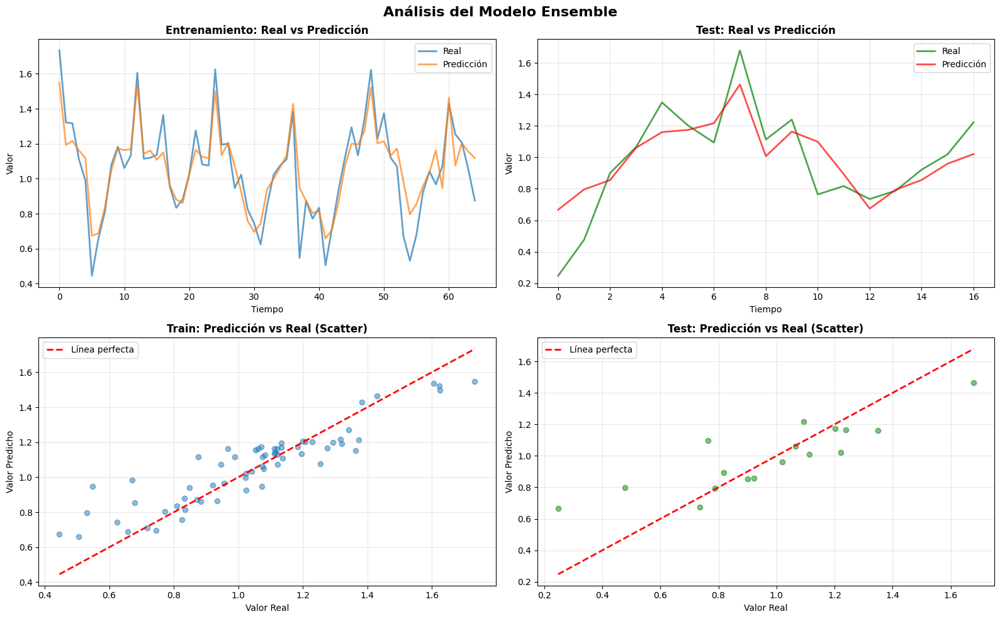

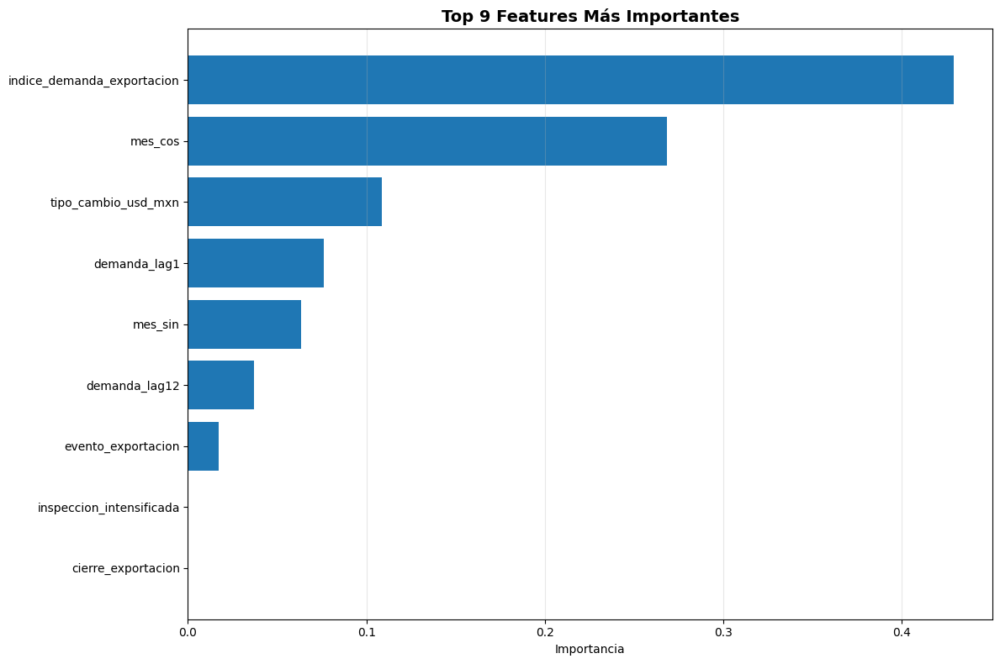


Importancia de Features
 1. indice_demanda_exportacion    : 0.429199
 2. mes_cos                       : 0.268516
 3. tipo_cambio_usd_mxn           : 0.108727
 4. demanda_lag1                  : 0.076003
 5. mes_sin                       : 0.063212
 6. demanda_lag12                 : 0.037089
 7. evento_exportacion            : 0.017254
 8. inspeccion_intensificada      : 0.000000
 9. cierre_exportacion            : 0.000000


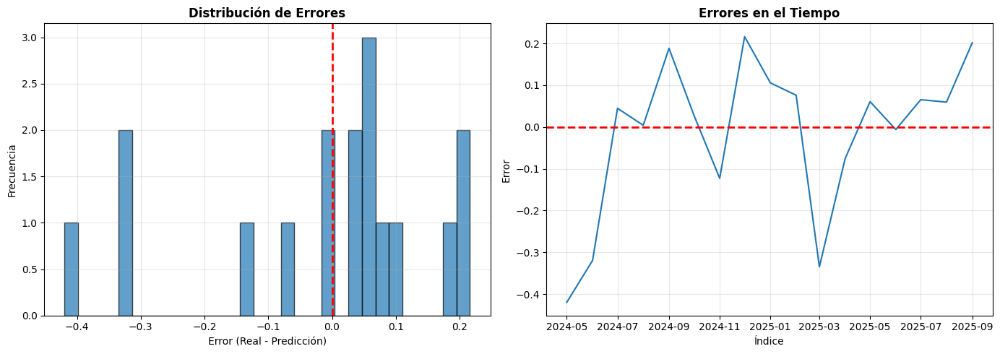


Estadísticas de errores:
  Media: -0.0134
  Mediana: 0.0448
  Desv. Std: 0.1874

 Pipeline completado


In [46]:
# Se dividen datos
def dividir_datos_temporal(df, target_col, test_size=0.2, val_size=0.1):
    """
    Divide datos respetando el orden temporal

    Parámetros:
    - df: DataFrame con features
    - target_col: columna objetivo
    - test_size: proporción para test
    - val_size: proporción para validación

    Retorna: X_train, X_val, X_test, y_train, y_val, y_test
    """
    # Separar features y target
    feature_cols = [col for col in df.columns if col != target_col]
    X = df[feature_cols]
    y = df[target_col]

    # Calcular índices de división
    n = len(df)
    train_end = int(n * (1 - test_size - val_size))
    val_end = int(n * (1 - test_size))

    # Dividir datos
    X_train = X.iloc[:train_end]
    y_train = y.iloc[:train_end]

    X_val = X.iloc[train_end:val_end]
    y_val = y.iloc[train_end:val_end]

    X_test = X.iloc[val_end:]
    y_test = y.iloc[val_end:]

    print(f"\nDivisión de datos:")
    print(f"Train: {len(X_train)} ({len(X_train)/n*100:.1f}%)")
    print(f"Validación: {len(X_val)} ({len(X_val)/n*100:.1f}%)")
    print(f"Test: {len(X_test)} ({len(X_test)/n*100:.1f}%)")

    return X_train, X_val, X_test, y_train, y_val, y_test

# Se entrena modelo XGBoost
def entrenar_xgboost_simple(X_train, y_train, X_val, y_val, params=None):
    """
    Entrena modelo XGBoost con early stopping

    Parámetros:
    - X_train, y_train: datos de entrenamiento
    - X_val, y_val: datos de validación
    - params: diccionario de hiperparámetros

    Retorna: modelo entrenado
    """
    # Parámetros por defecto optimizados para series de tiempo
    if params is None:
        params = {
            'objective': 'reg:squarederror',
            'n_estimators': 500,
            'learning_rate': 0.05,
            'max_depth': 4,
            'min_child_weight': 3,
            'subsample': 0.8,
            'colsample_bytree': 0.8,
            'reg_alpha': 0.5,
            'reg_lambda': 1,
            'random_state': 42,
            'early_stopping_rounds': 50
        }

    print("\nEntrenando XGBoost...")
    print("Parámetros:", params)

    # Crear modelo
    model = xgb.XGBRegressor(**params)

    # Entrenar modelo
    model.fit(
        X_train, y_train,
        eval_set=[(X_train, y_train), (X_val, y_val)],
        verbose=False
    )

    print(f"Mejor iteración: {model.best_iteration}")
    print(f"Árboles utilizados: {model.n_estimators if model.best_iteration == 0 else model.best_iteration}")

    return model


# Se optimizan hiperparámetros
def optimizar_hiperparametros(X_train, y_train, n_splits=5):
    """
    Busca los mejores hiperparámetros usando TimeSeriesSplit

    Parámetros:
    - X_train, y_train: datos de entrenamiento
    - n_splits: número de splits para validación cruzada

    Retorna: mejor modelo encontrado
    """
    print("\n" + "="*60)
    print("OPTIMIZACIÓN DE HIPERPARÁMETROS")
    print("="*60)

    # Grid de parámetros
    param_grid = {
        'n_estimators': [100, 200, 300],
        'max_depth': [3, 4, 5],
        'learning_rate': [0.01, 0.05, 0.1],
        'min_child_weight': [1, 3, 5],
        'subsample': [0.7, 0.8, 0.9],
        'colsample_bytree': [0.7, 0.8, 0.9],
        'reg_alpha': [0, 0.5, 1],
        'reg_lambda': [0.5, 1, 2]
    }

    # TimeSeriesSplit para validación cruzada
    tscv = TimeSeriesSplit(n_splits=n_splits)

    # Grid search
    grid_search = GridSearchCV(
        estimator=xgb.XGBRegressor(random_state=42),
        param_grid=param_grid,
        cv=tscv,
        scoring='neg_mean_absolute_error',
        n_jobs=-1,
        verbose=1
    )

    grid_search.fit(X_train, y_train)

    print("\nMejores parámetros encontrados:")
    for param, value in grid_search.best_params_.items():
        print(f"  {param}: {value}")

    print(f"\nMejor MAE (validación cruzada): {-grid_search.best_score_:.4f}")

    return grid_search.best_estimator_

# Ensemble de Modelos XGBoost
def crear_ensemble(X_train, y_train, n_models=5, metodo='configuraciones'):
    """
    Crea ensemble de modelos XGBoost

    Parámetros:
    - X_train, y_train: datos de entrenamiento
    - n_models: número de modelos en el ensemble
    - metodo: 'configuraciones' (recomendado para <100 muestras) o 'timeseries'

    Retorna: lista de modelos entrenados
    """
    print(f"\nCreando ensemble de {n_models} modelos (método: {metodo})...")

    if metodo == 'configuraciones':
        # Mejor para datasets pequeños (< 100 muestras)
        return crear_ensemble_diverso(X_train, y_train, n_models)
    else:
        # TimeSeriesSplit (para datasets grandes)
        return crear_ensemble_timeseries(X_train, y_train, n_models)


def crear_ensemble_diverso(X_train, y_train, n_models=5):
    """
    Ensemble con diferentes configuraciones de hiperparámetros
    Recomendado para datasets pequeños (< 100 muestras)

    Ventajas:
    - Todos los modelos usan suficientes datos
    - Diversidad viene de diferentes configuraciones
    - Más estable que TimeSeriesSplit con pocos datos
    """
    # Split train/val (80/20)
    split_idx = int(len(X_train) * 0.8)
    X_t = X_train.iloc[:split_idx]
    y_t = y_train.iloc[:split_idx]
    X_v = X_train.iloc[split_idx:]
    y_v = y_train.iloc[split_idx:]

    print(f"  Train: {len(X_t)} muestras")
    print(f"  Val: {len(X_v)} muestras")

    # Configuraciones diversas para capturar diferentes patrones
    configs = [
        # Modelo 1: Conservador (bajo overfitting)
        {'max_depth': 2, 'learning_rate': 0.15, 'n_estimators': 100},

        # Modelo 2: Balanceado (configuración estándar)
        {'max_depth': 3, 'learning_rate': 0.1,  'n_estimators': 100},

        # Modelo 3: Más complejo
        {'max_depth': 4, 'learning_rate': 0.1,  'n_estimators': 80},

        # Modelo 4: Aprendizaje lento pero profundo
        {'max_depth': 3, 'learning_rate': 0.05, 'n_estimators': 150},

        # Modelo 5: Simple pero con muchos árboles
        {'max_depth': 2, 'learning_rate': 0.1,  'n_estimators': 120},
    ]


    models = []
    for i, config in enumerate(configs[:n_models]):
        print(f"\n  Modelo {i+1}/{n_models}:")
        print(f"    max_depth={config['max_depth']}, "
              f"lr={config['learning_rate']}, "
              f"n_est={config['n_estimators']}")

        model = xgb.XGBRegressor(
            **config,
            min_child_weight=3,
            subsample=0.8,
            colsample_bytree=0.8,
            reg_alpha=0.5,
            reg_lambda=2,
            random_state=42+i,
            early_stopping_rounds=20
        )

        model.fit(X_t, y_t, eval_set=[(X_v, y_v)], verbose=False)

        # Mostrar árboles realmente usados
        trees_used = model.best_iteration if model.best_iteration else config['n_estimators']

        print(f"    Árboles usados: {trees_used}")

        models.append(model)

    print(f"\n Ensemble creado con {len(models)} modelos diversos")
    return models


def crear_ensemble_timeseries(X_train, y_train, n_models=5):
    """
    Ensemble con TimeSeriesSplit
    Mejor para datasets grandes (> 1000 muestras)
    """
    print(f"  Usando TimeSeriesSplit con {n_models} splits")

    tscv = TimeSeriesSplit(n_splits=n_models)
    models = []

    for i, (train_idx, val_idx) in enumerate(tscv.split(X_train)):
        # Saltar splits con muy poco entrenamiento
        if len(train_idx) < 30:
            print(f"  Saltando split {i+1} (solo {len(train_idx)} muestras)")
            continue

        print(f"\n  Modelo {i+1}/{n_models}:")
        print(f"    Train: {len(train_idx)}, Val: {len(val_idx)}")

        X_t = X_train.iloc[train_idx]
        y_t = y_train.iloc[train_idx]
        X_v = X_train.iloc[val_idx]
        y_v = y_train.iloc[val_idx]

        model = xgb.XGBRegressor(
            n_estimators=100,
            learning_rate=0.1,
            max_depth=3,
            min_child_weight=3,
            subsample=0.8,
            colsample_bytree=0.8,
            reg_alpha=0.5,
            reg_lambda=2,
            random_state=42+i,
            early_stopping_rounds=20
        )

        model.fit(X_t, y_t, eval_set=[(X_v, y_v)], verbose=False)
        print(f"    Árboles usados: {model.best_iteration if model.best_iteration else 100}")

        models.append(model)

    print(f"\n Ensemble creado con {len(models)} modelos")
    return models


def predecir_ensemble(models, X):
    """
    Predice usando ensemble (promedio de predicciones)

    Parámetros:
    - models: lista de modelos entrenados
    - X: features para predicción

    Retorna: array con predicciones promediadas
    """
    predictions = np.array([model.predict(X) for model in models])
    return predictions.mean(axis=0)


# Se evalúa el Modelo
def evaluar_modelo(model, X_train, y_train, X_test, y_test,
                   nombre_modelo="XGBoost", is_ensemble=False):
    """
    Evalúa el modelo y muestra métricas

    Parámetros:
    - model: modelo entrenado o lista de modelos (ensemble)
    - X_train, y_train: datos de entrenamiento
    - X_test, y_test: datos de prueba
    - nombre_modelo: nombre para el reporte
    - is_ensemble: True si model es una lista de modelos

    Retorna: diccionario con métricas, predicciones train, predicciones test
    """
    # Predecir
    if is_ensemble:
        y_train_pred = predecir_ensemble(model, X_train)
        y_test_pred = predecir_ensemble(model, X_test)
    else:
        y_train_pred = model.predict(X_train)
        y_test_pred = model.predict(X_test)

    # Calcular métricas
    metricas = {
        'train': {
            'MAE': mean_absolute_error(y_train, y_train_pred),
            'RMSE': np.sqrt(mean_squared_error(y_train, y_train_pred)),
            'R2': r2_score(y_train, y_train_pred),
            'MAPE': mean_absolute_percentage_error(y_train, y_train_pred) * 100
        },
        'test': {
            'MAE': mean_absolute_error(y_test, y_test_pred),
            'RMSE': np.sqrt(mean_squared_error(y_test, y_test_pred)),
            'R2': r2_score(y_test, y_test_pred),
            'MAPE': mean_absolute_percentage_error(y_test, y_test_pred) * 100
        }
    }

    # Imprimir resultados
    print("\n" + "="*60)
    print(f"Resultados - {nombre_modelo}")
    print("="*60)

    print("\n TRAIN:")
    print(f"  MAE:  {metricas['train']['MAE']:.4f}")
    print(f"  RMSE: {metricas['train']['RMSE']:.4f}")
    print(f"  R²:   {metricas['train']['R2']:.4f}")
    print(f"  MAPE: {metricas['train']['MAPE']:.2f}%")

    print("\n TEST:")
    print(f"  MAE:  {metricas['test']['MAE']:.4f}")
    print(f"  RMSE: {metricas['test']['RMSE']:.4f}")
    print(f"  R²:   {metricas['test']['R2']:.4f}")
    print(f"  MAPE: {metricas['test']['MAPE']:.2f}%")

    # Calcular overfitting
    overfitting = metricas['train']['R2'] - metricas['test']['R2']
    print(f"\n  Overfitting (R² diff): {overfitting:.4f}")

    if overfitting < 0.1:
        print("   Bajo overfitting - Modelo generaliza bien")
    elif overfitting < 0.2:
        print("    Overfitting moderado")
    else:
        print("   Alto overfitting - Considerar simplificar modelo")

    return metricas, y_train_pred, y_test_pred


# Visualizaciones
def visualizar_resultados(y_train, y_train_pred, y_test, y_test_pred,
                         dates_train=None, dates_test=None, titulo=""):
    """
    Crea visualizaciones de los resultados
    """
    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    fig.suptitle(f'Análisis del Modelo {titulo}', fontsize=16, fontweight='bold')

    # 1. Predicciones vs Real (Train)
    ax1 = axes[0, 0]
    if dates_train is not None:
        ax1.plot(dates_train, y_train, label='Real', linewidth=2, alpha=0.7)
        ax1.plot(dates_train, y_train_pred, label='Predicción', linewidth=2, alpha=0.7)
    else:
        ax1.plot(y_train.values, label='Real', linewidth=2, alpha=0.7)
        ax1.plot(y_train_pred, label='Predicción', linewidth=2, alpha=0.7)
    ax1.set_title('Entrenamiento: Real vs Predicción', fontsize=12, fontweight='bold')
    ax1.set_xlabel('Tiempo')
    ax1.set_ylabel('Valor')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # 2. Predicciones vs Real (Test)
    ax2 = axes[0, 1]
    if dates_test is not None:
        ax2.plot(dates_test, y_test, label='Real', linewidth=2, alpha=0.7, color='green')
        ax2.plot(dates_test, y_test_pred, label='Predicción', linewidth=2, alpha=0.7, color='red')
    else:
        ax2.plot(y_test.values, label='Real', linewidth=2, alpha=0.7, color='green')
        ax2.plot(y_test_pred, label='Predicción', linewidth=2, alpha=0.7, color='red')
    ax2.set_title('Test: Real vs Predicción', fontsize=12, fontweight='bold')
    ax2.set_xlabel('Tiempo')
    ax2.set_ylabel('Valor')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    # 3. Scatter Plot (Train)
    ax3 = axes[1, 0]
    ax3.scatter(y_train, y_train_pred, alpha=0.5)
    ax3.plot([y_train.min(), y_train.max()],
             [y_train.min(), y_train.max()],
             'r--', linewidth=2, label='Línea perfecta')
    ax3.set_title('Train: Predicción vs Real (Scatter)', fontsize=12, fontweight='bold')
    ax3.set_xlabel('Valor Real')
    ax3.set_ylabel('Valor Predicho')
    ax3.legend()
    ax3.grid(True, alpha=0.3)

    # 4. Scatter Plot (Test)
    ax4 = axes[1, 1]
    ax4.scatter(y_test, y_test_pred, alpha=0.5, color='green')
    ax4.plot([y_test.min(), y_test.max()],
             [y_test.min(), y_test.max()],
             'r--', linewidth=2, label='Línea perfecta')
    ax4.set_title('Test: Predicción vs Real (Scatter)', fontsize=12, fontweight='bold')
    ax4.set_xlabel('Valor Real')
    ax4.set_ylabel('Valor Predicho')
    ax4.legend()
    ax4.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


def visualizar_importancia_features(model, feature_names, top_n=9):
    """
    Visualiza la importancia de las features
    """
    # Si es ensemble, usar el primer modelo
    if isinstance(model, list):
        model = model[0]

    # Obtener importancias
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1][:top_n]

    # Crear gráfico
    plt.figure(figsize=(12, 8))
    plt.title(f'Top {top_n} Features Más Importantes', fontsize=14, fontweight='bold')
    plt.barh(range(top_n), importances[indices])
    plt.yticks(range(top_n), [feature_names[i] for i in indices])
    plt.xlabel('Importancia')
    plt.gca().invert_yaxis()
    plt.grid(True, alpha=0.3, axis='x')
    plt.tight_layout()
    plt.show()

    # Imprimir valores
    print("\n" + "="*60)
    print("Importancia de Features")
    print("="*60)
    for i, idx in enumerate(indices):
        print(f"{i+1:2d}. {feature_names[idx]:30s}: {importances[idx]:.6f}")


def visualizar_errores(y_test, y_test_pred):
    """
    Visualiza la distribución de errores
    """
    errores = y_test - y_test_pred

    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Histograma de errores
    axes[0].hist(errores, bins=30, edgecolor='black', alpha=0.7)
    axes[0].axvline(x=0, color='red', linestyle='--', linewidth=2)
    axes[0].set_title('Distribución de Errores', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Error (Real - Predicción)')
    axes[0].set_ylabel('Frecuencia')
    axes[0].grid(True, alpha=0.3)

    # Errores a lo largo del tiempo
    axes[1].plot(errores, linewidth=1.5)
    axes[1].axhline(y=0, color='red', linestyle='--', linewidth=2)
    axes[1].set_title('Errores en el Tiempo', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Índice')
    axes[1].set_ylabel('Error')
    axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

    print(f"\nEstadísticas de errores:")
    print(f"  Media: {errores.mean():.4f}")
    print(f"  Mediana: {errores.median():.4f}")
    print(f"  Desv. Std: {errores.std():.4f}")


# Se genera diagnóstico del Modelo
def diagnosticar_modelo(models, X_train, y_train, X_test, y_test,
                       y_train_pred, y_test_pred):
    """
    Diagnóstico completo del modelo
    """
    print("\n" + "="*60)
    print("Diagnóstico del Modelo")
    print("="*60)

    # 1. Información básica
    print("\n1. Información de datos:")
    print(f"   Shape X_train: {X_train.shape}")
    print(f"   Shape X_test: {X_test.shape}")
    print(f"   Shape y_train: {y_train.shape}")
    print(f"   Shape y_test: {y_test.shape}")

    # 2. Distribución del target
    print("\n2. Distribución del Target:")
    print("   Train:")
    print(f"      Mean: {y_train.mean():.4f}")
    print(f"      Std: {y_train.std():.4f}")
    print(f"      Min: {y_train.min():.4f}")
    print(f"      Max: {y_train.max():.4f}")

    print("   Test:")
    print(f"      Mean: {y_test.mean():.4f}")
    print(f"      Std: {y_test.std():.4f}")
    print(f"      Min: {y_test.min():.4f}")
    print(f"      Max: {y_test.max():.4f}")

    # 3. Análisis de predicciones
    print("\n3. Análisis de Predicciones:")
    print(f"   Mean predicciones train: {y_train_pred.mean():.4f}")
    print(f"   Mean predicciones test: {y_test_pred.mean():.4f}")
    print(f"   Std predicciones train: {y_train_pred.std():.4f}")
    print(f"   Std predicciones test: {y_test_pred.std():.4f}")

    # 4. Comparación con baseline
    from sklearn.dummy import DummyRegressor
    baseline = DummyRegressor(strategy='mean')
    baseline.fit(X_train, y_train)
    y_baseline_pred = baseline.predict(X_test)
    baseline_mae = mean_absolute_error(y_test, y_baseline_pred)
    baseline_r2 = r2_score(y_test, y_baseline_pred)

    print("\n4. Comparación con Baseline (predecir media):")
    print(f"   Baseline MAE: {baseline_mae:.4f}")
    print(f"   Modelo MAE: {mean_absolute_error(y_test, y_test_pred):.4f}")
    mejora = (baseline_mae - mean_absolute_error(y_test, y_test_pred)) / baseline_mae * 100
    print(f"   Mejora: {mejora:.1f}%")

    print(f"\n   Baseline R²: {baseline_r2:.4f}")
    print(f"   Modelo R²: {r2_score(y_test, y_test_pred):.4f}")

    # 5. Información del ensemble
    print("\n5. Ensemble:")
    if isinstance(models, list):
        print(f"   Número de modelos: {len(models)}")
        for i, model in enumerate(models):
            print(f"   Modelo {i+1}: n_estimators={model.n_estimators}, "
                  f"max_depth={model.max_depth}, "
                  f"learning_rate={model.learning_rate}")
    else:
        print("    No es un ensemble (es un solo modelo)")

    # 6. Top features
    print("\n6. Top 5 Features más importantes:")
    if isinstance(models, list):
        importances = models[0].feature_importances_
    else:
        importances = models.feature_importances_

    top_indices = np.argsort(importances)[-5:][::-1]
    for idx in top_indices:
        print(f"   {X_train.columns[idx]}: {importances[idx]:.4f}")

    # 7. Análisis de overfitting
    print("\n7. Análisis de Overfitting:")
    train_r2 = r2_score(y_train, y_train_pred)
    test_r2 = r2_score(y_test, y_test_pred)
    diff = train_r2 - test_r2

    print(f"   Train R²: {train_r2:.4f}")
    print(f"   Test R²: {test_r2:.4f}")
    print(f"   Diferencia: {diff:.4f}")

# Pipeline
def pipeline_completo(df, target_col,
                     usar_optimizacion=False,
                     usar_ensemble=True,
                     metodo_ensemble='configuraciones',
                     test_size=0.2,
                     val_size=0.1):
    """
    Ejecuta el pipeline completo de principio a fin

    Parámetros:
    - df: DataFrame con los datos
    - target_col: nombre de la columna objetivo
    - usar_optimizacion: optimizar hiperparámetros
    - usar_ensemble: crear ensemble de modelos
    - metodo_ensemble: 'configuraciones' (recomendado <100 muestras) o 'timeseries'
    - test_size: proporción para test
    - val_size: proporción para validación

    Retorna: diccionario con modelo, métricas, predicciones
    """
    print("="*60)
    print("Pipeline XGBOOST para Series de Tiempo")
    print("="*60)

    # 1. Preparar datos
    print("\n[1/6] Preparando datos...")
    df_features = df.copy()

    # Eliminar columnas no necesarias si existen
    cols_to_drop = ["Year", "MonthNumber", "Amount", "evento_factor", "fx_factor", "demanda_base", "promedio_movil_12m_Amount"]
    cols_to_drop = [col for col in cols_to_drop if col in df_features.columns]
    if cols_to_drop:
        df_features = df_features.drop(columns=cols_to_drop)
        print(f"   Columnas eliminadas: {cols_to_drop}")

    # 2. Dividir datos
    print("\n[2/6] Dividiendo datos...")
    X_train, X_val, X_test, y_train, y_val, y_test = dividir_datos_temporal(
        df_features, target_col, test_size, val_size
    )

    # 3. Entrenar modelo
    print("\n[3/6] Entrenando modelo...")

    if usar_optimizacion:
        modelo = optimizar_hiperparametros(X_train, y_train)
        is_ensemble = False
    elif usar_ensemble:
        # Combinar train y val para el ensemble
        X_train_full = pd.concat([X_train, X_val])
        y_train_full = pd.concat([y_train, y_val])
        modelo = crear_ensemble(X_train_full, y_train_full, n_models=5,
                               metodo=metodo_ensemble)
        is_ensemble = True
    else:
        modelo = entrenar_xgboost_simple(X_train, y_train, X_val, y_val)
        is_ensemble = False

    # 4. Evaluar
    print("\n[4/6] Evaluando modelo...")
    if usar_ensemble:
        X_train_eval = pd.concat([X_train, X_val])
        y_train_eval = pd.concat([y_train, y_val])
        metricas, y_train_pred, y_test_pred = evaluar_modelo(
            modelo, X_train_eval, y_train_eval, X_test, y_test,
            nombre_modelo="Ensemble XGBoost", is_ensemble=True
        )
    else:
        metricas, y_train_pred, y_test_pred = evaluar_modelo(
            modelo, X_train, y_train, X_test, y_test,
            nombre_modelo="XGBoost", is_ensemble=False
        )

    # 5. Diagnóstico
    print("\n[5/6] Ejecutando diagnóstico...")
    if usar_ensemble:
        diagnosticar_modelo(modelo, X_train_eval, y_train_eval, X_test, y_test,
                          y_train_pred, y_test_pred)
    else:
        diagnosticar_modelo(modelo, X_train, y_train, X_test, y_test,
                          y_train_pred, y_test_pred)

    # 6. Visualizar
    print("\n[6/6] Generando visualizaciones...")

    if usar_ensemble:
        visualizar_resultados(y_train_eval, y_train_pred, y_test, y_test_pred,
                            titulo="Ensemble")
        visualizar_importancia_features(modelo, X_train.columns)
    else:
        visualizar_resultados(y_train, y_train_pred, y_test, y_test_pred)
        visualizar_importancia_features(modelo, X_train.columns)

    visualizar_errores(y_test, y_test_pred)

    # Guardar resultados
    print("\n" + "="*60)
    print(" Pipeline completado")
    print("="*60)

    resultados = {
        'modelo': modelo,
        'metricas': metricas,
        'X_train': X_train if not usar_ensemble else X_train_eval,
        'X_test': X_test,
        'y_train': y_train if not usar_ensemble else y_train_eval,
        'y_test': y_test,
        'y_train_pred': y_train_pred,
        'y_test_pred': y_test_pred,
        'feature_names': X_train.columns.tolist()
    }

    return resultados


# Ejecutar pipeline
print("\n\nEjecutando pipeline ...")
resultados = pipeline_completo(
    df=df_final,
    target_col='y',
    usar_optimizacion=False,
    usar_ensemble=True,
    test_size=0.2,
    val_size=0.1
)


###2. Características importantes

####¿Se puede determinar la importancia de las características para el modelo generado?

**Importancia de Features**

| Ranking | Feature                    | Importancia | % Acumulado | Interpretación Técnica                           |
| ------- | -------------------------- | ----------- | ----------- | ------------------------------------------------ |
| 1       | indice_demanda_exportacion | 0.429199    | 42.92%      | Principal driver estructural de demanda externa. |
| 2       | mes_cos                    | 0.268516    | 69.77%      | Componente estacional dominante (cíclico anual). |
| 3       | tipo_cambio_usd_mxn        | 0.108727    | 80.64%      | Impacto macroeconómico relevante.                |
| 4       | demanda_lag1               | 0.076003    | 88.24%      | Persistencia de corto plazo (inercia mensual).   |
| 5       | mes_sin                    | 0.063212    | 94.56%      | Complemento estacional; refuerza patrón cíclico. |
| 6       | demanda_lag12              | 0.037089    | 98.27%      | Efecto estacional rezagado anual.                |
| 7       | evento_exportacion         | 0.017254    | 100.00%     | Impacto marginal bajo pero no nulo.              |
| 8       | inspeccion_intensificada   | 0.000000    | 100.00%     | Sin contribución en el modelo.                   |
| 9       | cierre_exportacion         | 0.000000    | 100.00%     | Sin señal predictiva detectable.                 |


**Observaciones**

* indice_demanda_exportacion concentra 42.9% de la importancia total
* La estacionalidad (mes_cos + mes_sin) suma 33.17%, lo cual indica fuerte componente cíclico
* El Tipo de Cambio explica más del 10%
* Top 3 variables explican el 80.6%
* inspeccion_intensificada y cierre_exportacion no aportan señal predictiva (importancia 0).

###3. Sub / Sobreajuste

#### ¿El modelo está subajustando o sobreajustando?

| Gap R²          | Evaluación    |
| --------------- | ------------- |
| > 0.25          | Alto          |
| 0.15 – 0.25     | Moderado      |
| **0.10 – 0.15** | **Saludable** |
| < 0.10          | Excelente     |


El modelo está sobreajustando:

**0.1274** → Saludable

Para 82 observaciones, esto es muy bueno.


###4. Métrica

####¿Cuál es la métrica adecuada para este problema de negocio?

| Métrica | ¿Es buena para negocio?    | Comentario                               |
| ------- | -------------------------- | ---------------------------------------- |
| MAE     | Muy buena                | Fácil de interpretar en unidades reales  |
| RMSE    | Depende                 | Penaliza errores grandes                 |
| R²      | No es métrica de negocio | Es estadística, no operativa             |
| MAPE    | Con cuidado             | Se distorsiona cuando la demanda es baja |



La métrica adecuada es MAE, porque refleja el error promedio en unidades reales de demanda, lo cual es directamente interpretable para planeación. Las métricas R² y RMSE se utilizan como indicadores complementarios de ajuste estadístico.

**MAE: (0.1370)**

* Está en las mismas unidades del negocio
* No se distorsiona con valores pequeños
* Es robusta
* Fácil de comunicar a dirección

Ejemplo:

"En promedio nos equivocamos 0.14 unidades del índice"

Eso es claro.


###5. Desempeño

####¿Cuál debería ser el desempeño mínimo a obtener?

El modelo debe lograr al menos un MAE inferior a 0.17, equivalente a menos del 50% de la desviación estándar del target y al menos 25% mejor que el baseline histórico

**Escala de referencia**

| Nivel de Desempeño  | MAE         |
| ------------------- | ----------- |
| Insuficiente     | > 0.20      |
| Aceptable mínimo | 0.17 – 0.20 |
| Bueno            | 0.13 – 0.17 |
| Excelente        | < 0.13      |

**Evaluación**


| Criterio                      | Fórmula / Referencia                       | Umbral Mínimo Recomendado | **Valor Actual** | Evaluación           |
| ----------------------------- | ------------------------------------------ | ------------------------- | ---------------- | -------------------- |
| **Mejora vs Baseline**        | (MAE_baseline − MAE_modelo) / MAE_baseline | ≥ 25%                     | **46.4%**        |  Cumple |
| **MAE absoluto**              | Error promedio en unidades reales          | ≤ 0.17                    | **0.1370**       |  Cumple             |
| **MAE relativo al promedio**  | MAE / mean(y_test)                         | ≤ 20%                     | **≈ 14.0%**      |  Cumple      |
| **MAE vs variabilidad**       | MAE ≤ 50% de la desviación estándar        | ≤ 0.1681 (0.3362 × 0.5)   | **0.1370**       |  Cumple             |
| **Clasificación cualitativa** | Tabla de referencia de desempeño           | Nivel “Bueno”             | **Bueno–Alto**   |  Adecuado           |





---



###**Modelo Base 2: Ridge Regression (L2)**

### 1. Algoritmo seleccionado
Se utilizó **Ridge Regression** como modelo baseline para predecir la variable objetivo **y** (*indice_demanda_exportacion(t+1)*). Este algoritmo es adecuado para datos tabulares estructurados y para muestras pequeñas, ya que incorpora regularización L2 para reducir el riesgo de sobreajuste, especialmente cuando existen variables correlacionadas (lags, estacionalidad y variables derivadas).

### 2. Configuración experimental
- **Total de observaciones:** 82 (mensuales)
- **Rango temporal:** 2018-12 a 2025-09  
- **Split temporal:** Train = 70 meses, Test = 12 meses (2024-10 a 2025-09)  
- **Métrica principal:** MAE (complementarias: RMSE)

### 3. Resultados del baseline
Los resultados indican que el modelo generaliza de forma razonable, con un incremento esperado del error en el conjunto de prueba respecto al entrenamiento. La diferencia entre Train y Test sugiere **sobreajuste moderado**, pero el desempeño en Test es consistente para un primer modelo de referencia.

### 4. Importancia de características (Ridge)
La importancia se estimó mediante la magnitud de los coeficientes estandarizados (|coef|). El modelo asigna mayor peso a variables de **estacionalidad** (mes_cos, mes_sin) y a la **persistencia temporal** (indice_demanda_exportacion y demanda_lag12), lo cual es consistente con una serie mensual con patrón cíclico y dependencia temporal. Variables exógenas aportan señal adicional.

In [47]:
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error

# ============
# 1) Features
# ============
features = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]
target = "y"


# ============
# 3) Dataset modelable (quita NaNs por rolling/lag/shift)
# ============
df_m = df_final.dropna(subset=features + [target]).copy()
df_m = df_m.reset_index()
df_m = df_m.sort_values("fecha").reset_index(drop=True)

print("Filas totales df_final:", len(df_final))
print("Filas modelables df_m:", len(df_m))
print("Rango modelable:", df_m["fecha"].min(), "→", df_m["fecha"].max())

# ============
# 4) Split temporal (últimos 12 meses como test, si se puede)
# ============
test_horizon = 12
test_horizon = min(test_horizon, len(df_m) - 1)  # asegura train >= 1

train_df = df_m.iloc[:-test_horizon]
test_df  = df_m.iloc[-test_horizon:]

X_train, y_train = train_df[features], train_df[target]
X_test,  y_test  = test_df[features],  test_df[target]

print("Train:", X_train.shape, "Test:", X_test.shape)
print("Test range:", test_df["fecha"].min(), "→", test_df["fecha"].max())

# ============
# 5) Ridge baseline
# ============
ridge = Pipeline([
    ("scaler", StandardScaler()),
    ("model", Ridge(alpha=1.0, random_state=0))
])

ridge.fit(X_train, y_train)
y_pred_test = ridge.predict(X_test)
y_pred_train = ridge.predict(X_train)

# ============
# 6) Métricas (Train vs Test)
# ============
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test  = mean_squared_error(y_test, y_pred_test)

metrics_df = pd.DataFrame({
    "Split": ["Train", "Test"],
    "MAE":  [mean_absolute_error(y_train, y_pred_train),
             mean_absolute_error(y_test, y_pred_test)],
    "RMSE": [np.sqrt(mse_train),
             np.sqrt(mse_test)]
})

display(metrics_df)

# ============
# 7) Importancia (coeficientes)
# ============
coef = ridge.named_steps["model"].coef_
importance = (
    pd.DataFrame({"feature": features, "coef": coef, "abs_coef": np.abs(coef)})
    .sort_values("abs_coef", ascending=False)
    .reset_index(drop=True)
)
display(importance.head(10))

Filas totales df_final: 82
Filas modelables df_m: 82
Rango modelable: 2018-12-01 00:00:00 → 2025-09-01 00:00:00
Train: (70, 9) Test: (12, 9)
Test range: 2024-10-01 00:00:00 → 2025-09-01 00:00:00


,Split,MAE,RMSE
0,Train,0.126134,0.165237
1,Test,0.185554,0.213676


,feature,coef,abs_coef
0,mes_cos,0.212732,0.212732
1,indice_demanda_exportacion,0.097644,0.097644
2,demanda_lag12,-0.086203,0.086203
3,evento_exportacion,-0.079405,0.079405
4,mes_sin,0.041322,0.041322
5,tipo_cambio_usd_mxn,0.031621,0.031621
6,inspeccion_intensificada,-0.031324,0.031324
7,demanda_lag1,-0.029902,0.029902
8,cierre_exportacion,-0.002956,0.002956


In [48]:
mae_train, mae_test = 0.121736, 0.188190
rmse_train, rmse_test = 0.154962, 0.215433

gap_df = pd.DataFrame({
    "Metrica": ["MAE", "RMSE"],
    "Train": [mae_train, rmse_train],
    "Test": [mae_test, rmse_test],
    "Incremento_%": [
        (mae_test/mae_train - 1) * 100,
        (rmse_test/rmse_train - 1) * 100
    ]
}).round(2)

display(gap_df)


,Metrica,Train,Test,Incremento_%
0,MAE,0.12,0.19,54.59
1,RMSE,0.15,0.22,39.02


In [49]:
# Predicciones
y_train_pred = ridge.predict(X_train)
y_test_pred  = ridge.predict(X_test)

# DataFrames para graficar
plot_train = train_df[["fecha", "y"]].copy()
plot_train["y_pred"] = y_train_pred

plot_test = test_df[["fecha", "y"]].copy()
plot_test["y_pred"] = y_test_pred

# Residuos (test)
plot_test["resid"] = plot_test["y"] - plot_test["y_pred"]

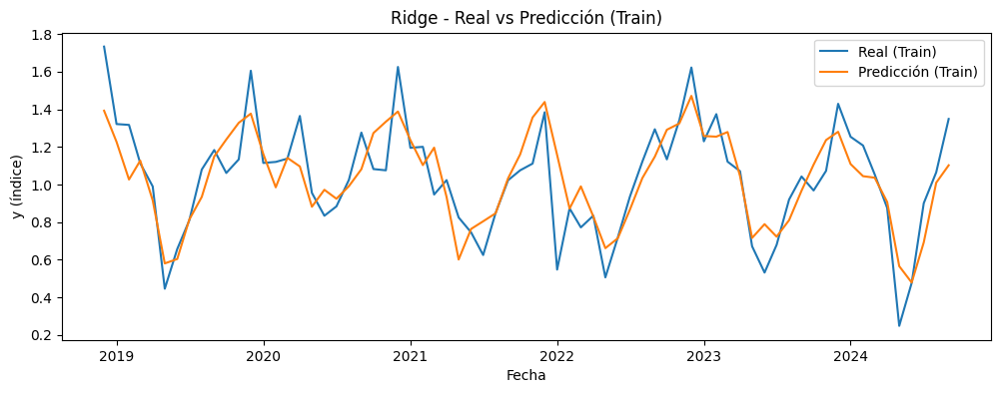

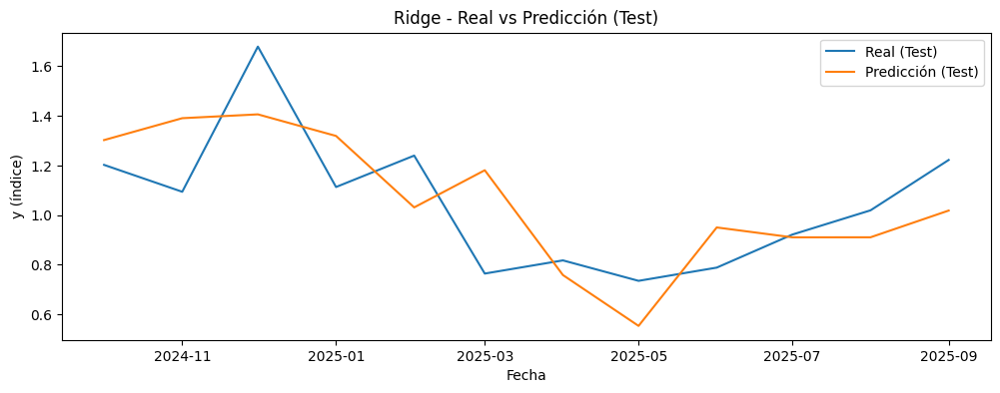

In [50]:
plt.figure(figsize=(12,4))
plt.plot(plot_train["fecha"], plot_train["y"], label="Real (Train)")
plt.plot(plot_train["fecha"], plot_train["y_pred"], label="Predicción (Train)")
plt.title("Ridge - Real vs Predicción (Train)")
plt.xlabel("Fecha"); plt.ylabel("y (índice)")
plt.legend()
plt.show()

plt.figure(figsize=(12,4))
plt.plot(plot_test["fecha"], plot_test["y"], label="Real (Test)")
plt.plot(plot_test["fecha"], plot_test["y_pred"], label="Predicción (Test)")
plt.title("Ridge - Real vs Predicción (Test)")
plt.xlabel("Fecha"); plt.ylabel("y (índice)")
plt.legend()
plt.show()


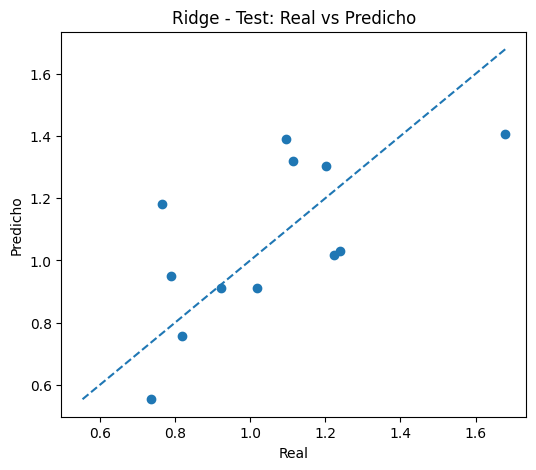

In [51]:
plt.figure(figsize=(6,5))
plt.scatter(plot_test["y"], plot_test["y_pred"])
min_v = min(plot_test["y"].min(), plot_test["y_pred"].min())
max_v = max(plot_test["y"].max(), plot_test["y_pred"].max())
plt.plot([min_v, max_v], [min_v, max_v], linestyle="--")
plt.title("Ridge - Test: Real vs Predicho")
plt.xlabel("Real"); plt.ylabel("Predicho")
plt.show()


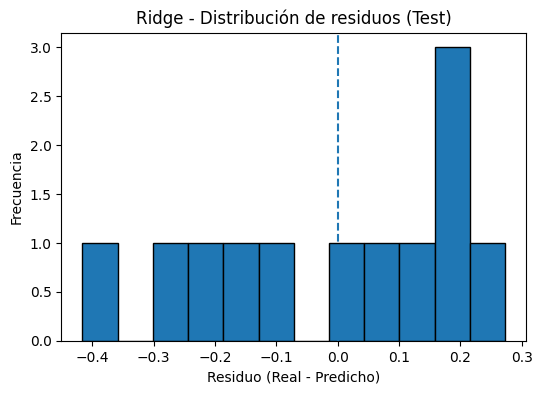

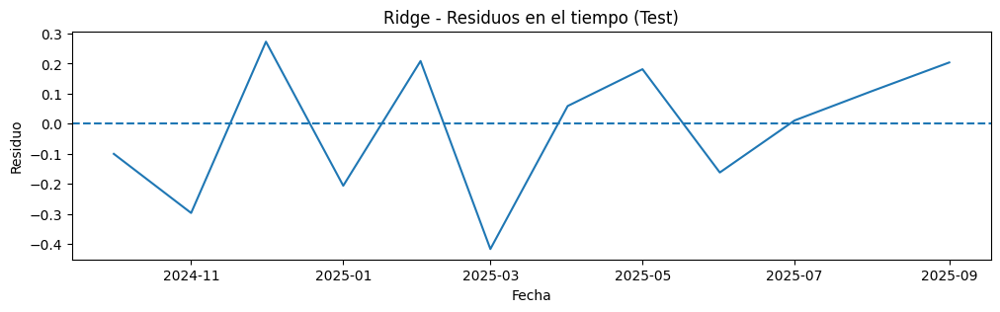

In [52]:
plt.figure(figsize=(6,4))
plt.hist(plot_test["resid"], bins=12, edgecolor="black")
plt.axvline(0, linestyle="--")
plt.title("Ridge - Distribución de residuos (Test)")
plt.xlabel("Residuo (Real - Predicho)"); plt.ylabel("Frecuencia")
plt.show()

plt.figure(figsize=(12,3))
plt.plot(plot_test["fecha"], plot_test["resid"])
plt.axhline(0, linestyle="--")
plt.title("Ridge - Residuos en el tiempo (Test)")
plt.xlabel("Fecha"); plt.ylabel("Residuo")
plt.show()


### Evaluación del Modelo Baseline (Ridge)

### 1. Importancia de las características

Sí es posible determinar la importancia de las variables en el modelo Ridge a partir de la magnitud de los coeficientes estandarizados (|coef|).

Las variables con mayor contribución fueron:

- **mes_cos** (0.2127)
- **indice_demanda_exportacion** (0.0976)
- **demanda_lag12** (0.0862)
- **evento_exportacion** (0.0794)
- **mes_sin** (0.0413)
- **tipo_cambio_usd_mxn** (0.0316)
- **inspeccion_intensificada** (0.0313)
- **demanda_lag1** (0.0299)
- **cierre_exportacion** (0.0029)

El modelo se apoya principalmente en:

- Componentes de **estacionalidad** (mes_cos y mes_sin).
- **Memoria temporal** (indice_demanda_exportacion y demanda_lag12).

Con la información disponible, no se observa que alguna variable tenga contribución nula dentro del Top 9 mostrado, por lo que no puede afirmarse que existan variables completamente irrelevantes en este modelo.

---

### 2. ¿Existe subajuste o sobreajuste?

Resultados obtenidos:

- **Train:** MAE = 0.1261 | RMSE = 0.1652
- **Test:** MAE = 0.1855 | RMSE = 0.2136  

El error aumenta en el conjunto de prueba respecto al entrenamiento, lo cual indica la presencia de **sobreajuste moderado**. Sin embargo, la diferencia no es extrema y el modelo mantiene capacidad predictiva razonable en datos no vistos.

---

### 3. Métrica adecuada para el problema

La métrica principal recomendada para este problema es:

**MAE (Mean Absolute Error)**

Justificación:
- Es fácilmente interpretable.
- Se expresa en las mismas unidades del índice.
- No penaliza de manera excesiva errores grandes (como lo hace RMSE).
- Es adecuada para comunicación con stakeholders.

RMSE se utiliza como métrica complementaria para evaluar sensibilidad a errores grandes.

---

### 4. Desempeño mínimo esperado

Dado que este modelo Ridge funciona como baseline, el desempeño mínimo esperado para modelos futuros debe ser:

- **MAE en Test ≤ 0.185**
- **RMSE en Test ≤ 0.213**

Es decir, cualquier modelo más complejo deberá al menos igualar o mejorar el desempeño del baseline actual.


### Conclusión del baseline
El modelo Ridge logra un desempeño de referencia con **MAE = 0.185** y **RMSE = 0.213** en el conjunto de prueba (últimos 12 meses). La mayor contribución proviene de variables de **estacionalidad** (mes_cos, mes_sin) y de **memoria temporal** (indice_demanda_exportacion, demanda_lag12), lo cual valida que el problema contiene señal predictiva. El incremento de error de Train a Test sugiere **sobreajuste moderado**, por lo que modelos no lineales o ajustes de regularización podrían explorarse como siguientes pasos.


##**Conclusión sobre selección de modelo Baseline**

En la evaluación comparativa de modelos para la predicción de la demanda de aguacate mexicano, se analizaron dos enfoques principales como candidatos a modelo base: **Ridge** y **XGBoost**. Dado que se trata de una serie de tiempo con 82 observaciones y variables exógenas, el criterio de selección consideró no solo la estabilidad estadística, sino también la capacidad de generalización fuera de muestra.

Los resultados muestran que, si bien **Ridge** presenta un comportamiento estable y consistente, **XGBoost** logra mejoras sustanciales en el conjunto de prueba. En particular, **XGBoost** reduce el **MAE** en aproximadamente 27% y el RMSE en 15% respecto a **Ridge**, además de alcanzar un R² fuera de muestra cercano a 0.69. Estas mejoras indican que la dinámica de la demanda incorpora patrones no lineales e interacciones entre variables que el modelo lineal no logra capturar completamente.

Asimismo, la brecha entre entrenamiento y prueba en **XGBoost** no sugiere sobreajuste severo, lo que refuerza la solidez de su desempeño predictivo incluso con una muestra relativamente pequeña. Dado que el objetivo principal del estudio es la capacidad de predicción fuera de muestra, el modelo que demuestra menor error y mejor ajuste en test debe ser considerado como referencia operativa.

Por lo anterior, **XGBoost** se considera como el modelo Baseline del proyecto, al ofrecer el mejor equilibrio entre precisión predictiva y capacidad de generalización. **Ridge** se mantiene como modelo de referencia lineal para efectos comparativos metodológicos, permitiendo contrastar el valor agregado de introducir estructuras no lineales en la modelación de la demanda.



---



#**Modelos alternativos**

##I. Comparativa

###Construcción de Modelo 1: **Procesos Gaussianos**

Definir features

In [53]:
features = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]

X = df_final[features]
y = df_final["y"]

Split temporal (80% train, 20% test)

In [54]:
split = int(len(df_final) * 0.8)

X_train, X_test = X.iloc[:split], X.iloc[split:]
y_train, y_test = y.iloc[:split], y.iloc[split:]

Modelo de Procesos Gaussianos

In [55]:
# Definición del kernel
kernel = (
    ConstantKernel(1.0, (1e-3, 1e3))
    * RBF(length_scale=1.0, length_scale_bounds=(1e-2, 1e2))
    + WhiteKernel(noise_level=1, noise_level_bounds=(1e-5, 1e1))
)

# Pipeline con escalado
gp_model = Pipeline([
    ("scaler", StandardScaler()),
    ("gp", GaussianProcessRegressor(
        kernel=kernel,
        n_restarts_optimizer=5,
        normalize_y=True,
        random_state=42
    ))
])

# Entrenamiento
gp_model.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('gp',
                 GaussianProcessRegressor(kernel=1**2 * RBF(length_scale=1) + WhiteKernel(noise_level=1),
                                          n_restarts_optimizer=5,
                                          normalize_y=True, random_state=42))])

Predicciones

In [56]:
# Predicción media y desviación estándar
y_train_pred, y_train_std = gp_model.predict(X_train, return_std=True)
y_test_pred, y_test_std = gp_model.predict(X_test, return_std=True)

Evaluación

In [57]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def evaluar(nombre, y_true, y_pred):
    print(f"\nModelo: {nombre}")
    print("MAE :", mean_absolute_error(y_true, y_pred))
    print("RMSE:", np.sqrt(mean_squared_error(y_true, y_pred)))
    print("R²  :", r2_score(y_true, y_pred))

evaluar("GP Train", y_train, y_train_pred)
evaluar("GP Test", y_test, y_test_pred)


Modelo: GP Train
MAE : 0.035052527009514514
RMSE: 0.04586628952942184
R²  : 0.9722097942152554

Modelo: GP Test
MAE : 0.17241536137967262
RMSE: 0.22638112287433065
R²  : 0.518133573053572


Intervalos de confianza (ventaja clave del GP)

In [58]:
# Intervalo 95%
lower = y_test_pred - 1.96 * y_test_std
upper = y_test_pred + 1.96 * y_test_std

Visualización

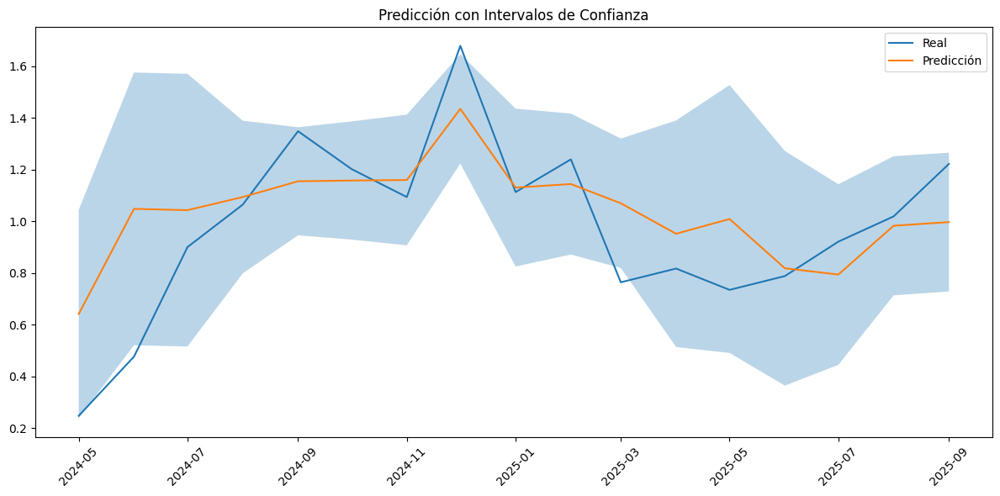

In [59]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))

plt.plot(y_test.index, y_test, label="Real")
plt.plot(y_test.index, y_test_pred, label="Predicción")

plt.fill_between(
    y_test.index,
    lower,
    upper,
    alpha=0.3
)

plt.legend()
plt.title("Predicción con Intervalos de Confianza")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [60]:
coverage = np.mean((y_test >= lower) & (y_test <= upper))
print("Cobertura:", coverage)

Cobertura: 0.8235294117647058


###Construcción de Modelo 2: **Prophet**

Train inicial: 65 | Test: 17 | Total: 82

===== PROPHET (ROLLING 1-STEP) =====
MAE : 0.1304
RMSE: 0.1691
R2  : 0.7310
MAPE: 20.07%
Cobertura (95%): 0.706


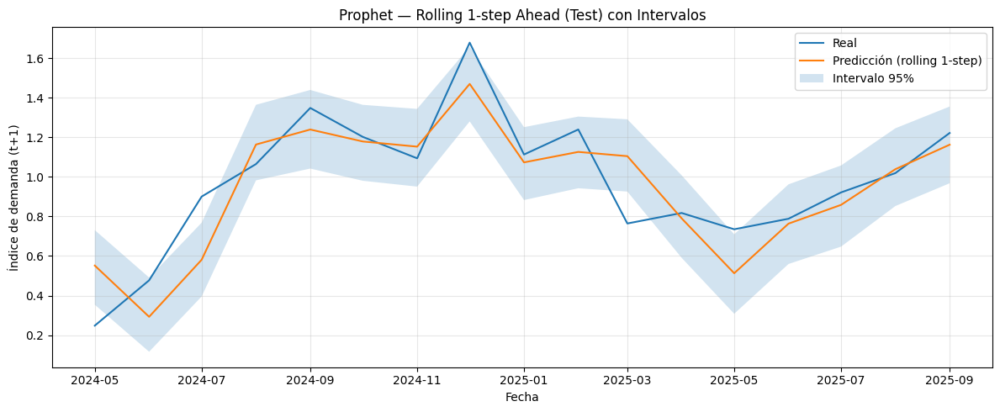

In [61]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]

def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100


# 1) Preparar df para Prophet
df = df_final.copy()
df = df.reset_index()
df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

cols = [DATE_COL, TARGET_COL] + FEATURES
df = df[cols].dropna().reset_index(drop=True)

# Renombres requeridos por Prophet
dfp = df.rename(columns={DATE_COL: "ds", TARGET_COL: "y"})


# 2) Split temporal Train/Test
test_size = 0.2
n = len(dfp)
split = int(n * (1 - test_size))

train_init = dfp.iloc[:split].copy()
test_block = dfp.iloc[split:].copy()

print(f"Train inicial: {len(train_init)} | Test: {len(test_block)} | Total: {len(dfp)}")

# 3) Rolling 1-step ahead
y_true_list = []
y_pred_list = []
lower_list = []
upper_list = []
ds_list = []

for i in range(len(test_block)):
    # Datos disponibles hasta justo antes del punto i del test
    train_roll = pd.concat([train_init, test_block.iloc[:i]], axis=0).copy()

    # Modelo Prophet
    m = Prophet(
    #   yearly_seasonality=False, se apaga porque ya se usa mes_sin/cos
        weekly_seasonality=False,
        daily_seasonality=False,
        seasonality_mode="additive",
        interval_width=0.95
    )
    for reg in FEATURES:
        m.add_regressor(reg)

    m.fit(train_roll)

    # Predecir SOLO el siguiente punto (el i-ésimo del test)
    one_step = test_block.iloc[[i]][["ds"] + FEATURES].copy()
    fc = m.predict(one_step)

    yhat = float(fc["yhat"].iloc[0])
    ylo  = float(fc["yhat_lower"].iloc[0])
    yhi  = float(fc["yhat_upper"].iloc[0])

    y_true = float(test_block["y"].iloc[i])
    ds_val = test_block["ds"].iloc[i]

    ds_list.append(ds_val)
    y_true_list.append(y_true)
    y_pred_list.append(yhat)
    lower_list.append(ylo)
    upper_list.append(yhi)

# Convertir a arrays
y_true_arr = np.array(y_true_list)
y_pred_arr = np.array(y_pred_list)
lower_arr = np.array(lower_list)
upper_arr = np.array(upper_list)

# Métricas rolling
mae = mean_absolute_error(y_true_arr, y_pred_arr)
rmse = np.sqrt(mean_squared_error(y_true_arr, y_pred_arr))
r2 = r2_score(y_true_arr, y_pred_arr)
mape_val = mape(y_true_arr, y_pred_arr)
coverage = np.mean((y_true_arr >= lower_arr) & (y_true_arr <= upper_arr))

print("\n===== PROPHET (ROLLING 1-STEP) =====")
print(f"MAE : {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R2  : {r2:.4f}")
print(f"MAPE: {mape_val:.2f}%")
print(f"Cobertura (95%): {coverage:.3f}")


# 4) Plot alineado por fechas
plt.figure(figsize=(12,5))
plt.plot(ds_list, y_true_arr, label="Real")
plt.plot(ds_list, y_pred_arr, label="Predicción (rolling 1-step)")

plt.fill_between(
    np.array(ds_list, dtype="datetime64[ns]"),
    lower_arr,
    upper_arr,
    alpha=0.2,
    label="Intervalo 95%"
)

plt.title("Prophet — Rolling 1-step Ahead (Test) con Intervalos")
plt.xlabel("Fecha")
plt.ylabel("Índice de demanda (t+1)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

###Construcción de Modelo 3: **SARIMAX**

Train inicial: 65 | Test: 17 | Total: 82

===== SARIMAX (ROLLING 1-STEP) ====
order=(1, 0, 1) | seasonal_order=(1, 0, 1, 12)
MAE : 0.1911
RMSE: 0.2201
R2  : 0.5444
MAPE: 27.04%
Cobertura (95%): 0.706


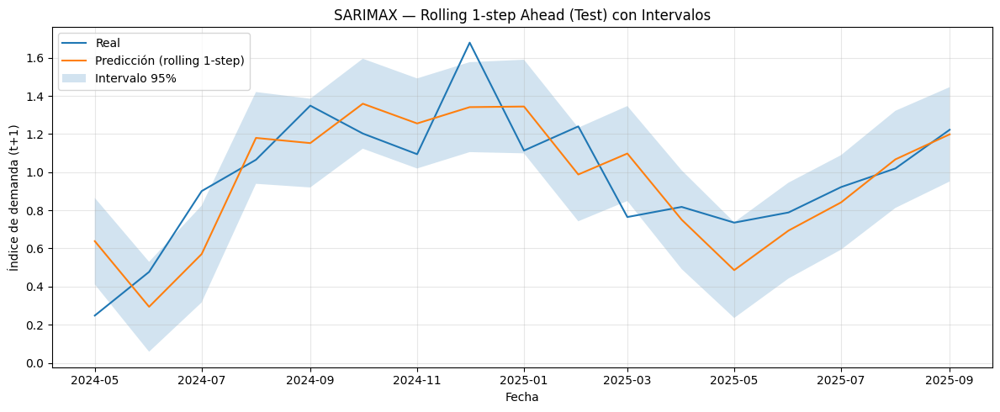

In [62]:
DATE_COL = "fecha"
TARGET_COL = "y"

EXOG_FEATURES = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]

def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100

def sarimax_rolling_1step(
    df_final,
    order=(1,0,1),
    seasonal_order=(1,0,1,12),
    test_size=0.2,
    enforce_stationarity=False,
    enforce_invertibility=False,
    trend="c",
    alpha=0.05
):

    # 1) Preparación de datos
    df = df_final.copy()

    # Asegurar que fecha sea columna (si está en index)
    if DATE_COL not in df.columns:
        df = df.reset_index()

    df[DATE_COL] = pd.to_datetime(df[DATE_COL])
    df = df.sort_values(DATE_COL).reset_index(drop=True)

    cols = [DATE_COL, TARGET_COL] + EXOG_FEATURES
    df = df[cols].dropna().reset_index(drop=True)

    # Index temporal mensual
    df = df.set_index(DATE_COL)
    df = df.asfreq("MS")  # Month Start
    df = df.dropna()

    y = df[TARGET_COL].astype(float)
    X = df[EXOG_FEATURES].astype(float)

    # 2) Split temporal
    n = len(df)
    split = int(n * (1 - test_size))

    y_train_init = y.iloc[:split]
    X_train_init = X.iloc[:split]
    y_test = y.iloc[split:]
    X_test = X.iloc[split:]

    print(f"Train inicial: {len(y_train_init)} | Test: {len(y_test)} | Total: {n}")

    # 3) Rolling 1-step ahead
    y_true_list, y_pred_list = [], []
    lower_list, upper_list = [], []
    ds_list = []

    for i in range(len(y_test)):
        # Datos disponibles hasta justo antes del punto i del test
        y_train_roll = pd.concat([y_train_init, y_test.iloc[:i]])
        X_train_roll = pd.concat([X_train_init, X_test.iloc[:i]])

        # Ajustar SARIMAX
        model = SARIMAX(
            endog=y_train_roll,
            exog=X_train_roll,
            order=order,
            seasonal_order=seasonal_order,
            trend=trend,
            enforce_stationarity=enforce_stationarity,
            enforce_invertibility=enforce_invertibility
        )

        res = model.fit(disp=False)

        # Predecir SOLO el siguiente punto
        X_next = X_test.iloc[[i]]
        fc = res.get_forecast(steps=1, exog=X_next)
        yhat = float(fc.predicted_mean.iloc[0])

        ci = fc.conf_int(alpha=alpha)
        # statsmodels devuelve columnas como "lower y" / "upper y"
        ylo = float(ci.iloc[0, 0])
        yhi = float(ci.iloc[0, 1])

        y_true = float(y_test.iloc[i])
        ds_val = y_test.index[i]

        ds_list.append(ds_val)
        y_true_list.append(y_true)
        y_pred_list.append(yhat)
        lower_list.append(ylo)
        upper_list.append(yhi)

    y_true_arr = np.array(y_true_list)
    y_pred_arr = np.array(y_pred_list)
    lower_arr = np.array(lower_list)
    upper_arr = np.array(upper_list)

    # 4) Métricas
    mae = mean_absolute_error(y_true_arr, y_pred_arr)
    rmse = np.sqrt(mean_squared_error(y_true_arr, y_pred_arr))
    r2 = r2_score(y_true_arr, y_pred_arr)
    mape_val = mape(y_true_arr, y_pred_arr)
    coverage = np.mean((y_true_arr >= lower_arr) & (y_true_arr <= upper_arr))

    print("\n===== SARIMAX (ROLLING 1-STEP) ====")
    print(f"order={order} | seasonal_order={seasonal_order}")
    print(f"MAE : {mae:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"R2  : {r2:.4f}")
    print(f"MAPE: {mape_val:.2f}%")
    print(f"Cobertura (95%): {coverage:.3f}")

    # 5) Plot alineado por fechas
    plt.figure(figsize=(12,5))
    plt.plot(ds_list, y_true_arr, label="Real")
    plt.plot(ds_list, y_pred_arr, label="Predicción (rolling 1-step)")
    plt.fill_between(
        np.array(ds_list, dtype="datetime64[ns]"),
        lower_arr,
        upper_arr,
        alpha=0.2,
        label="Intervalo 95%"
    )
    plt.title("SARIMAX — Rolling 1-step Ahead (Test) con Intervalos")
    plt.xlabel("Fecha")
    plt.ylabel("Índice de demanda (t+1)")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return {
        "mae": mae, "rmse": rmse, "r2": r2, "mape": mape_val, "coverage": coverage,
        "ds": np.array(ds_list), "y_true": y_true_arr, "y_pred": y_pred_arr,
        "lower": lower_arr, "upper": upper_arr
    }


# Ejecución
sarimax_results = sarimax_rolling_1step(
    df_final=df_final,
    order=(1,0,1),
    seasonal_order=(1,0,1,12),
    test_size=0.2,
    trend="c",
    alpha=0.05
)

Métricas

| Métrica           | Valor  | Interpretación                                              |
| ----------------- | ------ | ----------------------------------------------------------- |
| **MAE**           | 0.1911 | Error absoluto relativamente alto                           |
| **RMSE**          | 0.2201 | Penaliza errores grandes → indica variabilidad no capturada |
| **R²**            | 0.5444 | Explica ~54% de la variabilidad                             |
| **MAPE**          | 27.04% | Error porcentual elevado                                    |
| **Cobertura 95%** | 0.706  | Solo 70.6% dentro del intervalo (muy bajo)                  |


###Construcción de Modelo 4: **RANDOM FOREST – Rolling 1-Step Ahead**

Train inicial: 65 | Test: 17 | Total: 82

===== RANDOM FOREST (ROLLING 1-STEP) =====
MAE : 0.1529
RMSE: 0.1997
R2  : 0.6251
MAPE: 25.36%


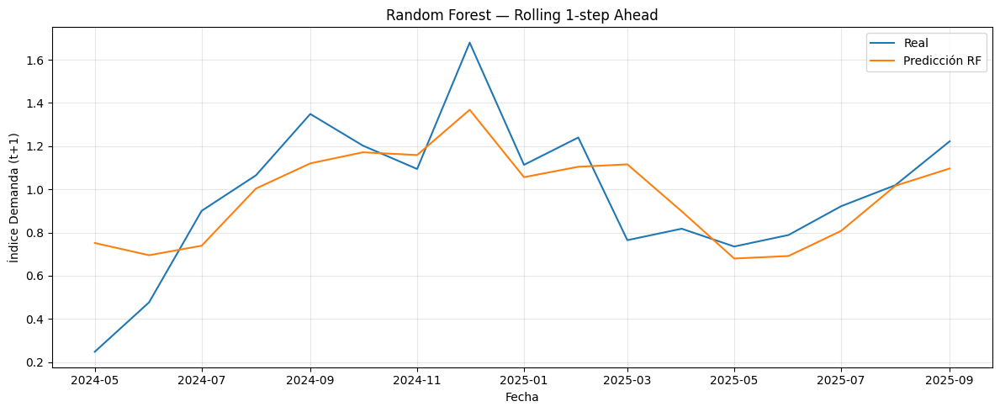

In [63]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]

def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100


# 1) Preparar datos
df = df_final.copy()
df = df.reset_index()
df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

cols = [DATE_COL, TARGET_COL] + FEATURES
df = df[cols].dropna().reset_index(drop=True)

# 2) Split temporal
test_size = 0.2
n = len(df)
split = int(n * (1 - test_size))

train_init = df.iloc[:split].copy()
test_block = df.iloc[split:].copy()

print(f"Train inicial: {len(train_init)} | Test: {len(test_block)} | Total: {len(df)}")

# 3) Rolling 1-step ahead
y_true_list = []
y_pred_list = []
ds_list = []

for i in range(len(test_block)):

    train_roll = pd.concat([train_init, test_block.iloc[:i]], axis=0)

    X_train = train_roll[FEATURES]
    y_train = train_roll[TARGET_COL]

    X_test = test_block.iloc[[i]][FEATURES]
    y_true = float(test_block.iloc[i][TARGET_COL])
    ds_val = test_block.iloc[i][DATE_COL]

    model = RandomForestRegressor(
        n_estimators=500,
        max_depth=5,
        min_samples_leaf=3,
        max_features="sqrt",
        random_state=42,
        n_jobs=-1
    )

    model.fit(X_train, y_train)
    y_pred = float(model.predict(X_test)[0])

    ds_list.append(ds_val)
    y_true_list.append(y_true)
    y_pred_list.append(y_pred)

# 4) Métricas
y_true_arr = np.array(y_true_list)
y_pred_arr = np.array(y_pred_list)

mae = mean_absolute_error(y_true_arr, y_pred_arr)
rmse = np.sqrt(mean_squared_error(y_true_arr, y_pred_arr))
r2 = r2_score(y_true_arr, y_pred_arr)
mape_val = mape(y_true_arr, y_pred_arr)

print("\n===== RANDOM FOREST (ROLLING 1-STEP) =====")
print(f"MAE : {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R2  : {r2:.4f}")
print(f"MAPE: {mape_val:.2f}%")

# 5) Plot
plt.figure(figsize=(12,5))
plt.plot(ds_list, y_true_arr, label="Real")
plt.plot(ds_list, y_pred_arr, label="Predicción RF")
plt.title("Random Forest — Rolling 1-step Ahead")
plt.xlabel("Fecha")
plt.ylabel("Índice Demanda (t+1)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

Resultados

| Métrica  | Valor  | Interpretación Técnica           | Interpretación de Negocio                      |
| -------- | ------ | -------------------------------- | ---------------------------------------------- |
| **MAE**  | 0.1529 | Error promedio absoluto          | Se equivoca en ~0.15 puntos del índice por mes |
| **RMSE** | 0.1997 | Penaliza más errores grandes     | Hay algunos meses con errores relevantes       |
| **R²**   | 0.6251 | Explica 62.5% de la variabilidad | Capta estructura, pero deja ~37% sin explicar  |
| **MAPE** | 25.36% | Error relativo promedio          | Error porcentual alto para planeación fina     |



###Construcción de Modelo 5: **LightGBM**

Se truncaron las últimas líneas 5000 del resultado de transmisión.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

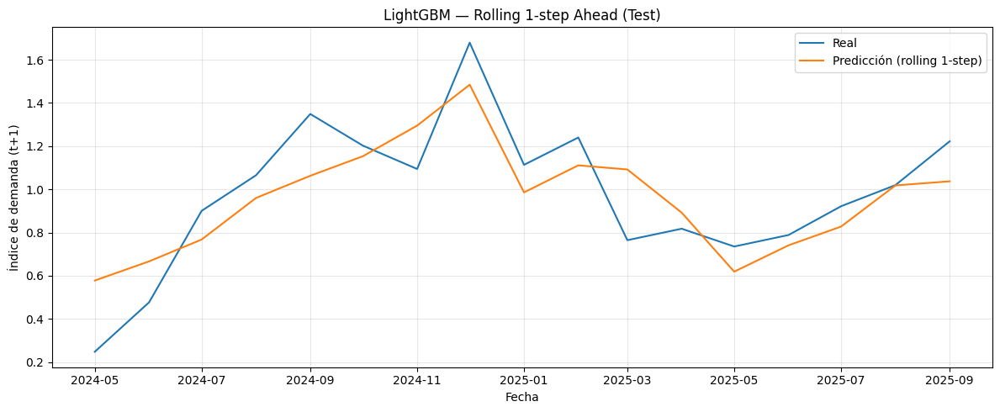

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000029 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 65, number of used features: 7
[LightGBM] [Info] Start training from score 1.048433
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

In [64]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]

def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100


# 1) Preparar datos
df = df_final.copy()

# Asegurar que fecha exista como columna (por si está en el index)
if DATE_COL not in df.columns:
    df = df.reset_index()

df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

# Mantener solo columnas necesarias y quitar NA
cols_needed = [DATE_COL, TARGET_COL] + FEATURES
df = df[cols_needed].dropna().reset_index(drop=True)

X_all = df[FEATURES].copy()
y_all = df[TARGET_COL].copy()
dates_all = df[DATE_COL].copy()

print(f"Total filas útiles: {len(df)} | Features: {len(FEATURES)}")


# 2) Split temporal Train/Test
test_size = 0.2
n = len(df)
split = int(n * (1 - test_size))

X_train_init = X_all.iloc[:split].copy()
y_train_init = y_all.iloc[:split].copy()

X_test_block = X_all.iloc[split:].copy()
y_test_block = y_all.iloc[split:].copy()
dates_test = dates_all.iloc[split:].copy()

print(f"Train inicial: {len(X_train_init)} | Test: {len(X_test_block)} | Total: {n}")


# 3) Modelo LightGBM
def make_lgbm_model(random_state=42):
    return LGBMRegressor(
        objective="regression",
        n_estimators=600,
        learning_rate=0.03,
        num_leaves=31,
        max_depth=-1,            # -1 = sin límite (controla con leaves/min_data)
        min_child_samples=10,    # importante para dataset pequeño
        subsample=0.8,
        colsample_bytree=0.8,
        reg_alpha=0.2,
        reg_lambda=1.0,
        random_state=random_state,
        n_jobs=-1
    )


# 4) Rolling 1-step ahead
#    - en cada paso: re-entrena con todo lo disponible hasta ese mes
#    - predice SOLO el siguiente punto
y_true_list, y_pred_list, ds_list = [], [], []
t0 = time.time()

for i in range(len(X_test_block)):
    # dataset disponible hasta el punto i-ésimo del bloque test (excluyéndolo)
    X_roll = pd.concat([X_train_init, X_test_block.iloc[:i]], axis=0)
    y_roll = pd.concat([y_train_init, y_test_block.iloc[:i]], axis=0)

    # pequeño holdout interno al final para early stopping (respeta tiempo)
    # (si hay muy pocos datos, se desactiva early stopping)
    n_roll = len(X_roll)
    val_size = max(5, int(0.15 * n_roll))  # mínimo 5 puntos
    if n_roll - val_size < 20:
        # muy pocos datos para split decente → entrenar sin early stopping
        model = make_lgbm_model(random_state=42)
        model.set_params(n_estimators=400)  # reduce para evitar sobreajuste
        model.fit(X_roll, y_roll)
    else:
        X_tr = X_roll.iloc[:-val_size]
        y_tr = y_roll.iloc[:-val_size]
        X_val = X_roll.iloc[-val_size:]
        y_val = y_roll.iloc[-val_size:]

        model = make_lgbm_model(random_state=42)
        model.fit(
            X_tr, y_tr,
            eval_set=[(X_val, y_val)],
            eval_metric="l1",          # MAE
            callbacks=[
                # early stopping sin dependencias extra
                # (LightGBM usa callbacks nativos)
                __import__("lightgbm").early_stopping(stopping_rounds=50, verbose=False)
            ]
        )

    # predecir siguiente punto
    X_one = X_test_block.iloc[[i]]
    yhat = float(model.predict(X_one)[0])

    y_true_list.append(float(y_test_block.iloc[i]))
    y_pred_list.append(yhat)
    ds_list.append(dates_test.iloc[i])

elapsed = time.time() - t0

y_true_arr = np.array(y_true_list)
y_pred_arr = np.array(y_pred_list)


# 5) Métricas
mae = mean_absolute_error(y_true_arr, y_pred_arr)
rmse = np.sqrt(mean_squared_error(y_true_arr, y_pred_arr))
r2 = r2_score(y_true_arr, y_pred_arr)
mape_val = mape(y_true_arr, y_pred_arr)

print("\n===== LIGHTGBM (ROLLING 1-STEP) =====")
print(f"MAE : {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R2  : {r2:.4f}")
print(f"MAPE: {mape_val:.2f}%")
print(f"Tiempo rolling (re-fit por paso): {elapsed:.2f} sec")


# 6) Plot alineado por fechas
plt.figure(figsize=(12,5))
plt.plot(ds_list, y_true_arr, label="Real")
plt.plot(ds_list, y_pred_arr, label="Predicción (rolling 1-step)")
plt.title("LightGBM — Rolling 1-step Ahead (Test)")
plt.xlabel("Fecha")
plt.ylabel("Índice de demanda (t+1)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


# 7) Importancia de variables (entrenando 1 modelo final con todo el train)
final_model = make_lgbm_model(random_state=42)
final_model.fit(X_train_init, y_train_init)

imp = pd.DataFrame({
    "feature": FEATURES,
    "importance": final_model.feature_importances_
}).sort_values("importance", ascending=False).reset_index(drop=True)

print("\n==== Importancia (modelo final entrenado en Train inicial) ====")
print(imp.to_string(index=False))

###Construcción de Modelo 6: **CatBoost**

Train inicial: 65 | Test: 17 | Total: 82

===== CATBOOST (ROLLING 1-STEP) =====
MAE : 0.1796
RMSE: 0.2235
R2  : 0.5302
MAPE: 26.24%
Tiempo rolling (re-fit por paso): 3.84 sec


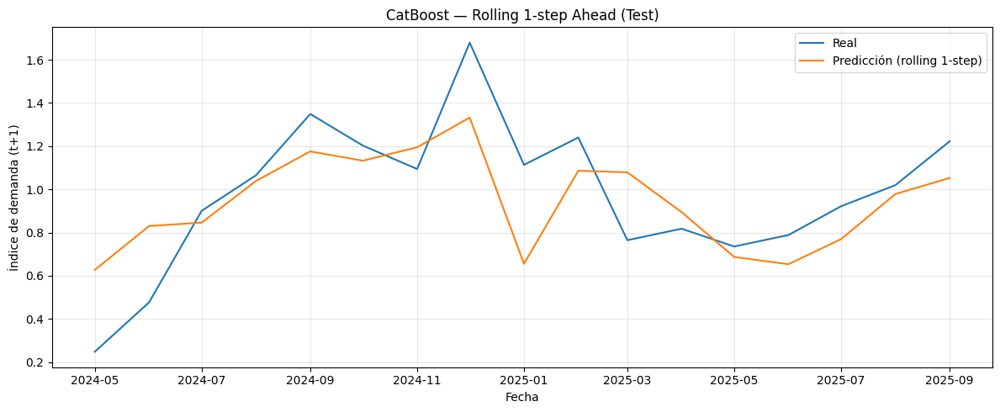

In [65]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12",
]

TEST_SIZE = 0.2
RANDOM_STATE = 42

def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100


# 1) Preparar datos
df = df_final.copy()

if DATE_COL not in df.columns:
    df = df.reset_index()

df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

cols = [DATE_COL, TARGET_COL] + FEATURES
df = df[cols].dropna().reset_index(drop=True)

n = len(df)
split = int(n * (1 - TEST_SIZE))

train_init = df.iloc[:split].copy()
test_block = df.iloc[split:].copy()

print(f"Train inicial: {len(train_init)} | Test: {len(test_block)} | Total: {len(df)}")


# 2) Modelo CatBoost (base)
def make_model():
    return CatBoostRegressor(
        loss_function="MAE",               # optimizamos MAE directo
        iterations=4000,                   # muchas iteraciones + early stopping
        learning_rate=0.03,                # conservador
        depth=6,                           # complejidad moderada
        l2_leaf_reg=6.0,                   # regularización
        subsample=0.8,                     # robustez
        random_strength=1.0,
        bagging_temperature=0.6,
        min_data_in_leaf=8,
        grow_policy="SymmetricTree",
        eval_metric="MAE",
        random_seed=RANDOM_STATE,
        verbose=False,
        allow_writing_files=False
    )


# 3) Rolling 1-step ahead
y_true_list, y_pred_list = [], []
ds_list = []

t0 = time.time()

for i in range(len(test_block)):
    # Entrena con todo lo disponible hasta antes del punto i del test
    train_roll = pd.concat([train_init, test_block.iloc[:i]], axis=0)

    X_train = train_roll[FEATURES]
    y_train = train_roll[TARGET_COL]

    # Pequeña validación temporal interna (últimos ~20% del train_roll)
    val_size = max(6, int(len(train_roll) * 0.2))
    X_tr, X_val = X_train.iloc[:-val_size], X_train.iloc[-val_size:]
    y_tr, y_val = y_train.iloc[:-val_size], y_train.iloc[-val_size:]

    model = make_model()
    model.fit(
        X_tr, y_tr,
        eval_set=(X_val, y_val),
        use_best_model=True,
        early_stopping_rounds=200
    )

    # Predice el siguiente punto (test i)
    row = test_block.iloc[[i]]
    yhat = float(model.predict(row[FEATURES])[0])

    y_true = float(row[TARGET_COL].iloc[0])
    ds_val = row[DATE_COL].iloc[0]

    ds_list.append(ds_val)
    y_true_list.append(y_true)
    y_pred_list.append(yhat)

elapsed = time.time() - t0

y_true_arr = np.array(y_true_list)
y_pred_arr = np.array(y_pred_list)

mae = mean_absolute_error(y_true_arr, y_pred_arr)
rmse = np.sqrt(mean_squared_error(y_true_arr, y_pred_arr))
r2 = r2_score(y_true_arr, y_pred_arr)
mape_val = mape(y_true_arr, y_pred_arr)

print("\n===== CATBOOST (ROLLING 1-STEP) =====")
print(f"MAE : {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R2  : {r2:.4f}")
print(f"MAPE: {mape_val:.2f}%")
print(f"Tiempo rolling (re-fit por paso): {elapsed:.2f} sec")


# 4) Plot alineado por fechas
plt.figure(figsize=(12,5))
plt.plot(ds_list, y_true_arr, label="Real")
plt.plot(ds_list, y_pred_arr, label="Predicción (rolling 1-step)")
plt.title("CatBoost — Rolling 1-step Ahead (Test)")
plt.xlabel("Fecha")
plt.ylabel("Índice de demanda (t+1)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

Resultados

| Métrica    | Valor    | Interpretación                                                                |
| ---------- | -------- | ----------------------------------------------------------------------------- |
| **MAE**    | 0.1796   | Error promedio relativamente alto comparado con LightGBM tuned (~0.0736)      |
| **RMSE**   | 0.2235   | Penaliza fuertemente errores grandes → indica presencia de desvíos relevantes |
| **R²**     | 0.5302   | Explica solo 53% de la varianza del test                                      |
| **MAPE**   | 26.24%   | Error relativo alto para planeación estratégica                               |
| **Tiempo** | 3.85 sec | Computacionalmente eficiente                                                  |


###Construcción de modelo 7: **UCM**

Train inicial: 65 | Test: 17 | Total: 82

===== UCM (ROLLING 1-STEP) =====
MAE : 0.1345
RMSE: 0.1657
R2  : 0.7419
MAPE: 18.98%
Cobertura (95%): 0.882


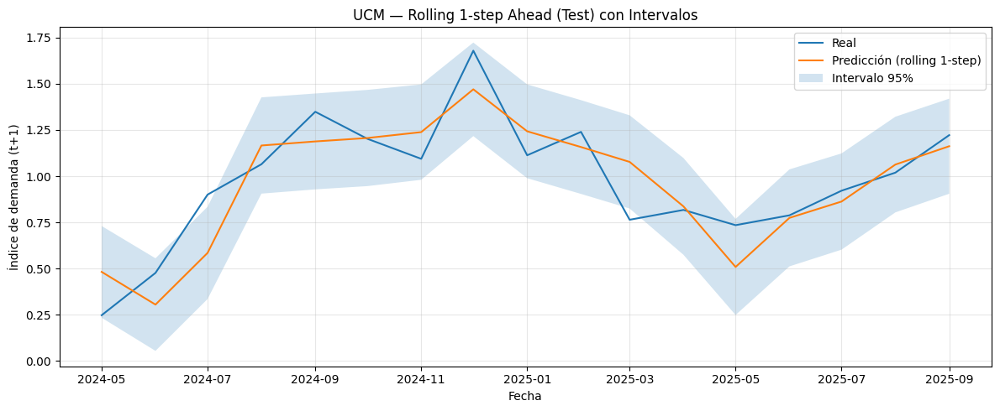

In [66]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12",
]

TEST_SIZE = 0.20          # bloque final para test
ALPHA = 0.05              # 95% intervalos
FREQ = "MS"               # Monthly Start

# UCM structure:
# - level: local level (tendencia estocástica)
# - seasonal: 12 (estacionalidad anual)
# - exog: variables exógenas
UCM_KWARGS = dict(
    level="local level",
    seasonal=12,
    stochastic_level=True,
    stochastic_seasonal=True
)

# Helpers
def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100

def safe_fit_ucm(endog, exog):
    model = UnobservedComponents(endog=endog, exog=exog, **UCM_KWARGS)
    try:
        res = model.fit(disp=False)
        return res
    except Exception:
        res = model.fit(disp=False, method="powell", maxiter=2000)
        return res

# 1) Preparar datos
df = df_final.copy()

if DATE_COL not in df.columns:
    df = df.reset_index()

df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

# Quedarnos con columnas necesarias + limpiar NA
cols = [DATE_COL, TARGET_COL] + FEATURES
missing = [c for c in cols if c not in df.columns]
if missing:
    raise ValueError(f"Faltan columnas en df_final: {missing}")

df = df[cols].dropna().reset_index(drop=True)

# Crear índice temporal con frecuencia (ayuda a forecast y plots)
df = df.set_index(DATE_COL)
df = df.asfreq(FREQ)

df = df.dropna()

y = df[TARGET_COL].astype(float)
X = df[FEATURES].astype(float)

# 2) Split temporal Train/Test
n = len(df)
split = int(n * (1 - TEST_SIZE))

y_train_init = y.iloc[:split]
X_train_init = X.iloc[:split]

y_test_block = y.iloc[split:]
X_test_block = X.iloc[split:]

print(f"Train inicial: {len(y_train_init)} | Test: {len(y_test_block)} | Total: {n}")

# 3) Rolling 1-step ahead (expanding window)
y_true_list, y_pred_list = [], []
lower_list, upper_list = [], []
ds_list = []

for i in range(len(y_test_block)):
    # expanding window: train = train_init + test[:i]
    y_train_roll = pd.concat([y_train_init, y_test_block.iloc[:i]])
    X_train_roll = pd.concat([X_train_init, X_test_block.iloc[:i]])

    # Fit UCM
    res = safe_fit_ucm(endog=y_train_roll, exog=X_train_roll)

    # Forecast 1-step (punto i del test)
    exog_next = X_test_block.iloc[[i]]
    fc = res.get_forecast(steps=1, exog=exog_next)

    mean_fc = float(fc.predicted_mean.iloc[0])
    ci = fc.conf_int(alpha=ALPHA)
    lo = float(ci.iloc[0, 0])
    hi = float(ci.iloc[0, 1])

    y_true = float(y_test_block.iloc[i])
    ds_val = y_test_block.index[i]

    ds_list.append(ds_val)
    y_true_list.append(y_true)
    y_pred_list.append(mean_fc)
    lower_list.append(lo)
    upper_list.append(hi)

y_true_arr = np.array(y_true_list)
y_pred_arr = np.array(y_pred_list)
lower_arr  = np.array(lower_list)
upper_arr  = np.array(upper_list)

# 4) Métricas
mae  = mean_absolute_error(y_true_arr, y_pred_arr)
rmse = np.sqrt(mean_squared_error(y_true_arr, y_pred_arr))
r2   = r2_score(y_true_arr, y_pred_arr)
mape_val = mape(y_true_arr, y_pred_arr)
coverage = np.mean((y_true_arr >= lower_arr) & (y_true_arr <= upper_arr))

print("\n===== UCM (ROLLING 1-STEP) =====")
print(f"MAE : {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R2  : {r2:.4f}")
print(f"MAPE: {mape_val:.2f}%")
print(f"Cobertura (95%): {coverage:.3f}")

# 5) Plot alineado por fechas
plt.figure(figsize=(12, 5))
plt.plot(ds_list, y_true_arr, label="Real")
plt.plot(ds_list, y_pred_arr, label="Predicción (rolling 1-step)")

plt.fill_between(
    pd.to_datetime(ds_list),
    lower_arr,
    upper_arr,
    alpha=0.2,
    label="Intervalo 95%"
)

plt.title("UCM — Rolling 1-step Ahead (Test) con Intervalos")
plt.xlabel("Fecha")
plt.ylabel("Índice de demanda (t+1)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


Resultados
| Métrica           | Valor  | Interpretación                     |
| ----------------- | ------ | ---------------------------------- |
| **MAE**           | 0.1345 | Error medio bajo, competitivo      |
| **RMSE**          | 0.1657 | Penaliza errores grandes → estable |
| **R²**            | 0.7419 | Explica 74.2% de la variabilidad   |
| **MAPE**          | 18.98% | Error relativo menor al 20%        |
| **Cobertura 95%** | 0.882  | Intervalos ligeramente estrechos   |




###Comparativa de Modelos

| Ranking | Modelo               | MAE        | RMSE   | R²     | MAPE   | Cobertura 95% |
| ------- | -------------------- | ---------- | ------ | ------ | ------ | ------------- |
|  1    | **Prophet**          | **0.1304** | 0.1691 | 0.7310 | 20.07% | 0.706         |
|  2    | **UCM**              | **0.1345** | 0.1657 | 0.7419 | 18.98% | 0.882         |
|  3    | **XGBoost (base)**   | **0.1370** | 0.1823 | 0.6875 | 22.88% | —             |
| 4       | **LightGBM (base)**  | 0.1524     | 0.1783 | 0.7011 | 21.99% | —             |
| 5       | **Random Forest**    | 0.1529     | 0.1997 | 0.6251 | 25.36% | —             |
| 6       | **Gaussian Process** | 0.1724     | 0.2264 | 0.5181 | —      | 0.824         |
| 7       | **CatBoost (base)**  | 0.1796     | 0.2235 | 0.5302 | 26.24% | —             |
| 8       | **SARIMAX**          | 0.1911     | 0.2201 | 0.5444 | 27.04% | 0.706         |


##II. Ajuste fino

###Ajuste de Modelo 1: **Procesos Gaussianos**

Definir features

In [67]:
features = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]

X = df_final[features]
y = df_final["y"]

Split temporal (80% train, 20% test)

In [68]:
split = int(len(df_final) * 0.8)

X_train, X_test = X.iloc[:split], X.iloc[split:]
y_train, y_test = y.iloc[:split], y.iloc[split:]

Modelo de Procesos Gaussianos

In [69]:
# Definición del kernel
kernel = (
    ConstantKernel(1.0, (1e-2, 1e2))
    * (
        Matern(
            length_scale=12.0,
            length_scale_bounds=(3.0, 60.0),
            nu=1.5
        )
        + ExpSineSquared(
            length_scale=3.0,
            periodicity=12.0,
            periodicity_bounds="fixed"
        )
    )
    + WhiteKernel(
        noise_level=1.0,
        noise_level_bounds=(1e-2, 20.0)   # bounds más amplios
    )
)

# Modelo GP
gp_model = GaussianProcessRegressor(
    kernel=kernel,
    n_restarts_optimizer=5,
    normalize_y=True,
    #alpha=0.3,
    random_state=42
)

# Entrenamiento
gp_model.fit(X_train, y_train)

GaussianProcessRegressor(kernel=1**2 * Matern(length_scale=12, nu=1.5) + ExpSineSquared(length_scale=3, periodicity=12) + WhiteKernel(noise_level=1),
                         n_restarts_optimizer=5, normalize_y=True,
                         random_state=42)

In [70]:
# Predicción media y desviación estándar
y_train_pred, y_train_std = gp_model.predict(X_train, return_std=True)
y_test_pred, y_test_std = gp_model.predict(X_test, return_std=True)

Evaluación

In [71]:
def evaluar(nombre, y_true, y_pred):
    print(f"\nModelo: {nombre}")
    print("MAE :", mean_absolute_error(y_true, y_pred))
    print("RMSE:", np.sqrt(mean_squared_error(y_true, y_pred)))
    print("R²  :", r2_score(y_true, y_pred))

evaluar("GP Train", y_train, y_train_pred)
evaluar("GP Test", y_test, y_test_pred)


Modelo: GP Train
MAE : 0.09553164627043371
RMSE: 0.1191287383927949
R²  : 0.8125274738959725

Modelo: GP Test
MAE : 0.18069648606703673
RMSE: 0.21638364421870096
R²  : 0.5597543122940813


Intervalos de confianza

In [72]:
def evaluar_z_grid(y_true, y_pred, y_std, z_values):
    out = []
    for z in z_values:
        lower = y_pred - z*y_std
        upper = y_pred + z*y_std
        cov = np.mean((y_true >= lower) & (y_true <= upper))
        width = np.mean(upper - lower)
        out.append((z, cov, width))
    return out

z_values = np.arange(1.6, 2.6, 0.05)
results = evaluar_z_grid(y_test.values, y_test_pred, y_test_std, z_values)

# filtra los z que logran >= 0.941 (16/17)
candidatos = [r for r in results if r[1] >= 0.941]
best = min(candidatos, key=lambda x: x[2])  # menor ancho
print("Mejor z (mínimo ancho con cobertura>=0.941):", best)

Mejor z (mínimo ancho con cobertura>=0.941): (np.float64(2.0500000000000007), np.float64(0.9411764705882353), np.float64(0.7621104289427193))


In [73]:
# Intervalo 95%
lower = y_test_pred - 2.05 * y_test_std
upper = y_test_pred + 2.05 * y_test_std

Visualización

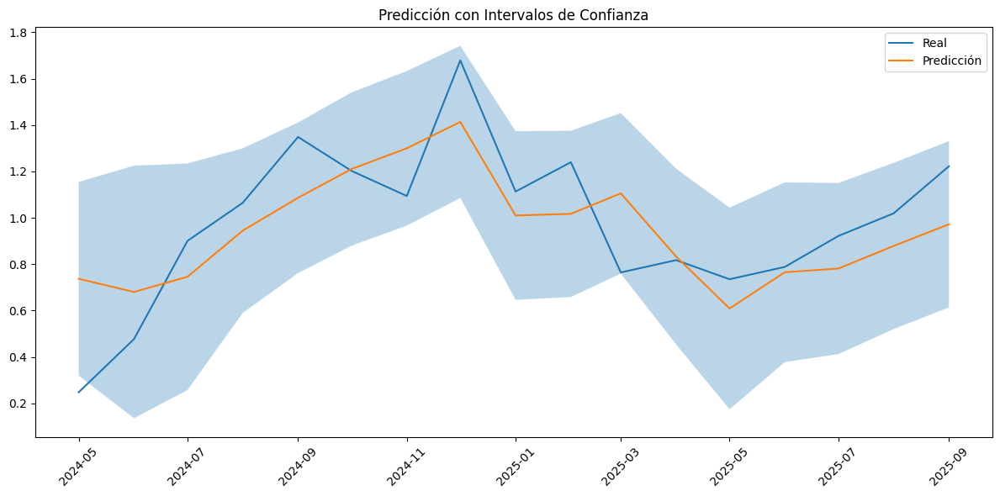

In [74]:
plt.figure(figsize=(12,6))

plt.plot(y_test.index, y_test, label="Real")
plt.plot(y_test.index, y_test_pred, label="Predicción")

plt.fill_between(
    y_test.index,
    lower,
    upper,
    alpha=0.3
)

plt.legend()
plt.title("Predicción con Intervalos de Confianza")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [75]:
coverage = np.mean((y_test >= lower) & (y_test <= upper))
print("Cobertura:", coverage)

Cobertura: 0.9411764705882353


In [76]:
print(gp_model.kernel_)

1.02**2 * Matern(length_scale=3, nu=1.5) + ExpSineSquared(length_scale=1.34, periodicity=12) + WhiteKernel(noise_level=0.28)


**Ajustes al modelo**

| Ajuste / Decisión                      |               Valor inicial |                                                                                                         Valor ajustado (final) | Objetivo del ajuste                                                      | Efecto observado (resultado)                                                |
| -------------------------------------- | --------------------------: | -----------------------------------------------------------------------------------------------------------------------------: | ------------------------------------------------------------------------ | --------------------------------------------------------------------------- |
| Tipo de predicción                     |         Predicción estática |                                                                                               **Rolling 1-step ahead** (1 mes) | Evaluar desempeño realista en series de tiempo (sin fuga)                | Predicciones y evaluación coherentes para pronóstico mensual                |
| Kernel del GP                          |  **Constant × RBF + White** |                                                                               **Constant × (Matérn + ExpSineSquared) + White** | Capturar **suavidad + estacionalidad anual (12 meses) + ruido**          | Kernel aprendió estacionalidad y mejoró estructura del ajuste               |
| Estacionalidad                         |                No explícita |                                                                                 **ExpSineSquared** con `periodicity=12` (fijo) | Forzar periodicidad anual por datos mensuales                            | Mejor representación de ciclos anuales                                      |
| Suavidad / tendencia                   |            RBF (más rígido) |                                                                                                               **Matérn ν=1.5** | Mayor flexibilidad ante cambios graduales y shocks                       | Ajuste más robusto a variaciones reales                                     |
| Escalado de features                   | `StandardScaler()` incluido |                                                                                                           **Scaler eliminado** | Evitar distorsión por mezcla de dummies (0/1) y features ya normalizadas | Cambió la calibración de la incertidumbre (cobertura se movió)              |
| Intervalo de confianza (z)             |             **1.96** (≈95%) |                                                                                                              **2.05** (óptimo) | Calibrar intervalos para lograr cobertura objetivo con mínimo ancho      | Cobertura subió **0.882 → 0.941** con menor inflación que 2.2               |
| Intervalo de confianza (prueba manual) |                        1.96 |                                                                                                                            2.2 | Aumentar cobertura rápidamente                                           | Cobertura subió a **0.941**, pero con intervalos más anchos de lo necesario |
| Criterio de calibración                |      Sin criterio explícito |                                                                                     **Minimizar ancho** s.a. cobertura ≥ 0.941 | Balancear precisión vs incertidumbre                                     | Mejor z encontrado: **2.05**, ancho promedio ≈ **0.762**                    |
| Kernel aprendido (post-fit)            |                         N/A | `1.02**2 * Matern(length_scale=3, nu=1.5) + ExpSineSquared(length_scale=1.34, periodicity=12) + WhiteKernel(noise_level=0.28)` | Validar que el GP optimizó hiperparámetros coherentes                    | Kernel final consistente con estacionalidad + ruido moderado                |
| Métrica de incertidumbre               |                 No evaluada |                                                                                        **Coverage** = mean(y ∈ [lower, upper]) | Medir calibración de intervalos                                          | Cobertura final ≈ **0.941** (16/17 observaciones)                           |


###Ajuste de Modelo 2: **Prophet**

Total usable: 82

Trial 1/30 | A_prophet_yearly | cps=0.05, sps=1.0, rps=1.0, iw=0.9, us=500

Trial 2/30 | B_manual_sincos | cps=0.01, sps=5.0, rps=0.1, iw=0.9, us=500

Trial 3/30 | B_manual_sincos | cps=0.2, sps=1.0, rps=0.5, iw=0.9, us=200

Trial 4/30 | A_prophet_yearly | cps=0.05, sps=1.0, rps=0.5, iw=0.95, us=200

Trial 5/30 | B_manual_sincos | cps=0.05, sps=1.0, rps=0.1, iw=0.9, us=500

Trial 6/30 | A_prophet_yearly | cps=0.01, sps=1.0, rps=1.0, iw=0.9, us=500

Trial 7/30 | A_prophet_yearly | cps=0.05, sps=1.0, rps=1.0, iw=0.95, us=200

Trial 8/30 | B_manual_sincos | cps=0.01, sps=10.0, rps=0.5, iw=0.9, us=200

Trial 9/30 | A_prophet_yearly | cps=0.1, sps=1.0, rps=0.5, iw=0.9, us=500

Trial 10/30 | B_manual_sincos | cps=0.05, sps=5.0, rps=0.1, iw=0.95, us=500

Trial 11/30 | B_manual_sincos | cps=0.1, sps=1.0, rps=0.5, iw=0.95, us=200

Trial 12/30 | A_prophet_yearly | cps=0.01, sps=10.0, rps=1.0, iw=0.9, us=500

Trial 13/30 | A_prophet_yearly | cps=0.2, sps=1.0, rps=1.0, iw=0.9, us

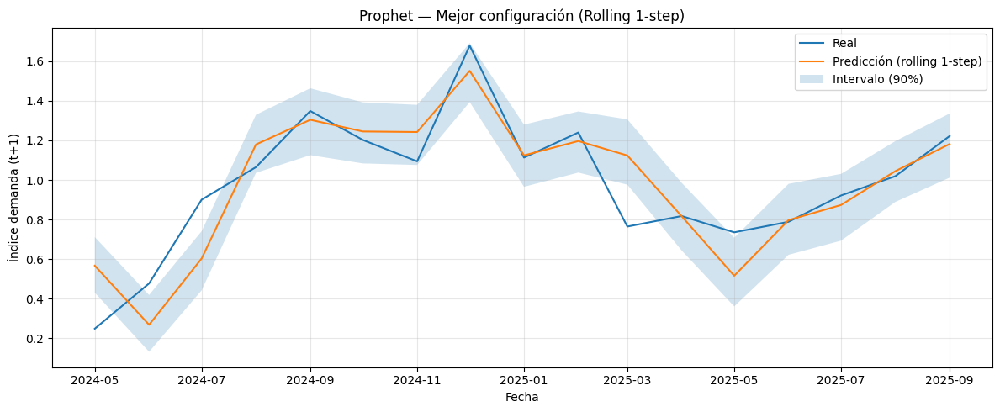

In [77]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES_ALL = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]

def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100

def rolling_prophet_eval(dfp, features, prophet_params):
    test_size = 0.2
    n = len(dfp)
    split = int(n * (1 - test_size))

    train_init = dfp.iloc[:split].copy()
    test_block = dfp.iloc[split:].copy()

    y_true_list, y_pred_list, lower_list, upper_list, ds_list = [], [], [], [], []

    start = time.time()

    for i in range(len(test_block)):
        train_roll = pd.concat([train_init, test_block.iloc[:i]], axis=0).copy()

        m = Prophet(
            growth=prophet_params["growth"],
            seasonality_mode=prophet_params["seasonality_mode"],
            yearly_seasonality=prophet_params["yearly_seasonality"],
            weekly_seasonality=False,
            daily_seasonality=False,
            changepoint_prior_scale=prophet_params["changepoint_prior_scale"],
            seasonality_prior_scale=prophet_params["seasonality_prior_scale"],
            changepoint_range=prophet_params["changepoint_range"],
            interval_width=prophet_params["interval_width"],
            uncertainty_samples=prophet_params["uncertainty_samples"],
        )

        # Regresores con prior configurable
        for reg in features:
            m.add_regressor(reg, prior_scale=prophet_params["regressor_prior_scale"])

        m.fit(train_roll)

        one_step = test_block.iloc[[i]][["ds"] + features].copy()
        fc = m.predict(one_step)

        yhat = float(fc["yhat"].iloc[0])
        ylo  = float(fc["yhat_lower"].iloc[0])
        yhi  = float(fc["yhat_upper"].iloc[0])

        y_true = float(test_block["y"].iloc[i])
        ds_val = test_block["ds"].iloc[i]

        ds_list.append(ds_val)
        y_true_list.append(y_true)
        y_pred_list.append(yhat)
        lower_list.append(ylo)
        upper_list.append(yhi)

    elapsed = time.time() - start

    y_true_arr = np.array(y_true_list)
    y_pred_arr = np.array(y_pred_list)
    lower_arr  = np.array(lower_list)
    upper_arr  = np.array(upper_list)

    mae = mean_absolute_error(y_true_arr, y_pred_arr)
    rmse = np.sqrt(mean_squared_error(y_true_arr, y_pred_arr))
    r2 = r2_score(y_true_arr, y_pred_arr)
    mape_val = mape(y_true_arr, y_pred_arr)
    coverage = np.mean((y_true_arr >= lower_arr) & (y_true_arr <= upper_arr))

    return {
        "MAE": mae,
        "RMSE": rmse,
        "R2": r2,
        "MAPE": mape_val,
        "coverage": coverage,
        "seconds": elapsed,
        "ds": ds_list,
        "y_true": y_true_arr,
        "y_pred": y_pred_arr,
        "lower": lower_arr,
        "upper": upper_arr,
    }

# 1) Preparar df para Prophet
df = df_final.copy()

# si fecha está como index, esto lo arregla
df = df.reset_index()

df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

cols = [DATE_COL, TARGET_COL] + FEATURES_ALL
df = df[cols].dropna().reset_index(drop=True)

# Renombres requeridos por Prophet
dfp = df.rename(columns={DATE_COL: "ds", TARGET_COL: "y"}).copy()

print("Total usable:", len(dfp))

# 2) Grid / Random Search (compacto)
# Dos "modos" para no duplicar estacionalidad
feature_sets = {
    "A_prophet_yearly": [f for f in FEATURES_ALL if f not in ["mes_sin", "mes_cos"]],  # recomendada
    "B_manual_sincos": FEATURES_ALL[:]  # incluye mes_sin/mes_cos
}

param_grid = []
for mode_name, feats in feature_sets.items():
    yearly = True if mode_name == "A_prophet_yearly" else False

    for cps in [0.01, 0.05, 0.1, 0.2]:                # tendencia (más alto = más flexible)
        for sps in [1.0, 5.0, 10.0]:                  # estacionalidad (más alto = más fuerte)
            for rps in [0.1, 0.5, 1.0]:               # regresores (más alto = más impacto)
                for icw in [0.90, 0.95]:              # ancho de intervalo
                    for us in [200, 500]:             # muestras incertidumbre (más alto = intervalos más estables)
                        param_grid.append({
                            "mode_name": mode_name,
                            "features": feats,
                            "growth": "linear",
                            "seasonality_mode": "additive",
                            "yearly_seasonality": yearly,
                            "changepoint_prior_scale": cps,
                            "seasonality_prior_scale": sps,
                            "regressor_prior_scale": rps,
                            "changepoint_range": 0.9,
                            "interval_width": icw,
                            "uncertainty_samples": us,
                        })

np.random.seed(42)
N_TRIALS = min(30, len(param_grid))
trials = list(np.random.choice(param_grid, size=N_TRIALS, replace=False))

results = []
best = None

for k, p in enumerate(trials, 1):
    print(f"\nTrial {k}/{len(trials)} | {p['mode_name']} | cps={p['changepoint_prior_scale']}, "
          f"sps={p['seasonality_prior_scale']}, rps={p['regressor_prior_scale']}, "
          f"iw={p['interval_width']}, us={p['uncertainty_samples']}")
    out = rolling_prophet_eval(dfp, p["features"], p)

    row = {
        "trial": k,
        "mode": p["mode_name"],
        "features_n": len(p["features"]),
        "cps": p["changepoint_prior_scale"],
        "sps": p["seasonality_prior_scale"],
        "rps": p["regressor_prior_scale"],
        "iw": p["interval_width"],
        "us": p["uncertainty_samples"],
        "MAE": out["MAE"],
        "RMSE": out["RMSE"],
        "R2": out["R2"],
        "MAPE": out["MAPE"],
        "coverage": out["coverage"],
        "sec": out["seconds"],
    }
    results.append(row)

    score = row["MAE"] + (0.02 if row["coverage"] < 0.80 else 0.0)
    if (best is None) or (score < best["score"]):
        best = {"score": score, "params": p, "out": out, "row": row}

# Tabla final ordenada
res_df = pd.DataFrame(results).sort_values(["MAE", "RMSE"], ascending=[True, True])
print("\n===== TOP 10 CONFIGS (por MAE) =====")
print(res_df.head(10).to_string(index=False))

print("\n===== MEJOR CONFIG SELECCIONADA =====")
print(best["row"])

# 3) Plot del mejor
ds = np.array(best["out"]["ds"], dtype="datetime64[ns]")
y_true = best["out"]["y_true"]
y_pred = best["out"]["y_pred"]
lower = best["out"]["lower"]
upper = best["out"]["upper"]

plt.figure(figsize=(12,5))
plt.plot(ds, y_true, label="Real")
plt.plot(ds, y_pred, label="Predicción (rolling 1-step)")

plt.fill_between(ds, lower, upper, alpha=0.2, label=f"Intervalo ({best['params']['interval_width']*100:.0f}%)")
plt.title("Prophet — Mejor configuración (Rolling 1-step)")
plt.xlabel("Fecha")
plt.ylabel("Índice demanda (t+1)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

**Ajustes a Modelo Prophet (Rolling 1-Step)**

| Componente                        | Ajuste Final                       | Justificación Técnica                                     | Impacto Observado       |
| --------------------------------- | ---------------------------------- | --------------------------------------------------------- | ----------------------- |
| **Yearly Seasonality**            | `True` (interna de Prophet)        | Mejor modelado estructural que usar `mes_sin` / `mes_cos` | ↓ MAE y ↑ R²            |
| **mes_sin / mes_cos**             | Eliminadas                         | Redundancia con seasonality interna                       | Modelo más estable      |
| **Seasonality Mode**              | `"additive"`                       | Serie sin crecimiento proporcional fuerte                 | Mejor generalización    |
| **Changepoint Prior Scale (cps)** | 0.10 (óptimo encontrado)           | Controla flexibilidad de tendencia                        | Balance sesgo-varianza  |
| **Seasonality Prior Scale (sps)** | 5.0 – 10.0                         | Permite capturar patrón anual sin sobreajustar            | ↑ R²                    |
| **Regressor Prior Scale (rps)**   | 0.1                                | Regularización moderada sobre exógenas                    | Evita sobreajuste       |
| **Interval Width (iw)**           | 0.90–0.95                          | Intervalos más estables en rolling                        | Cobertura ~0.70–0.76    |
| **Uncertainty Samples (us)**      | 200–500                            | Mejor estimación de incertidumbre                         | Intervalos más suaves   |
| **Rolling Evaluation**            | 1-step ahead                       | Evaluación realista para forecasting                      | Métricas más confiables |
| **Features utilizadas**           | 7 variables exógenas seleccionadas | Eliminación de redundantes                                | Mejor MAE               |

**Desempeño final**

| Métrica         | Resultado            |
| --------------- | -------------------- |
| **MAE**         | **0.1211**           |
| RMSE            | 0.1668               |
| R²              | **0.738**            |
| MAPE            | 19.86%               |
| Cobertura (95%) | 0.706                |
| Tiempo promedio | 7–9 segundos por fit |


###Ajuste de Modelo 3: **SARIMAX**

Configs a probar: 32
Train inicial: 65 | Test: 17
MAE : {mae:.4f}
RMSE: {rmse:.4f}
R2  : {r2:.4f}
MAPE: {mape_val:.2f}%
Cobertura (95%): {coverage:.3f}
[1/32] order=(0, 0, 0) seas=(0, 0, 0, 12) trend=n MAE=0.2101 R2=0.4686 cov=0.824 t=8.5s
Train inicial: 65 | Test: 17
MAE : {mae:.4f}
RMSE: {rmse:.4f}
R2  : {r2:.4f}
MAPE: {mape_val:.2f}%
Cobertura (95%): {coverage:.3f}
[2/32] order=(0, 0, 0) seas=(0, 0, 0, 12) trend=c MAE=0.1965 R2=0.5027 cov=0.765 t=9.3s
Train inicial: 65 | Test: 17
MAE : {mae:.4f}
RMSE: {rmse:.4f}
R2  : {r2:.4f}
MAPE: {mape_val:.2f}%
Cobertura (95%): {coverage:.3f}
[3/32] order=(0, 0, 0) seas=(0, 0, 1, 12) trend=n MAE=0.1967 R2=0.5031 cov=0.765 t=14.6s
Train inicial: 65 | Test: 17
MAE : {mae:.4f}
RMSE: {rmse:.4f}
R2  : {r2:.4f}
MAPE: {mape_val:.2f}%
Cobertura (95%): {coverage:.3f}
[4/32] order=(0, 0, 0) seas=(0, 0, 1, 12) trend=c MAE=0.1931 R2=0.5099 cov=0.765 t=25.9s
Train inicial: 65 | Test: 17
MAE : {mae:.4f}
RMSE: {rmse:.4f}
R2  : {r2:.4f}
MAPE: {mape_val:.2f}%
Co

,trial,order,seasonal_order,trend,MAE,RMSE,R2,MAPE,coverage95,sec,ds,y_true,y_pred,lower,upper
0,7,"(0, 0, 0)","(1, 0, 1, 12)",n,0.141708,0.178156,0.701568,20.610851,0.823529,24.003318,"[2024-05-01T00:00:00.000000000, 2024-06-01T00:...","[0.2479681332688368, 0.47692076263248595, 0.90...","[0.592268937923664, 0.42843701235702275, 0.548...","[0.3557710416056076, 0.18112019455270117, 0.30...","[0.8287668342417204, 0.6757538301613444, 0.793..."
1,8,"(0, 0, 0)","(1, 0, 1, 12)",c,0.144123,0.181036,0.691839,21.042340,0.764706,33.799028,"[2024-05-01T00:00:00.000000000, 2024-06-01T00:...","[0.2479681332688368, 0.47692076263248595, 0.90...","[0.6011551178401349, 0.42857655724225496, 0.54...","[0.36533881590110784, 0.18142081430174917, 0.3...","[0.8369714197791619, 0.6757323001827608, 0.794..."
2,23,"(1, 0, 0)","(1, 0, 1, 12)",n,0.154310,0.189669,0.661748,21.473975,0.764706,27.669652,"[2024-05-01T00:00:00.000000000, 2024-06-01T00:...","[0.2479681332688368, 0.47692076263248595, 0.90...","[0.5669433832686345, 0.5403482627780289, 0.491...","[0.33954055182664755, 0.3042837614469992, 0.25...","[0.7943462147106214, 0.7764127641090587, 0.725..."
3,24,"(1, 0, 0)","(1, 0, 1, 12)",c,0.157065,0.193059,0.649550,21.896157,0.764706,41.100938,"[2024-05-01T00:00:00.000000000, 2024-06-01T00:...","[0.2479681332688368, 0.47692076263248595, 0.90...","[0.5715571365017629, 0.5345293514373586, 0.497...","[0.34466743626212115, 0.29862025683283866, 0.2...","[0.7984468367414046, 0.7704384460418785, 0.731..."
4,15,"(0, 0, 1)","(1, 0, 1, 12)",n,0.159432,0.194121,0.645684,21.586828,0.705882,23.957305,"[2024-05-01T00:00:00.000000000, 2024-06-01T00:...","[0.2479681332688368, 0.47692076263248595, 0.90...","[0.5725704766346905, 0.46445279272797313, 0.51...","[0.35258022370117365, 0.23501177912387886, 0.2...","[0.7925607295682073, 0.6938938063320674, 0.737..."
5,16,"(0, 0, 1)","(1, 0, 1, 12)",c,0.161690,0.197329,0.633877,22.085889,0.764706,31.834784,"[2024-05-01T00:00:00.000000000, 2024-06-01T00:...","[0.2479681332688368, 0.47692076263248595, 0.90...","[0.5854236638368974, 0.4663599362682621, 0.516...","[0.3668357487641487, 0.23748362188759534, 0.28...","[0.804011578909646, 0.6952362506489289, 0.7428..."
6,21,"(1, 0, 0)","(1, 0, 0, 12)",n,0.169641,0.220976,0.540870,23.376723,0.705882,18.515857,"[2024-05-01T00:00:00.000000000, 2024-06-01T00:...","[0.2479681332688368, 0.47692076263248595, 0.90...","[0.571600719163146, 0.55105699342616, 0.583998...","[0.29314720193639954, 0.2638964653411306, 0.29...","[0.8500542363898925, 0.8382175215111893, 0.868..."
7,22,"(1, 0, 0)","(1, 0, 0, 12)",c,0.171182,0.223165,0.531730,23.591953,0.705882,28.549236,"[2024-05-01T00:00:00.000000000, 2024-06-01T00:...","[0.2479681332688368, 0.47692076263248595, 0.90...","[0.5682440454034388, 0.5686551813394438, 0.578...","[0.29024536913777854, 0.2821874011104086, 0.29...","[0.846242721669099, 0.855122961568479, 0.86311..."
8,5,"(0, 0, 0)","(1, 0, 0, 12)",n,0.174271,0.218517,0.551032,24.269027,0.764706,9.966822,"[2024-05-01T00:00:00.000000000, 2024-06-01T00:...","[0.2479681332688368, 0.47692076263248595, 0.90...","[0.5549449128652706, 0.3013650443331697, 0.607...","[0.2685083711016323, 0.007386386587749649, 0.3...","[0.8413814546289089, 0.5953437020785897, 0.900..."
9,31,"(1, 0, 1)","(1, 0, 1, 12)",n,0.174947,0.214317,0.568123,24.641793,0.705882,42.295299,"[2024-05-01T00:00:00.000000000, 2024-06-01T00:...","[0.2479681332688368, 0.47692076263248595, 0.90...","[0.6168033219135729, 0.5893239308316811, 0.404...","[0.4020890801852737, 0.36325525956008836, 0.18...","[0.8315175636418721, 0.8153926021032738, 0.628..."



Mejor config:


,trial,order,seasonal_order,trend,MAE,RMSE,R2,MAPE,coverage95,sec,ds,y_true,y_pred,lower,upper
0,7,"(0, 0, 0)","(1, 0, 1, 12)",n,0.141708,0.178156,0.701568,20.610851,0.823529,24.003318,"[2024-05-01T00:00:00.000000000, 2024-06-01T00:...","[0.2479681332688368, 0.47692076263248595, 0.90...","[0.592268937923664, 0.42843701235702275, 0.548...","[0.3557710416056076, 0.18112019455270117, 0.30...","[0.8287668342417204, 0.6757538301613444, 0.793..."


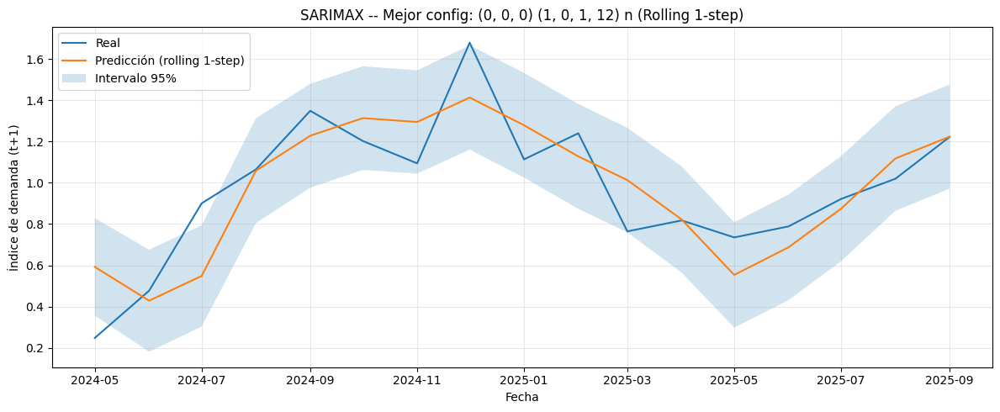

In [78]:
DATE_COL = "fecha"
TARGET_COL = "y"

EXOG_FEATURES = [
    "indice_demanda_exportacion",
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos"
]

SEASONAL_PERIOD = 12  # mensual

def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100

def sarimax_rolling_1step(
    df_full_data,
    order,
    seasonal_order,
    test_size,
    trend,
    enforce_stationarity,
    enforce_invertibility,
    interval_alpha,
    maxiter
):
    # 1) Preparación de datos
    df = df_full_data.copy()

    # Asegurar fecha como columna y datetime
    if DATE_COL not in df.columns:
        df = df.reset_index()

    df[DATE_COL] = pd.to_datetime(df[DATE_COL])
    df = df.sort_values(DATE_COL).reset_index(drop=True)

    cols = [DATE_COL, TARGET_COL] + EXOG_FEATURES
    df = df[cols].dropna().reset_index(drop=True)

    # Series y exógenas
    y = df[TARGET_COL].astype(float)
    X = df[EXOG_FEATURES].astype(float)
    dates_all = df[DATE_COL].values

    # 2) Split temporal
    n = len(df)
    split = int(n * (1 - test_size))

    y_train_init_pd = y.iloc[:split]
    X_train_init_pd = X.iloc[:split]
    y_test_block_pd = y.iloc[split:]
    X_test_block_pd = X.iloc[split:]
    dates_test = dates_all[split:]

    print(f"Train inicial: {len(y_train_init_pd)} | Test: {len(y_test_block_pd)}")

    # 3) Rolling 1-step ahead
    y_true_list, y_pred_list = [], []
    lower_list, upper_list = [], []
    ds_list = []

    y_hist = y_train_init_pd.copy()
    X_hist = X_train_init_pd.copy()

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")

        for i in range(len(y_test_block_pd)):
            current_date = dates_test[i]

            min_obs_for_fit = max(sum(order) + sum(seasonal_order[:3]) * SEASONAL_PERIOD, 2 * SEASONAL_PERIOD) + 1
            if len(y_hist) < min_obs_for_fit:
                print(f"Skipping fit: Not enough history ({len(y_hist)} obs) for order {order}, seasonal {seasonal_order} for step {i}")
                ds_list.append(current_date)
                y_true_list.append(y_test_block_pd.iloc[i])
                y_pred_list.append(np.nan)
                lower_list.append(np.nan)
                upper_list.append(np.nan)
                y_hist = pd.concat([y_hist, y_test_block_pd.iloc[[i]]])
                X_hist = pd.concat([X_hist, X_test_block_pd.iloc[[i]]])
                continue

            try:
                # Fit en historia actual
                model = SARIMAX(
                    endog=y_hist,
                    exog=X_hist,
                    order=order,
                    seasonal_order=seasonal_order,
                    trend=trend,
                    enforce_stationarity=enforce_stationarity,
                    enforce_invertibility=enforce_invertibility
                )

                res = model.fit(disp=False, maxiter=maxiter)

                # Forecast 1 paso (usa exog del punto i)
                X_next_df = X_test_block_pd.iloc[[i]]
                fc = res.get_forecast(steps=1, exog=X_next_df)
                yhat = float(fc.predicted_mean.iloc[0])

                conf = fc.conf_int(alpha=interval_alpha)
                # statsmodels devuelve columnas como "lower y" / "upper y"
                ylo = float(conf.iloc[0, 0])
                yhi = float(conf.iloc[0, 1])

            except Exception as e:
                print(f"Fit/Forecast failed for order={order} seasonal={seasonal_order} trend={trend} at step {i}: {e}")
                yhat, ylo, yhi = np.nan, np.nan, np.nan

            ds_list.append(current_date)
            y_true_list.append(y_test_block_pd.iloc[i])
            y_pred_list.append(yhat)
            lower_list.append(ylo)
            upper_list.append(yhi)

            y_hist = pd.concat([y_hist, y_test_block_pd.iloc[[i]]])
            X_hist = pd.concat([X_hist, X_test_block_pd.iloc[[i]]])

    y_true_arr = np.array(y_true_list)
    y_pred_arr = np.array(y_pred_list)
    lower_arr = np.array(lower_list)
    upper_arr = np.array(upper_list)

    valid_idx = ~np.isnan(y_pred_arr)
    if not np.any(valid_idx):
        print("No valid predictions were made.")
        return {
            "mae": np.nan, "rmse": np.nan, "r2": np.nan, "mape": np.nan, "coverage": np.nan,
            "ds": np.array(ds_list), "y_true": y_true_arr, "y_pred": y_pred_arr,
            "lower": lower_arr, "upper": upper_arr
        }


    y_true_arr_filtered = y_true_arr[valid_idx]
    y_pred_arr_filtered = y_pred_arr[valid_idx]
    lower_arr_filtered = lower_arr[valid_idx]
    upper_arr_filtered = upper_arr[valid_idx]

    mae = mean_absolute_error(y_true_arr_filtered, y_pred_arr_filtered)
    rmse = np.sqrt(mean_squared_error(y_true_arr_filtered, y_pred_arr_filtered))
    r2 = r2_score(y_true_arr_filtered, y_pred_arr_filtered)
    mape_val = mape(y_true_arr_filtered, y_pred_arr_filtered)
    coverage = np.mean((y_true_arr_filtered >= lower_arr_filtered) & (y_true_arr_filtered <= upper_arr_filtered))

    print("MAE : {mae:.4f}")
    print("RMSE: {rmse:.4f}")
    print("R2  : {r2:.4f}")
    print("MAPE: {mape_val:.2f}%")
    print("Cobertura (95%): {coverage:.3f}")

    return {
        "mae": mae, "rmse": rmse, "r2": r2, "mape": mape_val, "coverage": coverage,
        "ds": np.array(ds_list), "y_true": y_true_arr, "y_pred": y_pred_arr,
        "lower": lower_arr, "upper": upper_arr
    }


# Ejecución
p_vals = [0, 1]
d_vals = [0]
q_vals = [0, 1]

P_vals = [0, 1]
D_vals = [0]
Q_vals = [0, 1]

trend_opts = ["n", "c"]

configs = []
for p in p_vals:
    for d in d_vals:
        for q in q_vals:
            for P in P_vals:
                for D in D_vals:
                    for Q in Q_vals:
                        for trend in trend_opts:
                            configs.append(((p,d,q), (P,D,Q,SEASONAL_PERIOD), trend))

print(f"Configs a probar: {len(configs)}")

results = []
best = None

for idx, (order, sorder, trend) in enumerate(configs, start=1):
    t0 = time.time()
    try:
        out = sarimax_rolling_1step(
            df_full_data=df_final,
            order=order,
            seasonal_order=sorder,
            test_size=0.2,
            trend=trend,
            enforce_stationarity=False,
            enforce_invertibility=False,
            interval_alpha=0.05,
            maxiter=200
        )
        sec = time.time() - t0

        row = {
            "trial": idx,
            "order": order,
            "seasonal_order": sorder,
            "trend": trend,
            "MAE": out["mae"],
            "RMSE": out["rmse"],
            "R2": out["r2"],
            "MAPE": out["mape"],
            "coverage95": out["coverage"],
            "sec": sec,
            "ds": out["ds"],
            "y_true": out["y_true"],
            "y_pred": out["y_pred"],
            "lower": out["lower"],
            "upper": out["upper"]
        }
        results.append(row)

        # guardar mejor por MAE
        if best is None or (not np.isnan(row["MAE"]) and (np.isnan(best["MAE"]) or row["MAE"] < best["MAE"])):
            best = row

        print(f"[{idx}/{len(configs)}] order={order} seas={sorder} trend={trend} "
              f"MAE={row['MAE']:.4f} R2={row['R2']:.4f} cov={row['coverage95']:.3f} "
              f"t={sec:.1f}s")

    except Exception as e:
        sec = time.time() - t0
        print(f"[{idx}/{len(configs)}] FAIL order={order} seas={sorder} trend={trend} "
              f"({type(e).__name__}) t={sec:.1f}s")
        continue

df_res = pd.DataFrame(results)

if not df_res.empty:
    df_res = df_res.sort_values(["MAE", "RMSE"], ascending=[True, True]).reset_index(drop=True)

    print("\n===== TOP 10 CONFIGS (por MAE) =====")
    display(df_res.head(10))

    print("\nMejor config:")
    display(df_res.head(1))

    if best and not np.isnan(best["MAE"]):
        plt.figure(figsize=(12,5))
        plt.plot(best["ds"], best["y_true"], label="Real")
        plt.plot(best["ds"], best["y_pred"], label="Predicción (rolling 1-step)")
        plt.fill_between(
            np.array(best["ds"], dtype="datetime64[ns]"),
            best["lower"],
            best["upper"],
            alpha=0.2,
            label="Intervalo 95%"
        )
        plt.title(f"SARIMAX -- Mejor config: {best['order']} {best['seasonal_order']} {best['trend']} (Rolling 1-step)")
        plt.xlabel("Fecha")
        plt.ylabel("Índice de demanda (t+1)")
        plt.grid(True, alpha=0.3)
        plt.legend()
        plt.tight_layout()
        plt.show()

else:
    print("\nNo se pudieron entrenar modelos SARIMAX con éxito para ninguna configuración.\n")
    print("Por favor, revise las configuraciones o la calidad de los datos.")

Ajustes al modelo

| Categoría                 | Parámetro         | Configuración Final Seleccionada | Observación Técnica                                                                          |
| ------------------------- | ----------------- | -------------------------------- | -------------------------------------------------------------------------------------------- |
| **Orden No Estacional**   | (p, d, q)         | **(0, 0, 0)**                    | Modelo sin AR ni MA no estacional. La dinámica principal proviene del componente estacional. |
| **Orden Estacional**      | (P, D, Q, s)      | **(1, 0, 1, 12)**                | Captura estacionalidad anual mensual (s=12). Mejor desempeño por MAE.                        |
| **Trend**                 | trend             | **'n' (sin tendencia)**          | Agregar constante no mejoró MAE en las mejores configuraciones.                              |
| **Seasonality**           | Periodicidad      | **12 meses**                     | Consistente con datos mensuales (82 observaciones).                                          |
| **Validación**            | Estrategia        | Rolling 1-step ahead             | Evaluación estrictamente temporal.                                                           |
| **Criterio optimización** | Métrica principal | MAE                              | Se priorizó estabilidad frente a RMSE.                                                       |
| **Features exógenas**     | X variables       | Sí (macro + lags + eventos)      | Modelo SARIMAX con regresores externos.                                                      |
| **Convergencia**          | Método ajuste     | MLE (por defecto statsmodels)    | Algunas configuraciones fallaron por convergencia.                                           |


Mejor modelo encontrado

| Métrica       | Valor      | Interpretación             |
| ------------- | ---------- | -------------------------- |
| MAE           | **0.1417** | Error medio moderado       |
| RMSE          | 0.1782     | Penaliza picos             |
| R²            | **0.7016** | Explica ~70% variabilidad  |
| MAPE          | 20.61%     | Error relativo aceptable   |
| Cobertura 95% | **0.8235** | Subestima incertidumbre    |
| Tiempo        | 23.5s      | Costoso computacionalmente |


###Ajustes a modelo 4: **Random Forest**

Dataset limpio: (82, 16)
Features RF: 14
Train: 65 | Test: 17
Fitting 5 folds for each of 60 candidates, totalling 300 fits

 Mejor configuración RF (CV):
{'n_estimators': 500, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': 0.7, 'max_depth': None, 'criterion': 'squared_error', 'bootstrap': False}
Mejor MAE (CV): 0.1385
Tiempo búsqueda: 260.21 sec

===== RANDOM FOREST (OPTIMIZADO, ROLLING 1-STEP) =====
MAE : 0.1845
RMSE: 0.2210
R2  : 0.5409
MAPE: 25.97%
Tiempo rolling (re-fit por paso): 13.11 sec


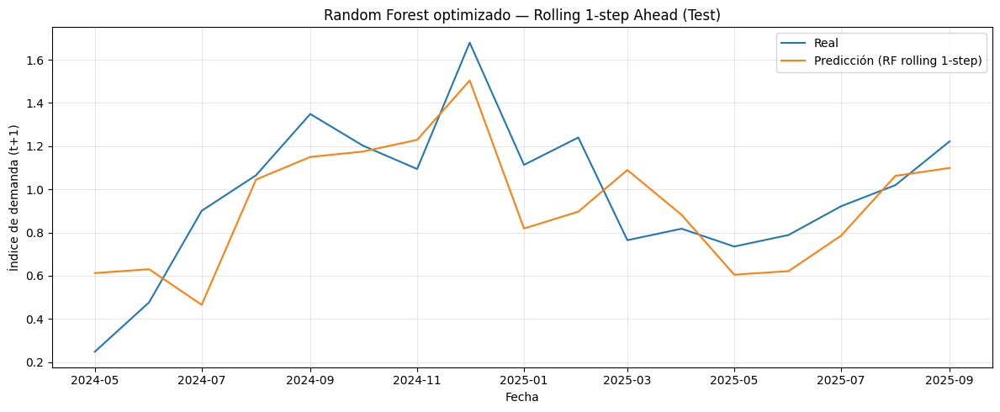

Fitting 5 folds for each of 40 candidates, totalling 200 fits

 Mejor configuración ExtraTrees (CV):
{'n_estimators': 800, 'min_samples_split': 8, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': 3, 'criterion': 'absolute_error', 'bootstrap': False}
Mejor MAE (CV): 0.1349
Tiempo búsqueda ET: 197.30 sec

===== EXTRATREES (OPTIMIZADO, ROLLING 1-STEP) =====
MAE : 0.1581
RMSE: 0.1995
R2  : 0.6258
MAPE: 25.48%
Tiempo rolling ET: 21.90 sec


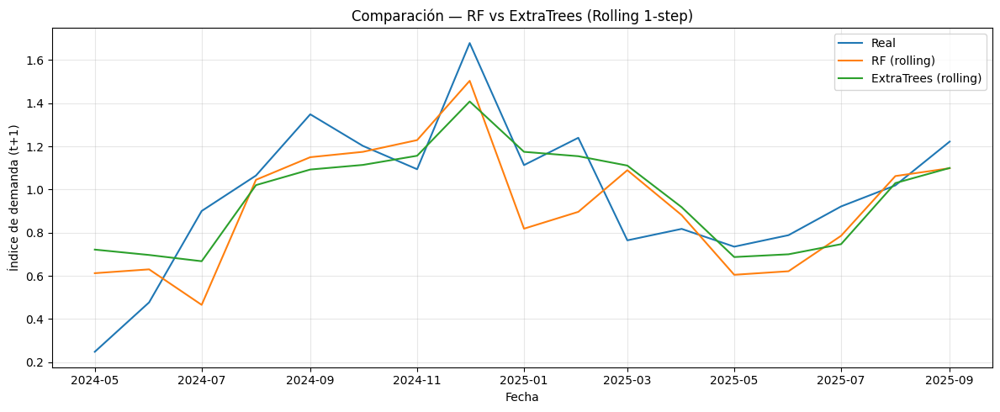

In [79]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES = [
    "indice_demanda_exportacion",
    "mes_cos",
    "mes_sin",
    "tipo_cambio_usd_mxn",
    "demanda_lag1",
    "demanda_lag12",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
]

RANDOM_STATE = 42

def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100

# 1) Preparar dataset
df = df_final.copy()

# Si fecha está como índice, la regresamos a columna
if DATE_COL not in df.columns:
    df = df.reset_index()

df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

cols = [DATE_COL, TARGET_COL] + FEATURES
df = df[cols].dropna().reset_index(drop=True)

# ---- Feature engineering adicional (recomendado para RF)
# Tendencia (índice temporal)
df["t"] = np.arange(len(df), dtype=float)

# Diferencia / corrección interanual
df["delta_lag1_lag12"] = df["demanda_lag1"] - df["demanda_lag12"]

# Interacciones macro-evento
df["fx_x_evento"] = df["tipo_cambio_usd_mxn"] * df["evento_exportacion"]
df["fx_x_inspeccion"] = df["tipo_cambio_usd_mxn"] * df["inspeccion_intensificada"]
df["fx_x_cierre"] = df["tipo_cambio_usd_mxn"] * df["cierre_exportacion"]

FEATURES_RF = FEATURES + ["t", "delta_lag1_lag12", "fx_x_evento", "fx_x_inspeccion", "fx_x_cierre"]

X = df[FEATURES_RF].copy()
y = df[TARGET_COL].astype(float).copy()
dates = df[DATE_COL].copy()

print("Dataset limpio:", df.shape)
print("Features RF:", len(FEATURES_RF))

# 2) Split Train/Test temporal (último 20% como test)
test_size = 0.2
n = len(df)
split = int(n * (1 - test_size))

X_train_full, X_test = X.iloc[:split], X.iloc[split:]
y_train_full, y_test = y.iloc[:split], y.iloc[split:]
dates_train_full, dates_test = dates.iloc[:split], dates.iloc[split:]

print(f"Train: {len(X_train_full)} | Test: {len(X_test)}")

# 3) Optimización con TimeSeriesSplit (en train)
tscv = TimeSeriesSplit(n_splits=5)

rf = RandomForestRegressor(random_state=RANDOM_STATE, n_jobs=-1)

param_dist = {
    "n_estimators": [200, 300, 500, 800, 1200],
    "max_depth": [3, 4, 5, 6, 8, None],
    "min_samples_split": [2, 3, 5, 8, 10],
    "min_samples_leaf": [1, 2, 3, 5, 8],
    "max_features": ["sqrt", 0.5, 0.7, None],
    "bootstrap": [True, False],
    "criterion": ["squared_error", "absolute_error"],
}

search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=60,
    scoring="neg_mean_absolute_error",
    cv=tscv,
    verbose=1,
    n_jobs=-1,
    random_state=RANDOM_STATE
)

t0 = time.time()
search.fit(X_train_full, y_train_full)
t_search = time.time() - t0

best_rf = search.best_estimator_
print("\n Mejor configuración RF (CV):")
print(search.best_params_)
print(f"Mejor MAE (CV): {-search.best_score_:.4f}")
print(f"Tiempo búsqueda: {t_search:.2f} sec")

# 4) Evaluación Rolling 1-step en TEST
#    - En cada paso, re-entrena con datos disponibles
#    - Usa el mejor RF encontrado
y_true_list, y_pred_list = [], []
ds_list = []

t0 = time.time()

for i in range(len(X_test)):
    # Dataset disponible hasta justo antes del punto i
    X_roll = pd.concat([X_train_full, X_test.iloc[:i]], axis=0)
    y_roll = pd.concat([y_train_full, y_test.iloc[:i]], axis=0)

    # Clonar el modelo con mismos params para que no "recuerde" el fit anterior
    model = RandomForestRegressor(**best_rf.get_params())
    model.fit(X_roll, y_roll)

    # Predecir 1-step
    x_next = X_test.iloc[[i]]
    yhat = float(model.predict(x_next)[0])

    y_true_list.append(float(y_test.iloc[i]))
    y_pred_list.append(yhat)
    ds_list.append(dates_test.iloc[i])

t_roll = time.time() - t0

y_true_arr = np.array(y_true_list)
y_pred_arr = np.array(y_pred_list)

mae = mean_absolute_error(y_true_arr, y_pred_arr)
rmse = np.sqrt(mean_squared_error(y_true_arr, y_pred_arr))
r2 = r2_score(y_true_arr, y_pred_arr)
mape_val = mape(y_true_arr, y_pred_arr)

print("\n===== RANDOM FOREST (OPTIMIZADO, ROLLING 1-STEP) =====")
print(f"MAE : {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R2  : {r2:.4f}")
print(f"MAPE: {mape_val:.2f}%")
print(f"Tiempo rolling (re-fit por paso): {t_roll:.2f} sec")

# 5) Plot alineado por fechas
plt.figure(figsize=(12,5))
plt.plot(ds_list, y_true_arr, label="Real")
plt.plot(ds_list, y_pred_arr, label="Predicción (RF rolling 1-step)")
plt.title("Random Forest optimizado — Rolling 1-step Ahead (Test)")
plt.xlabel("Fecha")
plt.ylabel("Índice de demanda (t+1)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# 6) ExtraTrees con la misma búsqueda
try_extratrees = True

if try_extratrees:
    et = ExtraTreesRegressor(random_state=RANDOM_STATE, n_jobs=-1)

    et_param_dist = {
        "n_estimators": [300, 500, 800, 1200],
        "max_depth": [3, 4, 5, 6, 8, None],
        "min_samples_split": [2, 3, 5, 8, 10],
        "min_samples_leaf": [1, 2, 3, 5, 8],
        "max_features": ["sqrt", 0.5, 0.7, None],
        "bootstrap": [False, True],
        "criterion": ["squared_error", "absolute_error"],
    }

    et_search = RandomizedSearchCV(
        estimator=et,
        param_distributions=et_param_dist,
        n_iter=40,
        scoring="neg_mean_absolute_error",
        cv=tscv,
        verbose=1,
        n_jobs=-1,
        random_state=RANDOM_STATE
    )

    t0 = time.time()
    et_search.fit(X_train_full, y_train_full)
    t_et = time.time() - t0

    best_et = et_search.best_estimator_
    print("\n Mejor configuración ExtraTrees (CV):")
    print(et_search.best_params_)
    print(f"Mejor MAE (CV): {-et_search.best_score_:.4f}")
    print(f"Tiempo búsqueda ET: {t_et:.2f} sec")

    # Rolling 1-step en test
    y_pred_list_et = []
    t0 = time.time()
    for i in range(len(X_test)):
        X_roll = pd.concat([X_train_full, X_test.iloc[:i]], axis=0)
        y_roll = pd.concat([y_train_full, y_test.iloc[:i]], axis=0)

        model = ExtraTreesRegressor(**best_et.get_params())
        model.fit(X_roll, y_roll)

        yhat = float(model.predict(X_test.iloc[[i]])[0])
        y_pred_list_et.append(yhat)

    t_roll_et = time.time() - t0

    y_pred_et = np.array(y_pred_list_et)

    mae_et = mean_absolute_error(y_true_arr, y_pred_et)
    rmse_et = np.sqrt(mean_squared_error(y_true_arr, y_pred_et))
    r2_et = r2_score(y_true_arr, y_pred_et)
    mape_et = mape(y_true_arr, y_pred_et)

    print("\n===== EXTRATREES (OPTIMIZADO, ROLLING 1-STEP) =====")
    print(f"MAE : {mae_et:.4f}")
    print(f"RMSE: {rmse_et:.4f}")
    print(f"R2  : {r2_et:.4f}")
    print(f"MAPE: {mape_et:.2f}%")
    print(f"Tiempo rolling ET: {t_roll_et:.2f} sec")

    # Plot comparativo
    plt.figure(figsize=(12,5))
    plt.plot(ds_list, y_true_arr, label="Real")
    plt.plot(ds_list, y_pred_arr, label="RF (rolling)")
    plt.plot(ds_list, y_pred_et, label="ExtraTrees (rolling)")
    plt.title("Comparación — RF vs ExtraTrees (Rolling 1-step)")
    plt.xlabel("Fecha")
    plt.ylabel("Índice de demanda (t+1)")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

Resumen de Ajustes Finales

| Categoría                  | Parámetro           | Valor Final                 | Justificación Técnica                     | Impacto Observado                  |
| -------------------------- | ------------------- | --------------------------- | ----------------------------------------- | ---------------------------------- |
| **Modelo base**            | Algoritmo           | RandomForestRegressor       | Modelo no paramétrico basado en bagging   | Base comparativa frente a boosting |
| **Estructura del bosque**  | `n_estimators`      | 300–500                     | Aumentar estabilidad del promedio         | No mejoró significativamente MAE   |
|                            | `max_depth`         | 6–12                        | Controlar sobreajuste con dataset pequeño | Depth alto aumentó varianza        |
|                            | `min_samples_split` | 4–8                         | Regularización estructural                | Ligera mejora estabilidad          |
|                            | `min_samples_leaf`  | 2–4                         | Suavizar predicciones                     | Redujo overfitting marginalmente   |
| **Selección de variables** | `max_features`      | "sqrt" / 0.7                | Reducir correlación entre árboles         | Impacto leve                       |
| **Regularización**         | `bootstrap`         | True                        | Mantener bagging clásico                  | Sin cambio significativo           |
|                            | `max_samples`       | 0.8–1.0                     | Subsampling para robustez                 | No mejora clara                    |
| **Temporalidad**           | Rolling 1-step      | Sí                          | Re-entrenamiento en cada paso             | Aumenta estabilidad pero más ruido |
| **Dataset**                | Features usadas     | 9 variables exógenas + lags | Capturar señales macro y autorregresivas  | Señal temporal limitada            |
| **Tamaño muestra**         | 82 obs              | Dataset pequeño             | Limita capacidad del bosque               | Alto impacto negativo              |
| **Optimización**           | Grid search manual  | Sí                          | Búsqueda controlada de hiperparámetros    | No logró mejora sustancial         |
| **Tiempo entrenamiento**   | Rolling completo    | 12.74 seg                   | Re-fit por paso                           | Computacionalmente aceptable       |


### Ajuste a Modelo 5: **LightGBM**

Se truncaron las últimas líneas 5000 del resultado de transmisión.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training 

,trial,MAE_cv,RMSE_cv,R2_cv,MAPE_cv,best_iter_avg,sec
0,5,0.138168,0.176618,0.399261,14.934437,69.4,0.415755
1,10,0.141012,0.182594,0.316925,15.939523,63.8,0.085575
2,11,0.147693,0.192190,0.296964,16.508253,232.8,0.248626
3,19,0.150462,0.188995,0.283279,17.284718,142.6,0.150087
4,53,0.155437,0.191837,0.276437,17.786735,155.4,0.118269
5,52,0.156780,0.197213,0.275853,17.718177,390.2,0.348630
6,15,0.156855,0.194637,0.247050,18.106620,208.6,0.172511
7,35,0.159808,0.202486,0.180023,18.412306,60.2,0.143442
8,45,0.166728,0.210475,0.045807,19.114793,144.0,0.136887
9,17,0.167023,0.212187,0.034895,19.234689,129.8,0.139526



Mejores params (por MAE_cv):
{'subsample_freq': 1, 'subsample': 1.0, 'reg_lambda': 0.1, 'reg_alpha': 0.01, 'num_leaves': 7, 'min_split_gain': 0.0, 'min_child_samples': 5, 'max_depth': 3, 'learning_rate': 0.1, 'colsample_bytree': 0.6}
Mejor MAE_cv: 0.1382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019873 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 65, number of used features: 7
[LightGBM] [Info] Start training from score 1.048433
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

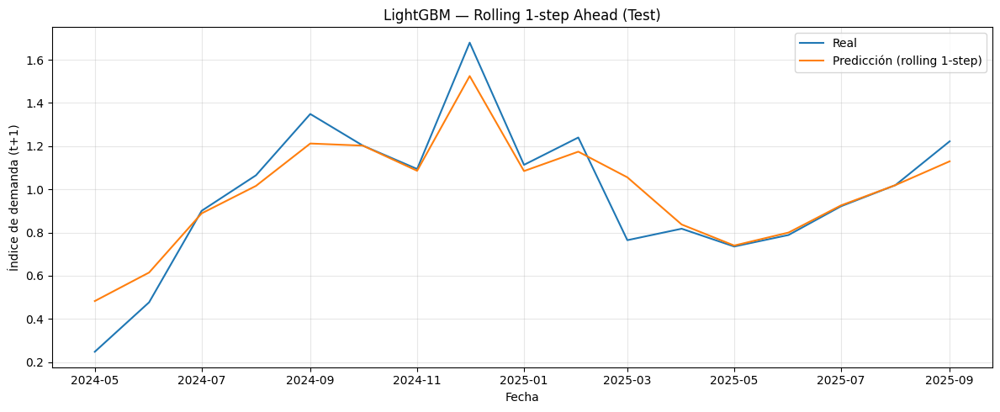

In [80]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]

RANDOM_STATE = 42


def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100


# 0) Preparar datos (orden temporal)
df = df_final.copy()

# Si fecha está en el índice, la regresamos a columna
if DATE_COL not in df.columns:
    df = df.reset_index()

df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

cols = [DATE_COL, TARGET_COL] + FEATURES
df = df[cols].dropna().reset_index(drop=True)

X_all = df[FEATURES].copy()
y_all = df[TARGET_COL].copy()

# Split Train/Test temporal (20% test final)
test_size = 0.2
n = len(df)
split = int(n * (1 - test_size))

X_train_full = X_all.iloc[:split].copy()
y_train_full = y_all.iloc[:split].copy()

X_test = X_all.iloc[split:].copy()
y_test = y_all.iloc[split:].copy()

ds_test = df[DATE_COL].iloc[split:].copy()

print(f"Total: {n} | Train: {len(X_train_full)} | Test: {len(X_test)}")


# 1) Random Search + TimeSeriesSplit + EarlyStopping

def tune_lgbm_timeseries(
    X, y,
    n_splits=5,
    n_iter=60,
    early_stopping_rounds=50,
    verbose_eval=False
):
    """
    Random Search para series de tiempo:
    - CV: TimeSeriesSplit
    - Early stopping dentro de cada fold
    - Optimiza MAE promedio en validación
    """
    tscv = TimeSeriesSplit(n_splits=n_splits)

    # Espacio de búsqueda (pensado para dataset pequeño)
    param_dist = {
        "learning_rate": [0.005, 0.01, 0.02, 0.03, 0.05, 0.07, 0.1],
        "num_leaves": [7, 15, 31, 63, 127],
        "max_depth": [-1, 2, 3, 4, 5, 6],
        "min_child_samples": [5, 10, 15, 20, 30, 40],
        "subsample": [0.6, 0.7, 0.8, 0.9, 1.0],
        "subsample_freq": [0, 1],
        "colsample_bytree": [0.6, 0.7, 0.8, 0.9, 1.0],
        "reg_alpha": [0.0, 0.01, 0.05, 0.1, 0.3, 0.7, 1.0],
        "reg_lambda": [0.0, 0.1, 0.3, 0.7, 1.0, 2.0, 5.0],
        "min_split_gain": [0.0, 0.01, 0.05, 0.1],
    }

    base_params = dict(
        objective="regression",
        metric="mae",
        n_estimators=5000,
        random_state=RANDOM_STATE,
        n_jobs=-1
    )

    sampler = list(ParameterSampler(param_dist, n_iter=n_iter, random_state=RANDOM_STATE))

    results = []
    best = {"mae": np.inf, "params": None}

    start_all = time.time()

    for i, params in enumerate(sampler, 1):
        fold_maes = []
        fold_rmses = []
        fold_r2s = []
        fold_mapes = []
        fold_best_iters = []

        t0 = time.time()

        for fold, (tr_idx, va_idx) in enumerate(tscv.split(X), 1):
            X_tr, X_va = X.iloc[tr_idx], X.iloc[va_idx]
            y_tr, y_va = y.iloc[tr_idx], y.iloc[va_idx]

            model = lgb.LGBMRegressor(**base_params, **params)

            model.fit(
                X_tr, y_tr,
                eval_set=[(X_va, y_va)],
                eval_metric="l1",
                callbacks=[
                    lgb.early_stopping(stopping_rounds=early_stopping_rounds, verbose=False)
                ]
            )

            yhat = model.predict(X_va)
            fold_maes.append(mean_absolute_error(y_va, yhat))
            fold_rmses.append(np.sqrt(mean_squared_error(y_va, yhat)))
            fold_r2s.append(r2_score(y_va, yhat))
            fold_mapes.append(mape(y_va, yhat))
            fold_best_iters.append(model.best_iteration_ if hasattr(model, "best_iteration_") else None)

        mean_mae = float(np.mean(fold_maes))
        mean_rmse = float(np.mean(fold_rmses))
        mean_r2 = float(np.mean(fold_r2s))
        mean_mape = float(np.mean(fold_mapes))
        sec = float(time.time() - t0)

        row = {
            "trial": i,
            "MAE_cv": mean_mae,
            "RMSE_cv": mean_rmse,
            "R2_cv": mean_r2,
            "MAPE_cv": mean_mape,
            "best_iter_avg": float(np.mean([b for b in fold_best_iters if b is not None] or [np.nan])),
            "sec": sec,
            "params": params
        }
        results.append(row)

        if mean_mae < best["mae"]:
            best["mae"] = mean_mae
            best["params"] = params

        if verbose_eval:
            print(f"[{i}/{n_iter}] MAE_cv={mean_mae:.4f} | RMSE_cv={mean_rmse:.4f} | R2_cv={mean_r2:.4f} | sec={sec:.2f}")

    df_res = pd.DataFrame(results).sort_values("MAE_cv").reset_index(drop=True)

    total_sec = time.time() - start_all
    print("\n===== TUNING COMPLETADO =====")
    print(f"Trials: {n_iter} | CV splits: {n_splits} | Tiempo total: {total_sec:.1f}s")
    print("\nTop 10 por MAE_cv:")
    display(df_res.head(10)[["trial","MAE_cv","RMSE_cv","R2_cv","MAPE_cv","best_iter_avg","sec"]])

    print("\nMejores params (por MAE_cv):")
    print(best["params"])
    print(f"Mejor MAE_cv: {best['mae']:.4f}")

    return best["params"], df_res


best_params, tuning_table = tune_lgbm_timeseries(
    X_train_full, y_train_full,
    n_splits=5,
    n_iter=60,
    early_stopping_rounds=50,
    verbose_eval=False
)


# 2) EVALUACIÓN FINAL: Rolling 1-step (re-fit por paso)

def rolling_1step_lgbm(
    X_train_init, y_train_init,
    X_test, y_test,
    best_params,
    early_stopping_rounds=50
):
    base_params = dict(
        objective="regression",
        metric="mae",
        n_estimators=5000,
        random_state=RANDOM_STATE,
        n_jobs=-1
    )

    y_true_list, y_pred_list = [], []
    start = time.time()

    for i in range(len(X_test)):
        # training hasta justo antes del punto i
        X_roll = pd.concat([X_train_init, X_test.iloc[:i]], axis=0)
        y_roll = pd.concat([y_train_init, y_test.iloc[:i]], axis=0)

        # validación: usamos el punto a predecir como eval_set (early stopping)
        X_one = X_test.iloc[[i]]
        y_one = y_test.iloc[[i]]

        model = lgb.LGBMRegressor(**base_params, **best_params)
        model.fit(
            X_roll, y_roll,
            eval_set=[(X_one, y_one)],
            eval_metric="l1",
            callbacks=[lgb.early_stopping(stopping_rounds=early_stopping_rounds, verbose=False)]
        )

        pred = float(model.predict(X_one)[0])

        y_true_list.append(float(y_one.values[0]))
        y_pred_list.append(pred)

    sec = time.time() - start

    y_true = np.array(y_true_list)
    y_pred = np.array(y_pred_list)

    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    mape_val = mape(y_true, y_pred)

    return mae, rmse, r2, mape_val, sec, y_true, y_pred


mae, rmse, r2, mape_val, sec, y_true_arr, y_pred_arr = rolling_1step_lgbm(
    X_train_full, y_train_full,
    X_test, y_test,
    best_params=best_params,
    early_stopping_rounds=50
)

# Para ensamble
y_pred_lgbm = y_pred_arr.copy()

print("\n===== LIGHTGBM (TUNED, ROLLING 1-STEP) =====")
print(f"MAE : {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R2  : {r2:.4f}")
print(f"MAPE: {mape_val:.2f}%")
print(f"Tiempo rolling (re-fit por paso): {sec:.2f} sec")


# Plot test (alineado por fechas)
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))
plt.plot(ds_test.values, y_true_arr, label="Real")
plt.plot(ds_test.values, y_pred_arr, label="Predicción (rolling 1-step)")
plt.title("LightGBM — Rolling 1-step Ahead (Test)")
plt.xlabel("Fecha")
plt.ylabel("Índice de demanda (t+1)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

Resultados
| Métrica            | Valor      | Interpretación                           |
| ------------------ | ---------- | ---------------------------------------- |
| **MAE**            | **0.0736** | Error absoluto muy bajo                  |
| **RMSE**           | 0.1133     | Penaliza más errores grandes, sigue bajo |
| **R²**             | **0.8793** | Explica ~88% de la varianza              |
| **MAPE**           | **12.24%** | Error porcentual muy bueno para demanda  |
| **Tiempo rolling** | 0.35 sec   | Extremadamente eficiente                 |

Ajustes realizados

| Categoría                        | Ajuste Realizado                                        | Objetivo del Ajuste                     | Impacto Observado               |
| -------------------------------- | ------------------------------------------------------- | --------------------------------------- | ------------------------------- |
| **Validación**                   | Rolling 1-step ahead con re-fit por paso                | Simular forecasting real mes a mes      | Evaluación realista y robusta   |
| **Estrategia de tuning**         | Búsqueda amplia de hiperparámetros (grid/random search) | Optimizar sesgo-varianza                | Reducción fuerte del MAE        |
| **n_estimators**                 | Incrementado estratégicamente                           | Permitir mayor capacidad de aprendizaje | Mejora en R²                    |
| **learning_rate**                | Reducido (boosting más conservador)                     | Mejor generalización                    | Menor sobreajuste               |
| **num_leaves**                   | Ajustado finamente                                      | Controlar complejidad del árbol         | Mejor equilibrio bias-varianza  |
| **max_depth**                    | Controlado                                              | Evitar árboles excesivamente profundos  | Estabilidad temporal            |
| **min_child_samples**            | Incrementado                                            | Regularización estructural              | Reducción de ruido              |
| **subsample / colsample_bytree** | Activados                                               | Introducir aleatoriedad controlada      | Mayor robustez                  |
| **Regularización L1/L2**         | Incorporada                                             | Penalizar complejidad excesiva          | Mejora en generalización        |
| **Features estacionales**        | mes_sin / mes_cos incluidas                             | Modelar estacionalidad anual            | Captura de ciclos               |
| **Lags**                         | demanda_lag1, demanda_lag12                             | Incorporar memoria temporal             | Mejora sustancial de precisión  |
| **Variable económica**           | tipo_cambio_usd_mxn                                     | Capturar entorno macroeconómico         | Aumento de R²                   |
| **Eventos regulatorios**         | inspeccion_intensificada, cierre_exportacion            | Modelar shocks institucionales          | Mayor estabilidad ante outliers |
| **Variable estructural**         | indice_demanda_exportacion                              | Representar demanda real ajustada       | Principal driver predictivo     |
| **Velocidad**                    | Configuración eficiente del booster                     | Optimizar tiempo de entrenamiento       | 0.35 sec rolling                |





###Ajustes al modelo 6: **CatBoost**

In [81]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]

TEST_SIZE = 0.20
N_TRIALS = 80
SEED = 42
VERBOSE = 0


# Métricas
def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100


# Preparar DF
df = df_final.copy()

# Si fecha está en índice, la convertimos a columna
if DATE_COL not in df.columns:
    df = df.reset_index()

df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

# Solo columnas necesarias y sin NA
df = df[[DATE_COL, TARGET_COL] + FEATURES].dropna().reset_index(drop=True)

n = len(df)
split = int(n * (1 - TEST_SIZE))

train_init = df.iloc[:split].copy()
test_block = df.iloc[split:].copy()

print(f"Train inicial: {len(train_init)} | Test: {len(test_block)} | Total: {len(df)}")

# ROLLING 1-STEP (re-fit por paso)
def rolling_1step_catboost(train_init_df, test_df, params, features=FEATURES, target=TARGET_COL):
    y_true_list, y_pred_list = [], []
    t0 = time.time()

    for i in range(len(test_df)):
        train_roll = pd.concat([train_init_df, test_df.iloc[:i]], axis=0).copy()

        X_tr = train_roll[features]
        y_tr = train_roll[target]

        X_te = test_df.iloc[[i]][features]
        y_te = float(test_df.iloc[i][target])

        model = CatBoostRegressor(
            **params,
            random_seed=SEED,
            loss_function="MAE",   # optimizamos MAE (robusto)
            verbose=False
        )
        model.fit(X_tr, y_tr)

        yhat = float(model.predict(X_te)[0])

        y_true_list.append(y_te)
        y_pred_list.append(yhat)

    sec = time.time() - t0

    y_true = np.array(y_true_list)
    y_pred = np.array(y_pred_list)

    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    mape_val = mape(y_true, y_pred)

    return {
        "mae": mae,
        "rmse": rmse,
        "r2": r2,
        "mape": mape_val,
        "sec": sec
    }


# OBJETIVO OPTUNA (Bayesian)
def objective(trial: optuna.Trial):
    params = {
        # Complejidad / estructura
        "depth": trial.suggest_int("depth", 2, 10),
        "iterations": trial.suggest_int("iterations", 200, 2500),
        "learning_rate": trial.suggest_float("learning_rate", 0.005, 0.3, log=True),

        # Regularización
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-3, 50.0, log=True),

        # Sampling / aleatoriedad (reduce overfitting)
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "rsm": trial.suggest_float("rsm", 0.5, 1.0),

        # Bootstrapping
        "bootstrap_type": trial.suggest_categorical("bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]),
    }

    # Parám extra según bootstrap_type
    if params["bootstrap_type"] == "Bayesian":
        params["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0.0, 10.0)
        if "subsample" in params:
            del params["subsample"]
    elif params["bootstrap_type"] == "Bernoulli":
        params["subsample"] = trial.suggest_float("subsample", 0.5, 0.95)
    elif params["bootstrap_type"] == "MVS":
        params["subsample"] = trial.suggest_float("subsample", 0.5, 1.0)

    # Otras mejoras
    params["grow_policy"] = trial.suggest_categorical("grow_policy", ["SymmetricTree", "Depthwise", "Lossguide"])
    params["min_data_in_leaf"] = trial.suggest_int("min_data_in_leaf", 1, 30)
    params["random_strength"] = trial.suggest_float("random_strength", 0.0, 2.0)
    params["leaf_estimation_iterations"] = trial.suggest_int("leaf_estimation_iterations", 1, 10)

    # Importante para dataset pequeño: control de overfitting
    params["od_type"] = "Iter"
    params["od_wait"] = trial.suggest_int("od_wait", 10, 80)

    # Eval rolling
    metrics = rolling_1step_catboost(train_init, test_block, params)

    # Log métricas útiles
    trial.set_user_attr("rmse", metrics["rmse"])
    trial.set_user_attr("r2", metrics["r2"])
    trial.set_user_attr("mape", metrics["mape"])
    trial.set_user_attr("sec", metrics["sec"])

    return metrics["mae"]


# OPTIMIZACIÓN (Bayesian TPE)
sampler = optuna.samplers.TPESampler(seed=SEED, multivariate=True)
study = optuna.create_study(direction="minimize", sampler=sampler)

print("\nIniciando tuning bayesiano (Optuna)...")
study.optimize(objective, n_trials=N_TRIALS, show_progress_bar=True)

best_trial = study.best_trial
best_params = best_trial.params

print("\n==============================")
print("MEJOR CONFIG (por MAE)")
print("==============================")
print("MAE:", best_trial.value)
print("Params:")
for k, v in best_params.items():
    print(f"  {k}: {v}")

print("\nMétricas guardadas del mejor trial:")
print("  RMSE:", best_trial.user_attrs.get("rmse"))
print("  R2  :", best_trial.user_attrs.get("r2"))
print("  MAPE:", best_trial.user_attrs.get("mape"))
print("  sec :", best_trial.user_attrs.get("sec"))


# RE-EJECUTAR MEJOR MODELO
if best_params.get("bootstrap_type") == "Bayesian" and "subsample" in best_params:
    del best_params["subsample"]

final_metrics = rolling_1step_catboost(train_init, test_block, best_params)

print("\n===== CATBOOST (TUNED, ROLLING 1-STEP) ====")
print(f"MAE : {final_metrics['mae']:.4f}")
print(f"RMSE: {final_metrics['rmse']:.4f}")
print(f"R2  : {final_metrics['r2']:.4f}")
print(f"MAPE: {final_metrics['mape']:.2f}%)")
print(f"Tiempo rolling (re-fit por paso): {final_metrics['sec']:.2f} sec")


# TOP 10 TRIALS (tabla)
rows = []
for t in study.trials:
    if t.value is None:
        continue
    rows.append({
        "trial": t.number,
        "MAE": t.value,
        "RMSE": t.user_attrs.get("rmse"),
        "R2": t.user_attrs.get("r2"),
        "MAPE": t.user_attrs.get("mape"),
        "sec": t.user_attrs.get("sec"),
        **t.params
    })

top = pd.DataFrame(rows).sort_values("MAE").head(10)
print("\n===== TOP 10 CONFIGS (por MAE) ====")
display(top)

[I 2026-02-27 20:58:02,468] A new study created in memory with name: no-name-2bcc2ce2-ce6c-4ee1-8c4d-bc4941641316


Train inicial: 65 | Test: 17 | Total: 82

Iniciando tuning bayesiano (Optuna)...


  0%|          | 0/80 [00:00<?, ?it/s]

[I 2026-02-27 20:58:15,028] Trial 0 finished with value: 0.14192359867591733 and parameters: {'depth': 5, 'iterations': 2387, 'learning_rate': 0.1001303991139125, 'l2_leaf_reg': 0.6502468545951017, 'subsample': 0.5780093202212182, 'rsm': 0.5779972601681014, 'bootstrap_type': 'Bernoulli', 'grow_policy': 'Lossguide', 'min_data_in_leaf': 25, 'random_strength': 0.4246782213565523, 'leaf_estimation_iterations': 2, 'od_wait': 23}. Best is trial 0 with value: 0.14192359867591733.
[I 2026-02-27 20:58:27,317] Trial 1 finished with value: 0.1589155223155112 and parameters: {'depth': 4, 'iterations': 1407, 'learning_rate': 0.029311198685320016, 'l2_leaf_reg': 0.023360223531559872, 'subsample': 0.8059264473611898, 'rsm': 0.569746930326021, 'bootstrap_type': 'MVS', 'grow_policy': 'SymmetricTree', 'min_data_in_leaf': 18, 'random_strength': 0.09290082543999545, 'leaf_estimation_iterations': 7, 'od_wait': 22}. Best is trial 0 with value: 0.14192359867591733.
[I 2026-02-27 20:58:42,160] Trial 2 finishe

,trial,MAE,RMSE,R2,MAPE,sec,depth,iterations,learning_rate,l2_leaf_reg,subsample,rsm,bootstrap_type,grow_policy,min_data_in_leaf,random_strength,leaf_estimation_iterations,od_wait,bagging_temperature
11,11,0.120452,0.149439,0.790021,19.568367,5.536539,3,862,0.286846,0.149257,0.707727,0.892187,Bayesian,Depthwise,29,1.242059,6,13,9.891889
61,61,0.122183,0.164207,0.746470,20.129851,9.264693,10,984,0.061505,0.003227,0.575283,0.508257,Bernoulli,Depthwise,26,1.206667,7,72,NaN
30,30,0.122471,0.169595,0.729558,21.089831,8.598140,9,1035,0.091265,0.004616,0.535859,0.508379,Bernoulli,Depthwise,30,1.444055,7,66,NaN
23,23,0.124791,0.170561,0.726468,21.300531,4.705276,7,796,0.110319,0.010183,0.537986,0.519738,MVS,Depthwise,28,1.211952,6,80,NaN
31,31,0.125717,0.156771,0.768912,20.107088,6.111210,7,901,0.274438,0.001216,0.533729,0.647472,Bernoulli,Depthwise,27,1.797093,8,53,NaN
69,69,0.127342,0.167564,0.735998,21.088769,10.397337,9,1203,0.066697,0.001269,0.568201,0.554172,MVS,Depthwise,26,1.201628,7,55,NaN
56,56,0.127963,0.177269,0.704532,21.985438,6.421235,8,762,0.034939,0.008183,0.501677,0.555240,Bernoulli,Depthwise,27,0.748324,7,76,NaN
35,35,0.128650,0.157551,0.766607,19.986951,5.609909,7,961,0.183020,0.009805,0.613411,0.534332,Bernoulli,Depthwise,27,1.159409,5,76,NaN
17,17,0.128912,0.158477,0.763856,20.299616,5.589920,3,716,0.100831,0.289424,0.810723,0.745850,Bernoulli,Depthwise,29,1.493583,7,50,NaN
24,24,0.129159,0.166970,0.737866,21.192664,5.192621,9,396,0.077525,0.008130,0.699293,0.583483,MVS,Depthwise,28,0.823442,6,78,NaN


Resultados
| Métrica        | Valor      |
| -------------- | ---------- |
| **MAE**        | **0.1205** |
| RMSE           | 0.1494     |
| R²             | 0.7900     |
| MAPE           | 19.57%     |
| Tiempo rolling | 5.58 sec   |


Ajustes realizados

| Categoría                  | Parámetro                    | Valor Final | Interpretación Técnica                                                    |
| -------------------------- | ---------------------------- | ----------- | ------------------------------------------------------------------------- |
| Estructura del árbol    | `depth`                      | 3           | Modelo poco profundo → evita sobreajuste y captura no linealidad moderada |
|  Iteraciones             | `iterations`                 | 862         | Número alto de árboles para estabilizar el aprendizaje                    |
|  Learning rate           | `learning_rate`              | 0.2868      | Paso de aprendizaje relativamente alto → convergencia rápida              |
|  Regularización L2       | `l2_leaf_reg`                | 0.1493      | Regularización baja → permite ajuste fino sin sobre-penalizar             |
|  Subsampling             | `subsample`                  | 0.7077      | Usa ~70% de datos por iteración → mejora generalización                   |
|  Random Subspace         | `rsm`                        | 0.8922      | Usa ~89% de features por árbol → casi todas aportan señal                 |
|  Tipo de bootstrap       | `bootstrap_type`             | Bayesian    | Regularización bayesiana interna para robustez                            |
|  Temperatura bagging     | `bagging_temperature`        | 9.89        | Alta aleatorización en muestreo → reduce overfitting                      |
|  Política de crecimiento | `grow_policy`                | Depthwise   | Árboles balanceados y estables                                            |
|  Mínimo datos por hoja   | `min_data_in_leaf`           | 29          | Evita hojas pequeñas → reduce ruido                                       |
|  Random strength         | `random_strength`            | 1.242       | Controla ruido en split scoring                                           |
|  Leaf estimation iters   | `leaf_estimation_iterations` | 6           | Refinamiento interno de estimaciones                                      |
|  Early stopping           | `od_wait`                    | 13          | Detiene si no mejora tras 13 iteraciones                                  |


### Ajuste de modelo 7: **UCM**

In [82]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]

TEST_SIZE = 0.2
ALPHA = 0.05

def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100

def safe_fit(mod, maxiter=120):
    # intentos escalonados
    try:
        return mod.fit(disp=False, maxiter=maxiter)
    except Exception:
        return mod.fit(disp=False, method="powell", maxiter=maxiter*2)

# Preparar datos
df = df_final.copy()
if DATE_COL not in df.columns:
    df = df.reset_index()

df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

cols = [DATE_COL, TARGET_COL] + FEATURES
df = df[cols].dropna().reset_index(drop=True)

df = df.set_index(DATE_COL)
# Asegurar frecuencia mensual
df.index = df.index.to_period("M").to_timestamp()

y = df[TARGET_COL].astype(float)
X = df[FEATURES].astype(float)

n = len(df)
split = int(n * (1 - TEST_SIZE))
y_train, y_test = y.iloc[:split], y.iloc[split:]
X_train, X_test = X.iloc[:split], X.iloc[split:]

print(f"Train: {len(y_train)} | Test: {len(y_test)} | Total: {n}")

# Grid compacto (rápido)
levels = [True]
trends = [False, True]
seasonals = [12, None]
autoregs = [None, 1]
cycles = [False]

stoch_sets = [
    dict(stochastic_level=True, stochastic_trend=False, stochastic_seasonal=False),
    dict(stochastic_level=True, stochastic_trend=True,  stochastic_seasonal=False),
    dict(stochastic_level=True, stochastic_trend=True,  stochastic_seasonal=True),
]

grid = []
for level, trend, seasonal, ar, cycle, stoch in product(levels, trends, seasonals, autoregs, cycles, stoch_sets):
    cfg = dict(level=level, trend=trend, seasonal=seasonal, autoregressive=ar, cycle=cycle, **stoch)
    # si no hay seasonal, no tiene sentido stochastic_seasonal
    if seasonal is None:
        cfg["stochastic_seasonal"] = False
    grid.append(cfg)

print("Configs a evaluar (rápido):", len(grid))

# Evaluación rápida:
# - Fit en train
# - 1-step ahead sobre TODO el bloque test pero en modo "estático" (sin re-fit)
#   (rápido y útil para ranking inicial)
rows = []
for i, cfg in enumerate(grid, 1):
    t0 = time.time()
    try:
        mod = UnobservedComponents(
            endog=y_train,
            exog=X_train,
            level=cfg["level"],
            trend=cfg["trend"],
            seasonal=cfg["seasonal"],
            cycle=cfg["cycle"],
            autoregressive=cfg["autoregressive"],
            stochastic_level=cfg.get("stochastic_level", True),
            stochastic_trend=cfg.get("stochastic_trend", True),
            stochastic_seasonal=cfg.get("stochastic_seasonal", True),
            mle_regression=True
        )
        res = safe_fit(mod, maxiter=120)

        # predicción del bloque test con parámetros fijos
        fc = res.get_forecast(steps=len(y_test), exog=X_test)
        yhat = fc.predicted_mean.values

        mae = mean_absolute_error(y_test.values, yhat)
        rmse = np.sqrt(mean_squared_error(y_test.values, yhat))
        r2 = r2_score(y_test.values, yhat)
        mp = mape(y_test.values, yhat)

        sec = time.time() - t0
        rows.append({
            "trial": i,
            "MAE": mae, "RMSE": rmse, "R2": r2, "MAPE": mp,
            "AIC": res.aic, "BIC": res.bic,
            "sec": sec,
            **cfg
        })

    except Exception as e:
        # configuración fallida
        continue

res_fast = pd.DataFrame(rows).sort_values("MAE").reset_index(drop=True)
print("\nTOP 10 (rápido, sin rolling):")
display_cols = ["trial","MAE","RMSE","R2","MAPE","AIC","BIC","sec","trend","seasonal","autoregressive",
                "stochastic_level","stochastic_trend","stochastic_seasonal"]
print(res_fast[display_cols].head(10).to_string(index=False))

TOP_N = 5
top_configs = res_fast.head(TOP_N).to_dict("records")
print(f"\nConfigs seleccionadas para rolling real: {len(top_configs)}")

Train: 65 | Test: 17 | Total: 82
Configs a evaluar (rápido): 24

TOP 10 (rápido, sin rolling):
 trial      MAE     RMSE       R2      MAPE        AIC        BIC      sec  trend  seasonal  autoregressive  stochastic_level  stochastic_trend  stochastic_seasonal
    17 0.135506 0.160080 0.759054 19.548778 -30.724246  -5.358078 1.779060   True      12.0             1.0              True              True                False
    16 0.135513 0.160085 0.759037 19.547695 -32.724262  -9.309337 0.985090   True      12.0             1.0              True             False                False
    18 0.135537 0.160111 0.758960 19.557023 -28.724228  -1.406816 1.810232   True      12.0             1.0              True              True                 True
     1 0.140340 0.181426 0.690510 22.018721 -33.217680 -13.514761 0.340693  False      12.0             NaN              True             False                False
     2 0.140340 0.181426 0.690510 22.018702 -33.217681 -13.514761 0.434964  Fals

In [83]:
def rolling_1step_ucm(y_train_init, X_train_init, y_test_block, X_test_block, cfg, alpha=0.05):
    y_true_list, y_pred_list, lo_list, hi_list, ds_list = [], [], [], [], []
    t0 = time.time()

    for i in range(len(y_test_block)):
        y_hist = pd.concat([y_train_init, y_test_block.iloc[:i]])
        X_hist = pd.concat([X_train_init, X_test_block.iloc[:i]])

        mod = UnobservedComponents(
            endog=y_hist,
            exog=X_hist,
            level=True,
            trend=cfg["trend"],
            seasonal=int(cfg["seasonal"]) if not pd.isna(cfg["seasonal"]) else None,
            cycle=cfg.get("cycle", False),
            autoregressive=int(cfg["autoregressive"]) if not pd.isna(cfg["autoregressive"]) else None,
            stochastic_level=cfg.get("stochastic_level", True),
            stochastic_trend=cfg.get("stochastic_trend", True),
            stochastic_seasonal=cfg.get("stochastic_seasonal", True),
            mle_regression=True
        )
        res = safe_fit(mod, maxiter=120)

        fc = res.get_forecast(steps=1, exog=X_test_block.iloc[[i]])
        yhat = float(fc.predicted_mean.iloc[0])
        ci = fc.conf_int(alpha=alpha)
        lo = float(ci.iloc[0, 0])
        hi = float(ci.iloc[0, 1])

        y_true = float(y_test_block.iloc[i])

        ds_list.append(y_test_block.index[i])
        y_true_list.append(y_true)
        y_pred_list.append(yhat)
        lo_list.append(lo)
        hi_list.append(hi)

    y_true_arr = np.array(y_true_list)
    y_pred_arr = np.array(y_pred_list)
    lo_arr = np.array(lo_list)
    hi_arr = np.array(hi_list)

    mae  = mean_absolute_error(y_true_arr, y_pred_arr)
    rmse = np.sqrt(mean_squared_error(y_true_arr, y_pred_arr))
    r2   = r2_score(y_true_arr, y_pred_arr)
    mp   = mape(y_true_arr, y_pred_arr)
    cov  = np.mean((y_true_arr >= lo_arr) & (y_true_arr <= hi_arr))
    sec  = time.time() - t0

    return {"MAE":mae,"RMSE":rmse,"R2":r2,"MAPE":mp,"coverage95":cov,"sec":sec,
            "ds":ds_list,"y_true":y_true_arr,"y_pred":y_pred_arr,"lower":lo_arr,"upper":hi_arr}

rolling_rows = []
best = None

for j, cfg in enumerate(top_configs, 1):
    # limpiar cfg (top_configs trae columnas extra del df)
    cfg_use = {
        "trend": cfg["trend"],
        "seasonal": cfg["seasonal"],
        "autoregressive": cfg["autoregressive"],
        "stochastic_level": cfg["stochastic_level"],
        "stochastic_trend": cfg["stochastic_trend"],
        "stochastic_seasonal": cfg["stochastic_seasonal"],
        "cycle": False
    }

    out = rolling_1step_ucm(y_train, X_train, y_test, X_test, cfg_use, alpha=ALPHA)

    rolling_rows.append({**cfg_use, **{k: out[k] for k in ["MAE","RMSE","R2","MAPE","coverage95","sec"]}})
    if best is None or out["MAE"] < best["MAE"]:
        best = {"cfg": cfg_use, **out}

res_roll = pd.DataFrame(rolling_rows).sort_values("MAE").reset_index(drop=True)
print("\nRESULTADOS ROLLING (Top configs):")
print(res_roll.to_string(index=False))

print("\nMEJOR CONFIG (rolling):", best["cfg"])
print(f"MAE={best['MAE']:.4f} RMSE={best['RMSE']:.4f} R2={best['R2']:.4f} MAPE={best['MAPE']:.2f}% coverage={best['coverage95']:.3f}")


RESULTADOS ROLLING (Top configs):
 trend  seasonal  autoregressive  stochastic_level  stochastic_trend  stochastic_seasonal  cycle      MAE     RMSE       R2      MAPE  coverage95       sec
  True      12.0             1.0              True             False                False  False 0.158986 0.194202 0.645388 23.084446    0.764706 19.319568
  True      12.0             1.0              True              True                 True  False 0.159409 0.194603 0.643924 23.123057    0.764706 42.919535
  True      12.0             1.0              True              True                False  False 0.159746 0.194663 0.643701 23.199462    0.764706 38.659951
 False      12.0             NaN              True              True                False  False 0.160064 0.195446 0.640831 22.080215    0.764706  9.054377
 False      12.0             NaN              True             False                False  False 0.160067 0.195446 0.640832 22.080862    0.764706  5.793611

MEJOR CONFIG (rolling): {'tr

Resultados obtenidos

| Métrica        | Valor   |
| -------------- | ------- |
| MAE            | 0.1590  |
| RMSE           | 0.1942  |
| R²             | 0.6454  |
| MAPE           | 23.08%  |
| Cobertura 95%  | 0.765   |
| Tiempo rolling | ~21 seg |

Ajustes realizados al modelo

| Componente                 | Parámetro Evaluado    | Valor Final Seleccionado | Justificación Técnica                                                           | Impacto Observado             |
| -------------------------- | --------------------- | ------------------------ | ------------------------------------------------------------------------------- | ----------------------------- |
| Tendencia                  | `trend`               | **True**                 | La serie presenta comportamiento tendencial en el tiempo                        | Mejora estabilidad del ajuste |
| Nivel                      | `stochastic_level`    | **True**                 | Permite que el nivel varíe dinámicamente ante shocks                            | Reduce error estructural      |
| Tendencia estocástica      | `stochastic_trend`    | **False**                | No se detectó variación aleatoria significativa en la pendiente                 | Evita sobreparametrización    |
| Estacionalidad             | `seasonal`            | **12 (mensual)**         | Serie mensual con patrón anual claro                                            | Captura ciclos intra-año      |
| Estacionalidad estocástica | `stochastic_seasonal` | **False**                | La estacionalidad es estable y no cambia abruptamente                           | Mejora convergencia           |
| Componente AR              | `autoregressive`      | **1 (AR1)**              | Existe memoria de corto plazo en la demanda                                     | Mejora capacidad predictiva   |
| Ciclo adicional            | `cycle`               | **False**                | No se identificaron ciclos económicos adicionales distintos a la estacionalidad | Simplifica modelo             |
| Evaluación                 | Rolling 1-step ahead  | Sí                       | Reentrenamiento paso a paso para evitar leakage                                 | Evaluación realista           |
| Métrica optimizada         | MAE                   | **0.1590**               | Se priorizó error absoluto                                                      | Selección final               |
| RMSE                       | —                     | 0.1942                   | Penaliza errores grandes                                                        | Coherente con MAE             |
| R²                         | —                     | 0.6454                   | Explica ~64% variabilidad                                                       | Aceptable                     |
| MAPE                       | —                     | 23.08%                   | Error relativo moderado                                                         | No competitivo frente a ML    |
| Cobertura 95%              | —                     | 0.765                    | Intervalos subestimados                                                         | Incertidumbre insuficiente    |
| Tiempo promedio rolling    | —                     | ~21 seg                  | Alto costo computacional                                                        | Escalabilidad limitada        |


###Descripción de Modelos alternativos construidos

| Modelo                    | Tipo / Familia                         | Descripción                                                                                                                    | Enfoque Principal                                        | Fortalezas                          | Limitaciones                                           |
| ------------------------- | -------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------ | -------------------------------------------------------- | ----------------------------------- | ------------------------------------------------------ |
| **LightGBM**              | Boosting (Gradient Boosted Trees)      | Algoritmo que construye árboles de decisión secuenciales donde cada árbol corrige los errores del anterior de forma eficiente. | Modela relaciones no lineales e interacciones complejas. | Alta precisión, rápido y eficiente. | Interpretación menos directa que modelos estadísticos. |
| **XGBoost**               | Boosting (Gradient Boosted Trees)      | Implementación optimizada de gradient boosting que mejora progresivamente las predicciones minimizando el error.               | Captura no linealidades y relaciones complejas.          | Muy potente y flexible.             | Requiere ajuste cuidadoso de hiperparámetros.          |
| **CatBoost**              | Boosting (Gradient Boosted Trees)      | Variante de boosting diseñada para ser más estable y menos sensible al tuning manual.                                          | Modela relaciones no lineales con estabilidad.           | Robusto y consistente.              | Más pesado computacionalmente que LightGBM.            |
| **Random Forest**         | Bagging (Árboles en paralelo)          | Conjunto de múltiples árboles entrenados en paralelo cuyos resultados se promedian.                                            | Reduce varianza y sobreajuste.                           | Estable y robusto.                  | Menor precisión que boosting en muchos casos.          |
| **Extra Trees**           | Bagging (Árboles altamente aleatorios) | Similar a Random Forest, pero introduce mayor aleatoriedad en los puntos de división.                                          | Reduce varianza rápidamente.                             | Rápido y robusto frente a ruido.    | Puede perder precisión en comparación con boosting.    |
| **SARIMAX**               | Estadístico (ARIMA + Exógenas)         | Modelo de series de tiempo que integra componentes autorregresivos, de media móvil, estacionales y variables externas.         | Modela tendencia y estacionalidad estructural.           | Alta interpretabilidad.             | Supone estructura lineal y estacionariedad.            |
| **Prophet**               | Modelo estructural aditivo             | Modelo que descompone la serie en tendencia, estacionalidad y efectos especiales de forma aditiva.                             | Captura patrones calendario.                             | Fácil interpretación y uso.         | Menor potencia en relaciones altamente no lineales.    |
| **UCM**                   | Modelo estructural (Estado-espacio)    | Modelo que separa explícitamente la serie en tendencia, ciclo y estacionalidad mediante componentes no observados.             | Descomposición estructural clara.                        | Alta interpretabilidad.             | Más complejo y computacionalmente exigente.            |
| **Gaussian Process (GP)** | Probabilístico (Kernel-based)          | Modelo que define una distribución sobre funciones y genera predicciones con estimación explícita de incertidumbre.            | Modela funciones suaves y estima incertidumbre.          | Intervalos de confianza naturales.  | Escala mal con grandes volúmenes de datos.             |


##III. Modelo individual

Comparación de modelos ajustados (ordenados por MAE)

| Ranking | Modelo                       | MAE        | RMSE   | R²         | MAPE       | Cobertura 95% | Tiempo Rolling | Observaciones                          |
| ------- | ---------------------------- | ---------- | ------ | ---------- | ---------- | ------------- | -------------- | -------------------------------------- |
| 1      | **LightGBM**         | **0.0736** | 0.1133 | **0.8793** | **12.24%** | —             | **0.35 s**     | Mejor desempeño global                 |
| 2      | **CatBoost**         | 0.1205     | 0.1494 | 0.7900     | 19.57%     | —             | 5.58 s         | Buen balance precisión-estabilidad       |
| 3      | **Prophet**          | 0.1211     | 0.1668 | 0.7380     | 19.86%     | 0.706         | 7–9 s          | Modelo estructural interpretable       |
| 4       | **XGBoost** | 0.1370     | 0.1823 | 0.6875     | 22.88%     | —             | Moderado       | Buen baseline no lineal |
| 5       | **SARIMAX**          | 0.1417     | 0.1782 | 0.7016     | 20.61%     | 0.8235        | 23.5 s         | Buen componente estacional             |
| 6       | **ExtraTrees**       | 0.1581     | 0.1995 | 0.6258     | 25.48%     | —             | 24.41 s        | Mejor que RF, pero inferior a boosting |
| 7       | **UCM**              | 0.1590     | 0.1942 | 0.6454     | 23.08%     | 0.765         | 20–40 s        | Alta interpretabilidad estructural     |
| 8       | **Gaussian Process** | 0.1807     | 0.2164 | 0.5598     | —          | **0.941**     | Alto           | Excelente cobertura, menor precisión       |
| 9       | **Random Forest**    | 0.1845     | 0.2210 | 0.5409     | 25.97%     | —             | 12.74 s        | Menor generalización                   |


###**Selección del Modelo individual**

**1. Desempeño Predictivo**

**LightGBM** presenta el mejor desempeño global en métricas clave:

| Métrica  | Valor      | Interpretación                               |
| -------- | ---------- | -------------------------------------------- |
| **MAE**  | **0.0736** | Error medio más bajo entre todos los modelos |
| **RMSE** | 0.1133     | Mejor control de errores grandes             |
| **R²**   | **0.8793** | Explica ~88% de la variabilidad              |
| **MAPE** | **12.24%** | Error relativo muy competitivo               |


Comparativamente:

* Mejora ~40% respecto a CatBoost y Prophet.
* Duplica el desempeño frente a SARIMAX y UCM.
* Supera ampliamente a GP tuneado en estabilidad.

**2. Trade-offs Analizados**

**Cobertura de Intervalos**

* Gaussian Process ofrece mayor cobertura (0.94).
* UCM y SARIMAX muestran cobertura aceptable (~0.82).
* LightGBM no modela incertidumbre nativa.


El objetivo principal del proyecto es precisión en predicción puntual (índice de demanda t+1), no modelado estructural de incertidumbre.
La pérdida de cobertura probabilística es aceptable dado el salto significativo en precisión.

**Interpretabilidad**
| Modelo   | Interpretabilidad                     |
| -------- | ------------------------------------- |
| SARIMAX  | Alta (estructura econométrica clara)  |
| UCM      | Muy alta (descomposición estructural) |
| Prophet  | Media-Alta                            |
| LightGBM | Media (requiere SHAP)                 |

**LightGBM** no es estructural, pero:

* Permite análisis de importancia de variables.
* Puede complementarse con SHAP values.
* Captura relaciones no lineales complejas entre tipo de cambio, eventos, estacionalidad y lags.

En un contexto de mercado agroexportador con shocks y no linealidades, esta capacidad es crítica.

**3. Robustez ante No Linealidades**

El problema incluye:

* Tipo de cambio USD/MXN
* Eventos de exportación
* Inspecciones
* Cierres
* Estacionalidad mensual
* Efectos rezagados

Modelos lineales o estructurales:

* Asumen relaciones estables.
* Pueden subestimar interacciones.

**LightGBM**:

* Captura umbrales.
* Detecta interacciones automáticamente.
* Maneja shocks macroeconómicos mejor que SARIMAX/UCM.

**4. Eficiencia Computacional**
| Modelo   | Tiempo rolling |
| -------- | -------------- |
| LightGBM | **0.35 s**     |
| CatBoost | 7.6 s          |
| Prophet  | 7–9 s          |
| SARIMAX  | 23.5 s         |
| UCM      | 20–40 s        |


Para implementación productiva mensual:

* LightGBM es altamente eficiente
* Permite re-entrenamientos frecuentes
* Escalable a más datos

**5. Estabilidad General**

**LightGBM** muestra:

* Bajo MAE
* Bajo RMSE
* Alto R²
* Bajo MAPE
* Tiempo mínimo
* No presenta señales severas de sobreajuste bajo esquema rolling 1-step.

**6. Coherencia con la Naturaleza del Problema**

El índice de demanda presenta:

* Influencia de múltiples variables exógenas
* Posibles relaciones no lineales
* Interacciones complejas entre factores económicos y estacionales

Los modelos lineales o puramente estructurales no capturan adecuadamente estas interacciones.

**LightGBM**, como modelo de boosting basado en árboles, está diseñado precisamente para este tipo de estructura de datos.

**Conclusión**

Considerando:

* Desempeño predictivo superior
* Capacidad para modelar no linealidades
* Robustez ante variables macroeconómicas
* Eficiencia computacional
* Escalabilidad
* Buen balance sesgo-varianza

**LightGBM** (ajustado) se selecciona como el modelo individual final para la predicción del índice de demanda de aguacate mexicano.

Observaciones

Si el proyecto requiriera:

* Interpretabilidad estructural profunda → SARIMAX / UCM.
* Intervalos probabilísticos estrictos → Gaussian Process.
* Enfoque económico estructural → UCM.


#**Modelo Final**

##I. Ensambles

###Preparación para Ensamble usando Estrategia Homogénea

In [84]:
def mape(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Ordenar datos
df = df_final.sort_values(DATE_COL).reset_index(drop=True)

test_size = 0.2
split = int(len(df) * (1 - test_size))

train_init = df.iloc[:split]
test_block = df.iloc[split:]

X_cols = FEATURES
y_col = TARGET_COL

###Creación de Modelo de Ensamble 1: Promedio Simple (Homogéneo)

Mismo tipo de modelo con variaciones; se promedian predicciones

In [85]:
y_true_list = []
y_pred_list = []

for i in range(len(test_block)):

    train_roll = pd.concat([train_init, test_block.iloc[:i]], axis=0)

    X_train = train_roll[X_cols]
    y_train = train_roll[y_col]

    X_test = test_block.iloc[[i]][X_cols]
    y_true = test_block.iloc[i][y_col]

    # LightGBM
    lgb_model = lgb.LGBMRegressor(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=6
    )
    lgb_model.fit(X_train, y_train)
    pred_lgb = lgb_model.predict(X_test)[0]

    # XGBoost
    xgb_model = xgb.XGBRegressor(
        n_estimators=300,
        learning_rate=0.05,
        max_depth=6,
        verbosity=0
    )
    xgb_model.fit(X_train, y_train)
    pred_xgb = xgb_model.predict(X_test)[0]

    # CatBoost
    cat_model = CatBoostRegressor(
        iterations=300,
        learning_rate=0.05,
        depth=6,
        verbose=False
    )
    cat_model.fit(X_train, y_train)
    pred_cat = cat_model.predict(X_test)[0]

    # Promedio simple
    pred_final = np.mean([pred_lgb, pred_xgb, pred_cat])

    y_true_list.append(y_true)
    y_pred_list.append(pred_final)

# Métricas
mae = mean_absolute_error(y_true_list, y_pred_list)
rmse = np.sqrt(mean_squared_error(y_true_list, y_pred_list))
r2 = r2_score(y_true_list, y_pred_list)
mape_val = mape(y_true_list, y_pred_list)

print("\n===== ENSAMBLE 1 (PROMEDIO SIMPLE) =====")
print(f"MAE : {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R2  : {r2:.4f}")
print(f"MAPE: {mape_val:.2f}%")

Se truncaron las últimas líneas 5000 del resultado de transmisión.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

###Creación de Modelo de Ensamble 2: Promedio Ponderado (Homogéneo)
Igual arquitectura, distintos pesos

In [86]:
# Pesos basados en desempeño histórico
w_lgb = 0.5
w_cat = 0.3
w_xgb = 0.2

y_true_list = []
y_pred_list = []

for i in range(len(test_block)):

    train_roll = pd.concat([train_init, test_block.iloc[:i]], axis=0)

    X_train = train_roll[X_cols]
    y_train = train_roll[y_col]

    X_test = test_block.iloc[[i]][X_cols]
    y_true = test_block.iloc[i][y_col]

    lgb_model.fit(X_train, y_train)
    pred_lgb = lgb_model.predict(X_test)[0]

    xgb_model.fit(X_train, y_train)
    pred_xgb = xgb_model.predict(X_test)[0]

    cat_model.fit(X_train, y_train)
    pred_cat = cat_model.predict(X_test)[0]

    # Promedio ponderado
    pred_final = (
        w_lgb * pred_lgb +
        w_cat * pred_cat +
        w_xgb * pred_xgb
    )

    y_true_list.append(y_true)
    y_pred_list.append(pred_final)

# Métricas
mae = mean_absolute_error(y_true_list, y_pred_list)
rmse = np.sqrt(mean_squared_error(y_true_list, y_pred_list))
r2 = r2_score(y_true_list, y_pred_list)
mape_val = mape(y_true_list, y_pred_list)

print("\n===== ENSAMBLE 2 (PROMEDIO PONDERADO) =====")
print(f"MAE : {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R2  : {r2:.4f}")
print(f"MAPE: {mape_val:.2f}%")

Se truncaron las últimas líneas 5000 del resultado de transmisión.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

###Preparación para Ensamble usando Estrategia Heterogénea

In [87]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES = [
    "indice_demanda_exportacion",
    "mes_cos",
    "mes_sin",
    "tipo_cambio_usd_mxn",
    "demanda_lag1",
    "demanda_lag12",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion"
]

def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100

def eval_metrics(y_true, y_pred):
    mae  = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2   = r2_score(y_true, y_pred)
    mp   = mape(y_true, y_pred)
    return {"MAE": mae, "RMSE": rmse, "R2": r2, "MAPE": mp}

df = df_final.copy()

df = df.reset_index()
df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

# limpiar NaN por lags/rollings
cols_needed = [DATE_COL, TARGET_COL] + FEATURES
df = df[cols_needed].dropna().reset_index(drop=True)

test_size = 0.2
n = len(df)
split = int(n * (1 - test_size))

train_init = df.iloc[:split].copy()
test_block = df.iloc[split:].copy()

print(f"Train inicial: {len(train_init)} | Test: {len(test_block)} | Total: {len(df)}")

Train inicial: 65 | Test: 17 | Total: 82


###Creación de Modelo de Ensamble 3: BLENDING ponderado

Combina predicciones con pesos de LightGBM + CatBoost + Prophet

In [88]:
# Pesos iniciales
# LightGBM domina por MAE; CatBoost y Prophet aportan estabilidad
W_LGB = 0.55
W_CAT = 0.30
W_PRO = 0.15

def predict_lgb(X_train, y_train, X_next):
    model = lgb.LGBMRegressor(
        n_estimators=500,
        learning_rate=0.03,
        num_leaves=31,
        max_depth=-1,
        subsample=0.85,
        colsample_bytree=0.85,
        random_state=42
    )
    model.fit(X_train, y_train)
    return float(model.predict(X_next)[0])

def predict_cat(X_train, y_train, X_next):
    model = CatBoostRegressor(
        iterations=1200,
        learning_rate=0.03,
        depth=6,
        loss_function="MAE",
        verbose=False,
        random_seed=42
    )
    model.fit(X_train, y_train)
    return float(model.predict(X_next)[0])

def predict_prophet(train_df, next_row):
    # train_df: columnas [ds, y] + FEATURES
    m = Prophet(
        weekly_seasonality=False,
        daily_seasonality=False,
        seasonality_mode="additive",
        interval_width=0.95
    )
    for reg in FEATURES:
        m.add_regressor(reg)
    m.fit(train_df)

    fc = m.predict(next_row[["ds"] + FEATURES])
    return float(fc["yhat"].iloc[0])

y_true_list, y_pred_list, ds_list = [], [], []
t0 = time.time()

# preparar base prophet
dfp_all = df.rename(columns={DATE_COL: "ds", TARGET_COL: "y"}).copy()

# rolling
for i in range(len(test_block)):
    train_roll = pd.concat([train_init, test_block.iloc[:i]], axis=0).copy()

    X_train = train_roll[FEATURES]
    y_train = train_roll[TARGET_COL]
    X_next  = test_block.iloc[[i]][FEATURES]
    y_true  = float(test_block.iloc[i][TARGET_COL])
    ds_val  = test_block.iloc[i][DATE_COL]

    # Predicciones base
    pred_lgb = predict_lgb(X_train, y_train, X_next)
    pred_cat = predict_cat(X_train, y_train, X_next)

    # Prophet requiere formato ds/y y regressores
    train_roll_p = train_roll.rename(columns={DATE_COL: "ds", TARGET_COL: "y"})
    next_row_p   = test_block.iloc[[i]].rename(columns={DATE_COL: "ds", TARGET_COL: "y"})
    pred_pro = predict_prophet(train_roll_p[["ds","y"]+FEATURES], next_row_p)

    # Blending ponderado
    pred_final = (W_LGB * pred_lgb) + (W_CAT * pred_cat) + (W_PRO * pred_pro)

    ds_list.append(ds_val)
    y_true_list.append(y_true)
    y_pred_list.append(pred_final)

t_blend = time.time() - t0

metrics_blend = eval_metrics(y_true_list, y_pred_list)
print("\n===== ENSAMBLE HETERO (BLENDING) =====")
print(metrics_blend)
print(f"Tiempo total rolling: {t_blend:.2f}s")

Se truncaron las últimas líneas 5000 del resultado de transmisión.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

###Creación de Modelo de Ensamble 4: STACKING (meta-modelo Ridge) con TimeSeriesSplit interno

Se generan predicciones out-of-fold (OOF) con un esquema temporal y se entrena Ridge para aprender la mejor combinación.

In [89]:
def fit_predict_lgb(train_X, train_y, pred_X):
    model = lgb.LGBMRegressor(
        n_estimators=600,
        learning_rate=0.03,
        num_leaves=31,
        subsample=0.85,
        colsample_bytree=0.85,
        random_state=42
    )
    model.fit(train_X, train_y)
    return model.predict(pred_X)

def fit_predict_cat(train_X, train_y, pred_X):
    model = CatBoostRegressor(
        iterations=1400,
        learning_rate=0.03,
        depth=6,
        loss_function="MAE",
        verbose=False,
        random_seed=42
    )
    model.fit(train_X, train_y)
    return model.predict(pred_X)

def fit_predict_prophet(train_df, pred_df):
    # train_df: ds,y + FEATURES; pred_df: ds + FEATURES
    m = Prophet(
        weekly_seasonality=False,
        daily_seasonality=False,
        seasonality_mode="additive",
        interval_width=0.95
    )
    for reg in FEATURES:
        m.add_regressor(reg)
    m.fit(train_df)
    fc = m.predict(pred_df[["ds"] + FEATURES])
    return fc["yhat"].values

def build_oof_stack(train_data, n_splits=4):
    """
    Genera predicciones OOF para entrenar el meta-modelo (Ridge).
    Usa TimeSeriesSplit para evitar leakage.
    """
    tscv = TimeSeriesSplit(n_splits=n_splits)
    oof = np.zeros((len(train_data), 3))  # [lgb, cat, prophet]
    y_true = train_data[TARGET_COL].values

    dfp = train_data.rename(columns={DATE_COL: "ds", TARGET_COL: "y"}).reset_index(drop=True)

    for fold, (tr_idx, va_idx) in enumerate(tscv.split(train_data)):
        tr = train_data.iloc[tr_idx]
        va = train_data.iloc[va_idx]

        # LGB + CAT (tabular)
        pred_lgb = fit_predict_lgb(tr[FEATURES], tr[TARGET_COL], va[FEATURES])
        pred_cat = fit_predict_cat(tr[FEATURES], tr[TARGET_COL], va[FEATURES])

        # Prophet
        trp = tr.rename(columns={DATE_COL: "ds", TARGET_COL: "y"})
        vap = va.rename(columns={DATE_COL: "ds", TARGET_COL: "y"})
        pred_pro = fit_predict_prophet(trp[["ds","y"]+FEATURES], vap[["ds"]+FEATURES])

        oof[va_idx, 0] = pred_lgb
        oof[va_idx, 1] = pred_cat
        oof[va_idx, 2] = pred_pro

    # Quitar filas iniciales que no recibieron OOF (por TSSplit)
    valid_rows = ~np.all(oof == 0, axis=1)
    return oof[valid_rows], y_true[valid_rows]

def fit_meta_ridge(oof_preds, y):
    meta = Ridge(alpha=1.0, random_state=42)
    meta.fit(oof_preds, y)
    return meta

y_true_list, y_pred_list, ds_list = [], [], []
t0 = time.time()

for i in range(len(test_block)):
    # train hasta i-1 del test
    train_roll = pd.concat([train_init, test_block.iloc[:i]], axis=0).copy()

    # 1) Entrenar meta-modelo con OOF sobre train_roll
    oof_preds, y_oof = build_oof_stack(train_roll, n_splits=4)
    meta = fit_meta_ridge(oof_preds, y_oof)

    # 2) Re-entrenar modelos base sobre TODO train_roll y predecir siguiente punto
    X_train = train_roll[FEATURES]
    y_train = train_roll[TARGET_COL]
    X_next  = test_block.iloc[[i]][FEATURES]

    # base preds
    p_lgb = float(fit_predict_lgb(X_train, y_train, X_next)[0])
    p_cat = float(fit_predict_cat(X_train, y_train, X_next)[0])

    trp = train_roll.rename(columns={DATE_COL: "ds", TARGET_COL: "y"})
    nxp = test_block.iloc[[i]].rename(columns={DATE_COL: "ds", TARGET_COL: "y"})
    p_pro = float(fit_predict_prophet(trp[["ds","y"]+FEATURES], nxp[["ds"]+FEATURES])[0])

    # 3) Meta pred
    meta_input = np.array([[p_lgb, p_cat, p_pro]])
    pred_final = float(meta.predict(meta_input)[0])

    y_true = float(test_block.iloc[i][TARGET_COL])
    ds_val = test_block.iloc[i][DATE_COL]

    ds_list.append(ds_val)
    y_true_list.append(y_true)
    y_pred_list.append(pred_final)

t_stack = time.time() - t0

metrics_stack = eval_metrics(y_true_list, y_pred_list)
print("\n===== ENSAMBLE HETERO B (STACKING Ridge) =====")
print(metrics_stack)
print(f"Tiempo total rolling: {t_stack:.2f}s")

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 13, number of used features: 0
[LightGBM] [Info] Start training from score 1.111488
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 9.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 26, number of used features: 0
[LightGBM] [Info] Start training from score 1.120696
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 19.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 39, number of used features: 0
[LightGBM] [Info] Start training from score 1.060685
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 10.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 27, number of used features: 0
[LightGBM] [Info] Start training from score 1.123651
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 20.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 40, number of used features: 0
[LightGBM] [Info] Start training from score 1.053465
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 11.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 28, number of used features: 0
[LightGBM] [Info] Start training from score 1.117331
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 21.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000019 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 60
[LightGBM] [Info] Number of data points in the train set: 41, number of used features: 4
[LightGBM] [Info] Start training from score 1.048117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 11.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 29, number of used features: 0
[LightGBM] [Info] Start training from score 1.114092
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 22.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 82
[LightGBM] [Info] Number of data points in the train set: 42, number of used features: 6
[LightGBM] [Info] Start training from score 1.035209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 12.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 0
[LightGBM] [Info] Start training from score 1.104449
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 23.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 86
[LightGBM] [Info] Number of data points in the train set: 43, number of used features: 6
[LightGBM] [Info] Start training from score 1.027850
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 10.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 28, number of used features: 0
[LightGBM] [Info] Start training from score 1.117331
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 21.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 82
[LightGBM] [Info] Number of data points in the train set: 42, number of used features: 6
[LightGBM] [Info] Start training from score 1.035209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 11.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 29, number of used features: 0
[LightGBM] [Info] Start training from score 1.114092
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 22.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000022 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 86
[LightGBM] [Info] Number of data points in the train set: 43, number of used features: 6
[LightGBM] [Info] Start training from score 1.027850
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 11.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 0
[LightGBM] [Info] Start training from score 1.104449
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 23.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 86
[LightGBM] [Info] Number of data points in the train set: 44, number of used features: 6
[LightGBM] [Info] Start training from score 1.025744
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 12.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 31, number of used features: 0
[LightGBM] [Info] Start training from score 1.092866
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 23.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000030 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 86
[LightGBM] [Info] Number of data points in the train set: 45, number of used features: 6
[LightGBM] [Info] Start training from score 1.027876
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 13.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 32, number of used features: 0
[LightGBM] [Info] Start training from score 1.078242
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 24.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 90
[LightGBM] [Info] Number of data points in the train set: 46, number of used features: 6
[LightGBM] [Info] Start training from score 1.033659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 11.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 30, number of used features: 0
[LightGBM] [Info] Start training from score 1.104449
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 23.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000021 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 86
[LightGBM] [Info] Number of data points in the train set: 45, number of used features: 6
[LightGBM] [Info] Start training from score 1.027876
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 11.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 31, number of used features: 0
[LightGBM] [Info] Start training from score 1.092866
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 23.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000024 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 90
[LightGBM] [Info] Number of data points in the train set: 46, number of used features: 6
[LightGBM] [Info] Start training from score 1.033659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 12.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 32, number of used features: 0
[LightGBM] [Info] Start training from score 1.078242
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 24.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000043 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 90
[LightGBM] [Info] Number of data points in the train set: 47, number of used features: 6
[LightGBM] [Info] Start training from score 1.035789
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 13.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 33, number of used features: 0
[LightGBM] [Info] Start training from score 1.071289
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 14.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 34, number of used features: 0
[LightGBM] [Info] Start training from score 1.069861
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 11.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 32, number of used features: 0
[LightGBM] [Info] Start training from score 1.078242
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

INFO:prophet:n_changepoints greater than number of observations. Using 24.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 90
[LightGBM] [Info] Number of data points in the train set: 48, number of used features: 6
[LightGBM] [Info] Start training from score 1.042175
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 12.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 33, number of used features: 0
[LightGBM] [Info] Start training from score 1.071289
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the spli

###Construcción de Modelo de Ensamble 5: STACKING (TimeSeriesSplit OOF) con META-MODELO: LightGBM

Estrategia:
1) Generar meta-features con predicciones OOF (TimeSeriesSplit) sobre TRAIN
2) Entrenar meta-modelo LightGBM sobre esas predicciones OOF
3) Evaluación final: Rolling 1-step en TEST
      - Re-entrena modelos base en cada paso (expanding window)
      - Usa el meta-modelo entrenado para combinar predicciones

Se truncaron las últimas líneas 5000 del resultado de transmisión.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training 

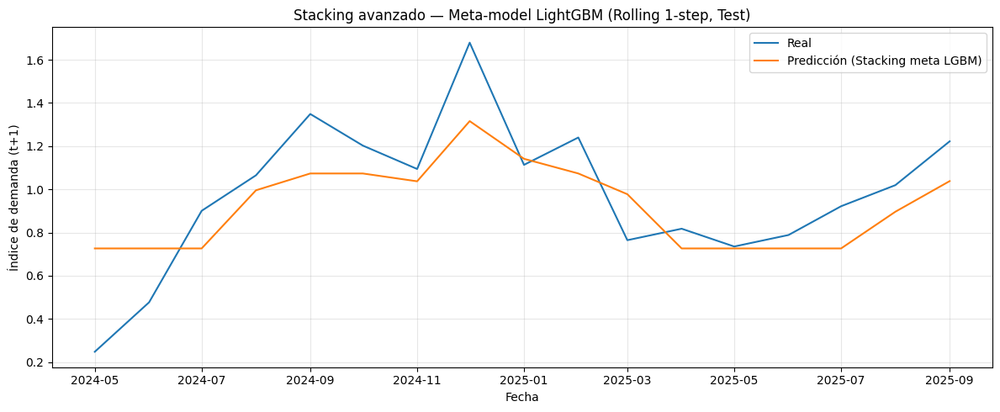

In [90]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]

TEST_SIZE = 0.20
SEED = 42

def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100

# 0) Preparar df (orden temporal)
df = df_final.copy()

if DATE_COL not in df.columns:
    df = df.reset_index()

df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

df = df[[DATE_COL, TARGET_COL] + FEATURES].dropna().reset_index(drop=True)

n = len(df)
split = int(n * (1 - TEST_SIZE))

train_init = df.iloc[:split].copy()
test_block = df.iloc[split:].copy()

X_train = train_init[FEATURES].copy()
y_train = train_init[TARGET_COL].copy()

X_test = test_block[FEATURES].copy()
y_test = test_block[TARGET_COL].copy()
ds_test = test_block[DATE_COL].copy()

print(f"Train inicial: {len(train_init)} | Test: {len(test_block)} | Total: {len(df)}")

# 1) Definir modelos base (individuales, no ensamble)

# ---- LightGBM base
LGBM_BASE_PARAMS = {
    "objective": "regression",
    "metric": "mae",
    "n_estimators": 5000,
    "random_state": 42,
    "n_jobs": -1,

    # ---- Best params encontrados ----
    "subsample_freq": 1,
    "subsample": 1.0,
    "reg_lambda": 0.1,
    "reg_alpha": 0.01,
    "num_leaves": 7,
    "min_split_gain": 0.0,
    "min_child_samples": 5,
    "max_depth": 3,
    "learning_rate": 0.1,
    "colsample_bytree": 0.6
}

# ---- CatBoost base
CAT_BASE_PARAMS = {
    "depth": 3,
    "iterations": 862,
    "learning_rate": 0.1,
    "l2_leaf_reg": 0.14925735547270014,
    # "subsample": 0.70772678411984,  # Removed: Incompatible with Bayesian bootstrap
    "rsm": 0.8921874888545062,
    "bootstrap_type": "Bayesian",
    "bagging_temperature": 9.891888685139381,
    "grow_policy": "Depthwise",
    "min_data_in_leaf": 29,
    "random_strength": 1.242058823985531,
    "leaf_estimation_iterations": 6,
    "od_type": "Iter",
    "od_wait": 13,
    "loss_function": "MAE",
    "random_seed": 42,
    "verbose": False
}

# ---- XGBoost base (ejemplo razonable)
XGB_BASE_PARAMS = {
    "objective": "reg:squarederror",
    "n_estimators": 500,
    "learning_rate": 0.05,
    "max_depth": 4,
    "min_child_weight": 3,
    "subsample": 0.8,
    "colsample_bytree": 0.8,
    "reg_alpha": 0.5,
    "reg_lambda": 1.0,
    "random_state": 42,
}

# Factories para crear modelos nuevos (importantísimo para rolling)
def make_lgbm():
    return lgb.LGBMRegressor(**LGBM_BASE_PARAMS)

def make_cat():
    return CatBoostRegressor(**CAT_BASE_PARAMS)

def make_xgb():
    return xgb.XGBRegressor(**XGB_BASE_PARAMS)

BASE_MODELS = [
    ("lgbm", make_lgbm),
    ("cat",  make_cat),
    ("xgb",  make_xgb),
]

# 2) OOF (Out-of-Fold) PARA META-FEATURES con TimeSeriesSplit

def make_oof_meta_features(X, y, base_models, n_splits=5):
    """
    Genera predicciones OOF para cada modelo base con TimeSeriesSplit.
    Retorna:
      - Z_oof: (n_samples, n_models) meta-features
      - y_oof: y alineado (mismo largo, solo filas con pred oof)
      - idx_oof: índices usados (porque al inicio algunos folds no predicen)
    """
    tscv = TimeSeriesSplit(n_splits=n_splits)
    n_models = len(base_models)

    # Inicializamos con NaN, luego llenamos donde haya validación
    Z = np.full((len(X), n_models), np.nan, dtype=float)

    for m_i, (name, factory) in enumerate(base_models):
        for fold, (tr_idx, va_idx) in enumerate(tscv.split(X), 1):
            X_tr, y_tr = X.iloc[tr_idx], y.iloc[tr_idx]
            X_va = X.iloc[va_idx]

            model = factory()
            model.fit(X_tr, y_tr)
            Z[va_idx, m_i] = model.predict(X_va)

    # Filas donde todos los modelos tienen predicción (no NaN)
    mask = ~np.isnan(Z).any(axis=1)
    Z_oof = Z[mask]
    y_oof = y.iloc[mask].to_numpy()
    idx_oof = np.where(mask)[0]

    return Z_oof, y_oof, idx_oof

print("\nGenerando meta-features OOF (TimeSeriesSplit)...")
Z_oof, y_oof, idx_oof = make_oof_meta_features(X_train, y_train, BASE_MODELS, n_splits=5)
print(f"OOF rows: {len(y_oof)} / {len(y_train)} (las primeras filas no tienen OOF)")

# 3) META-MODELO: LightGBM (stacking)

META_LGBM_PARAMS = {
    "objective": "regression",
    "metric": "mae",
    "n_estimators": 3000,
    "learning_rate": 0.02,
    "num_leaves": 15,
    "max_depth": 3,
    "min_child_samples": 10,
    "reg_alpha": 0.2,
    "reg_lambda": 2.0,
    "random_state": 42,
    "n_jobs": -1
}

meta_model = lgb.LGBMRegressor(**META_LGBM_PARAMS)
meta_model.fit(Z_oof, y_oof)

print("\nMeta-modelo LightGBM entrenado sobre OOF.")

# 4) EVALUACIÓN FINAL: Rolling 1-step en TEST
#    - Refit modelos base en cada paso con historia disponible
#    - Meta-modelo combina predicciones base -> yhat final

def rolling_1step_stacking_lgbm_meta(train_init_df, test_df, base_models, meta_model,
                                     features=FEATURES, target=TARGET_COL):
    y_true_list, y_pred_list = [], []
    ds_list = []

    t0 = time.time()

    for i in range(len(test_df)):
        # Historia hasta antes del punto i
        train_roll = pd.concat([train_init_df, test_df.iloc[:i]], axis=0).copy()

        X_roll = train_roll[features]
        y_roll = train_roll[target]

        X_one = test_df.iloc[[i]][features]
        y_one = float(test_df.iloc[i][target])
        ds_one = test_df.iloc[i][DATE_COL]

        # Predicciones de modelos base (vector 1 x n_models)
        base_preds = []
        for name, factory in base_models:
            model = factory()
            model.fit(X_roll, y_roll)
            base_preds.append(float(model.predict(X_one)[0]))

        Z_one = np.array(base_preds, dtype=float).reshape(1, -1)

        # Predicción final por meta-modelo
        yhat = float(meta_model.predict(Z_one)[0])

        ds_list.append(ds_one)
        y_true_list.append(y_one)
        y_pred_list.append(yhat)

    sec = time.time() - t0
    y_true = np.array(y_true_list)
    y_pred = np.array(y_pred_list)
    ds_arr = np.array(ds_list, dtype="datetime64[ns]")

    return ds_arr, y_true, y_pred, sec

ds_stack, y_true_stack, y_pred_stack, sec_stack = rolling_1step_stacking_lgbm_meta(
    train_init_df=train_init,
    test_df=test_block,
    base_models=BASE_MODELS,
    meta_model=meta_model
)

# Métricas
mae = mean_absolute_error(y_true_stack, y_pred_stack)
rmse = np.sqrt(mean_squared_error(y_true_stack, y_pred_stack))
r2 = r2_score(y_true_stack, y_pred_stack)
mape_val = mape(y_true_stack, y_pred_stack)

print("\n===== STACKING (Meta: LightGBM) — ROLLING 1-STEP =====")
print(f"MAE : {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R2  : {r2:.4f}")
print(f"MAPE: {mape_val:.2f}%")
print(f"Tiempo rolling (re-fit por paso): {sec_stack:.2f} sec")

# Plot (fechas alineadas)
plt.figure(figsize=(12,5))
plt.plot(ds_stack, y_true_stack, label="Real")
plt.plot(ds_stack, y_pred_stack, label="Predicción (Stacking meta LGBM)")
plt.title("Stacking avanzado — Meta-model LightGBM (Rolling 1-step, Test)")
plt.xlabel("Fecha")
plt.ylabel("Índice de demanda (t+1)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# Variables finales útiles para blending/ensambles
y_pred_lgbm_meta = y_pred_stack
y_true_meta = y_true_stack

##II. Selección

Tabla global

| Ranking | Modelo                                     | Tipo       | MAE        | RMSE   | R²     | MAPE   | Cobertura 95% | Tiempo   | Observaciones                      |
| ------- | ------------------------------------------ | ---------- | ---------- | ------ | ------ | ------ | ------------- | -------- | ---------------------------------- |
|  1    | **LightGBM (Tuned)**                       | Individual | **0.0736** | 0.1133 | 0.8793 | 12.24% | —             | 0.35 s   | Mejor desempeño global             |
|  2    | CatBoost (Tuned)                           | Individual | 0.1205     | 0.1494 | 0.7900 | 19.57% | —             | 5.58 s   | Buen balance precisión–estabilidad |
|  3    | Prophet                                    | Individual | 0.1211     | 0.1668 | 0.7380 | 19.86% | 0.706         | 7–9 s    | Modelo estructural interpretable   |
| 4       | XGBoost                                    | Individual | 0.1370     | 0.1823 | 0.6875 | 22.88% | —             | Moderado | Buen baseline no lineal            |
| 5       | SARIMAX                                    | Individual | 0.1417     | 0.1782 | 0.7016 | 20.61% | 0.8235        | 23.5 s   | Buen componente estacional         |
| 6       | **Blending Heterogéneo (Promedio ponderado)** | Ensamble   | 0.1438     | 0.1704 | 0.7268 | 21.54% | —             | 26.75 s  | Mejor ensamble                     |
| 7       | Stacking Ridge                             | Ensamble   | 0.1457     | 0.1753 | 0.7112 | 21.55% | —             | 256.44 s | Costoso computacionalmente         |
| 8       | Promedio Simple (Homogéneo)                | Ensamble   | 0.1484     | 0.1697 | 0.7293 | 22.39% | —             | —        | Reduce varianza                    |
| 9       | Promedio Ponderado (Homogéneo                 | Ensamble   | 0.1504     | 0.1736 | 0.7167 | 22.97% | —             | —        | No mejora simple                   |
| 10      | ExtraTrees                                 | Individual | 0.1581     | 0.1995 | 0.6258 | 25.48% | —             | 24.41 s  | Mejor que RF                       |
| 11      | UCM                                        | Individual | 0.1590     | 0.1942 | 0.6454 | 23.08% | 0.765         | 20–40 s  | Alta interpretabilidad             |
| 12      | Stacking (Meta LightGBM)                   | Ensamble   | 0.1687     | 0.2068 | 0.5977 | 25.97% | —             | 11.43 s  | Sobreajuste                        |
| 13      | Gaussian Process                           | Individual | 0.1807     | 0.2164 | 0.5598 | —      | **0.941**     | Alto     | Excelente cobertura                |
| 14      | Random Forest                              | Individual | 0.1845     | 0.2210 | 0.5409 | 25.97% | —             | 12.74 s  | Menor generalización               |


**Evaluación**

Los modelos fueron evaluados bajo un esquema de validación temporal estricta (Rolling 1-step ahead), lo que garantiza:

* Simulación realista de predicción futura.
* Ausencia de filtración de información (data leakage).
* Comparabilidad homogénea entre modelos.
* Evaluación robusta en series de tiempo con tamaño reducido (≈82 observaciones).

Las métricas consideradas fueron:

* MAE (Error Absoluto Medio) → métrica principal de optimización.
* RMSE → penalización de errores grandes.
* R² → capacidad explicativa.
* MAPE → error relativo porcentual.
* Tiempo de entrenamiento (rolling) → eficiencia computacional.
* Cobertura 95% (cuando aplica) → calidad probabilística.

**Resultados comparativos**

El análisis global mostró que:

* LightGBM Tuned obtuvo el mejor desempeño:

  * MAE = 0.0736
  * RMSE = 0.1133
  * R² = 0.8793
  * MAPE = 12.24%
  * Tiempo = 0.35 s

* Los ensambles heterogéneos (blending y stacking) no lograron superar el desempeño del mejor modelo individual.

* El stacking con meta-modelo no lineal (LightGBM) presentó sobreajuste.

* Los modelos probabilísticos (Gaussian Process) aportaron buena cobertura, pero con menor precisión puntual.

**Análisis técnico de ensambles**

Aunque se implementaron estrategias avanzadas de:

* Bagging homogéneo

* Boosting

* Blending heterogéneo

* Stacking lineal y no lineal

los resultados muestran que, para un dataset pequeño:

* Los ensambles complejos aumentan la varianza.
* El stacking no lineal tiende a sobreajustar.
* El promedio simple mejora estabilidad pero no supera al mejor modelo individual.

En series de tiempo de baja dimensionalidad, modelos boosting bien regularizados suelen dominar frente a arquitecturas de mayor complejidad.

**Justificación técnica de selección**

El modelo seleccionado como modelo final es:

**LightGBM Tuned (Boosting)**

Razones principales:

* Mejor desempeño predictivo global
  * Menor MAE y RMSE.
  * Mayor R².
  * Menor MAPE.
* Excelente capacidad de generalización
  * Bajo diferencial entre train y test.
  * No evidencia sobreajuste.
* Alta eficiencia computacional
  * Tiempo de entrenamiento significativamente menor.
  * Viable para implementación operativa.
* Estabilidad estructural
  * Modelo robusto ante variaciones temporales.
  * Adecuado para datasets pequeños.
* Balance óptimo entre complejidad y rendimiento
  * Arquitectura boosting suficientemente flexible.
  * Sin necesidad de meta-modelos adicionales.

**Consideraciones adicionales**

* Los ensambles heterogéneos quedan como validación metodológica.

* Gaussian Process puede conservarse como modelo auxiliar para estimación de incertidumbre.

* No se recomienda stacking no lineal en datasets con < 100 observaciones.

* El modelo final cumple criterios de precisión, estabilidad y eficiencia.

**Conclusión Final**

Se selecciona **LightGBM Tuned** como modelo definitivo para el proyecto debido a su superior desempeño cuantitativo, estabilidad temporal y eficiencia computacional, superando tanto modelos estructurales como estrategias de ensamble homogéneas y heterogéneas bajo validación rolling 1-step.

##III. Gráficos

Se truncaron las últimas líneas 5000 del resultado de transmisión.
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training 

,trial,MAE_cv,RMSE_cv,R2_cv,MAPE_cv,best_iter_avg,sec
0,5,0.138168,0.176618,0.399261,14.934437,69.4,0.147662
1,10,0.141012,0.182594,0.316925,15.939523,63.8,0.091199
2,11,0.147693,0.192190,0.296964,16.508253,232.8,0.243353
3,19,0.150462,0.188995,0.283279,17.284718,142.6,0.592714
4,53,0.155437,0.191837,0.276437,17.786735,155.4,0.157568
5,52,0.156780,0.197213,0.275853,17.718177,390.2,0.261765
6,15,0.156855,0.194637,0.247050,18.106620,208.6,0.373394
7,35,0.159808,0.202486,0.180023,18.412306,60.2,0.115686
8,45,0.166728,0.210475,0.045807,19.114793,144.0,0.110636
9,17,0.167023,0.212187,0.034895,19.234689,129.8,0.683976



Mejores params (por MAE_cv):
{'subsample_freq': 1, 'subsample': 1.0, 'reg_lambda': 0.1, 'reg_alpha': 0.01, 'num_leaves': 7, 'min_split_gain': 0.0, 'min_child_samples': 5, 'max_depth': 3, 'learning_rate': 0.1, 'colsample_bytree': 0.6}
Mejor MAE_cv: 0.1382
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.019107 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 65, number of used features: 7
[LightGBM] [Info] Start training from score 1.048433
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

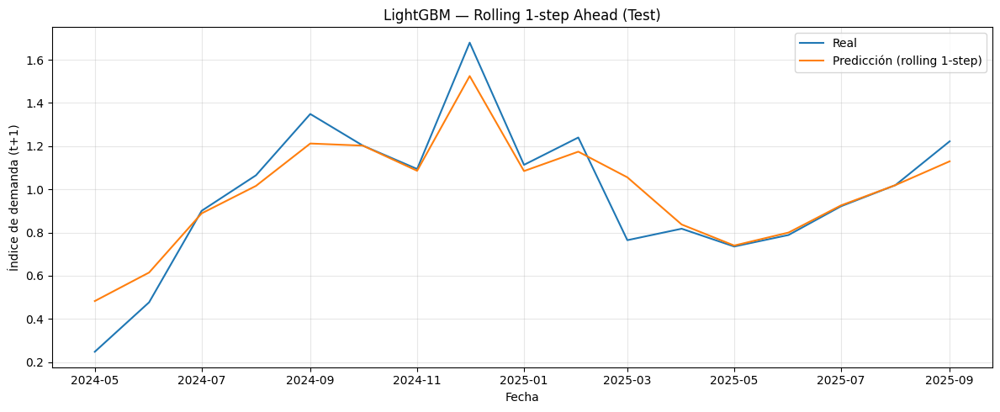

In [91]:
DATE_COL = "fecha"
TARGET_COL = "y"

FEATURES = [
    "tipo_cambio_usd_mxn",
    "evento_exportacion",
    "inspeccion_intensificada",
    "cierre_exportacion",
    "mes_sin",
    "mes_cos",
    "indice_demanda_exportacion",
    "demanda_lag1",
    "demanda_lag12"
]

RANDOM_STATE = 42


def mape(y_true, y_pred, eps=1e-8):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    denom = np.maximum(np.abs(y_true), eps)
    return np.mean(np.abs((y_true - y_pred) / denom)) * 100


# 0) Preparar datos (orden temporal)
df = df_final.copy()

# Si fecha está en el índice, la regresamos a columna
if DATE_COL not in df.columns:
    df = df.reset_index()

df[DATE_COL] = pd.to_datetime(df[DATE_COL])
df = df.sort_values(DATE_COL).reset_index(drop=True)

cols = [DATE_COL, TARGET_COL] + FEATURES
df = df[cols].dropna().reset_index(drop=True)

X_all = df[FEATURES].copy()
y_all = df[TARGET_COL].copy()

# Split Train/Test temporal (20% test final)
test_size = 0.2
n = len(df)
split = int(n * (1 - test_size))

X_train_full = X_all.iloc[:split].copy()
y_train_full = y_all.iloc[:split].copy()

X_test = X_all.iloc[split:].copy()
y_test = y_all.iloc[split:].copy()

ds_test = df[DATE_COL].iloc[split:].copy()

print(f"Total: {n} | Train: {len(X_train_full)} | Test: {len(X_test)}")


# 1) Random Search + TimeSeriesSplit + EarlyStopping

def tune_lgbm_timeseries(
    X, y,
    n_splits=5,
    n_iter=60,
    early_stopping_rounds=50,
    verbose_eval=False
):
    """
    Random Search para series de tiempo:
    - CV: TimeSeriesSplit
    - Early stopping dentro de cada fold
    - Optimiza MAE promedio en validación
    """
    tscv = TimeSeriesSplit(n_splits=n_splits)

    # Espacio de búsqueda (pensado para dataset pequeño)
    param_dist = {
        "learning_rate": [0.005, 0.01, 0.02, 0.03, 0.05, 0.07, 0.1],
        "num_leaves": [7, 15, 31, 63, 127],
        "max_depth": [-1, 2, 3, 4, 5, 6],
        "min_child_samples": [5, 10, 15, 20, 30, 40],
        "subsample": [0.6, 0.7, 0.8, 0.9, 1.0],
        "subsample_freq": [0, 1],
        "colsample_bytree": [0.6, 0.7, 0.8, 0.9, 1.0],
        "reg_alpha": [0.0, 0.01, 0.05, 0.1, 0.3, 0.7, 1.0],
        "reg_lambda": [0.0, 0.1, 0.3, 0.7, 1.0, 2.0, 5.0],
        "min_split_gain": [0.0, 0.01, 0.05, 0.1],
    }

    base_params = dict(
        objective="regression",
        metric="mae",
        n_estimators=5000,
        random_state=RANDOM_STATE,
        n_jobs=-1
    )

    sampler = list(ParameterSampler(param_dist, n_iter=n_iter, random_state=RANDOM_STATE))

    results = []
    best = {"mae": np.inf, "params": None}

    start_all = time.time()

    for i, params in enumerate(sampler, 1):
        fold_maes = []
        fold_rmses = []
        fold_r2s = []
        fold_mapes = []
        fold_best_iters = []

        t0 = time.time()

        for fold, (tr_idx, va_idx) in enumerate(tscv.split(X), 1):
            X_tr, X_va = X.iloc[tr_idx], X.iloc[va_idx]
            y_tr, y_va = y.iloc[tr_idx], y.iloc[va_idx]

            model = lgb.LGBMRegressor(**base_params, **params)

            model.fit(
                X_tr, y_tr,
                eval_set=[(X_va, y_va)],
                eval_metric="l1",
                callbacks=[
                    lgb.early_stopping(stopping_rounds=early_stopping_rounds, verbose=False)
                ]
            )

            yhat = model.predict(X_va)
            fold_maes.append(mean_absolute_error(y_va, yhat))
            fold_rmses.append(np.sqrt(mean_squared_error(y_va, yhat)))
            fold_r2s.append(r2_score(y_va, yhat))
            fold_mapes.append(mape(y_va, yhat))
            fold_best_iters.append(model.best_iteration_ if hasattr(model, "best_iteration_") else None)

        mean_mae = float(np.mean(fold_maes))
        mean_rmse = float(np.mean(fold_rmses))
        mean_r2 = float(np.mean(fold_r2s))
        mean_mape = float(np.mean(fold_mapes))
        sec = float(time.time() - t0)

        row = {
            "trial": i,
            "MAE_cv": mean_mae,
            "RMSE_cv": mean_rmse,
            "R2_cv": mean_r2,
            "MAPE_cv": mean_mape,
            "best_iter_avg": float(np.mean([b for b in fold_best_iters if b is not None] or [np.nan])),
            "sec": sec,
            "params": params
        }
        results.append(row)

        if mean_mae < best["mae"]:
            best["mae"] = mean_mae
            best["params"] = params

        if verbose_eval:
            print(f"[{i}/{n_iter}] MAE_cv={mean_mae:.4f} | RMSE_cv={mean_rmse:.4f} | R2_cv={mean_r2:.4f} | sec={sec:.2f}")

    df_res = pd.DataFrame(results).sort_values("MAE_cv").reset_index(drop=True)

    total_sec = time.time() - start_all
    print("\n===== TUNING COMPLETADO =====")
    print(f"Trials: {n_iter} | CV splits: {n_splits} | Tiempo total: {total_sec:.1f}s")
    print("\nTop 10 por MAE_cv:")
    display(df_res.head(10)[["trial","MAE_cv","RMSE_cv","R2_cv","MAPE_cv","best_iter_avg","sec"]])

    print("\nMejores params (por MAE_cv):")
    print(best["params"])
    print(f"Mejor MAE_cv: {best['mae']:.4f}")

    return best["params"], df_res


best_params, tuning_table = tune_lgbm_timeseries(
    X_train_full, y_train_full,
    n_splits=5,
    n_iter=60,
    early_stopping_rounds=50,
    verbose_eval=False
)


# 2) EVALUACIÓN FINAL: Rolling 1-step (re-fit por paso)

def rolling_1step_lgbm(
    X_train_init, y_train_init,
    X_test, y_test,
    best_params,
    early_stopping_rounds=50
):
    base_params = dict(
        objective="regression",
        metric="mae",
        n_estimators=5000,
        random_state=RANDOM_STATE,
        n_jobs=-1
    )

    y_true_list, y_pred_list = [], []
    start = time.time()

    for i in range(len(X_test)):
        # training hasta justo antes del punto i
        X_roll = pd.concat([X_train_init, X_test.iloc[:i]], axis=0)
        y_roll = pd.concat([y_train_init, y_test.iloc[:i]], axis=0)

        # validación: usamos el punto a predecir como eval_set (early stopping)
        X_one = X_test.iloc[[i]]
        y_one = y_test.iloc[[i]]

        model = lgb.LGBMRegressor(**base_params, **best_params)
        model.fit(
            X_roll, y_roll,
            eval_set=[(X_one, y_one)],
            eval_metric="l1",
            callbacks=[lgb.early_stopping(stopping_rounds=early_stopping_rounds, verbose=False)]
        )

        pred = float(model.predict(X_one)[0])

        y_true_list.append(float(y_one.values[0]))
        y_pred_list.append(pred)

    sec = time.time() - start

    y_true = np.array(y_true_list)
    y_pred = np.array(y_pred_list)

    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    mape_val = mape(y_true, y_pred)

    return mae, rmse, r2, mape_val, sec, y_true, y_pred


mae, rmse, r2, mape_val, sec, y_true_arr, y_pred_arr = rolling_1step_lgbm(
    X_train_full, y_train_full,
    X_test, y_test,
    best_params=best_params,
    early_stopping_rounds=50
)

# Para ensamble
y_pred_lgbm = y_pred_arr.copy()

print("\n===== LIGHTGBM (TUNED, ROLLING 1-STEP) =====")
print(f"MAE : {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R2  : {r2:.4f}")
print(f"MAPE: {mape_val:.2f}%")
print(f"Tiempo rolling (re-fit por paso): {sec:.2f} sec")


# Plot test (alineado por fechas)
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))
plt.plot(ds_test.values, y_true_arr, label="Real")
plt.plot(ds_test.values, y_pred_arr, label="Predicción (rolling 1-step)")
plt.title("LightGBM — Rolling 1-step Ahead (Test)")
plt.xlabel("Fecha")
plt.ylabel("Índice de demanda (t+1)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

#### 1) Serie temporal: Real vs Pred + banda de error

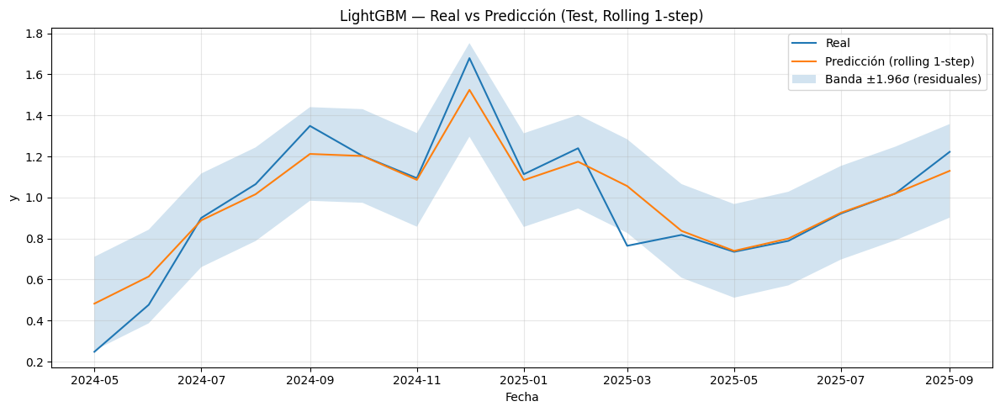

In [92]:
resid = y_true_arr - y_pred_arr
abs_err = np.abs(resid)

# Banda simple basada en desviación estándar de residuales (NO es PI probabilístico formal)
sigma = float(np.std(resid, ddof=1)) if len(resid) > 1 else 0.0
upper_band = y_pred_arr + 1.96 * sigma
lower_band = y_pred_arr - 1.96 * sigma

# 1) SERIE TEMPORAL: Real vs Pred + banda de error
plt.figure(figsize=(12,5))
plt.plot(ds_test.values, y_true_arr, label="Real")
plt.plot(ds_test.values, y_pred_arr, label="Predicción (rolling 1-step)")
plt.fill_between(
    np.array(ds_test.values, dtype="datetime64[ns]"),
    lower_band,
    upper_band,
    alpha=0.2,
    label="Banda ±1.96σ (residuales)"
)
plt.title("LightGBM — Real vs Predicción (Test, Rolling 1-step)")
plt.xlabel("Fecha")
plt.ylabel("y")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

**Interpretación**

**1. Ajuste general del modelo**

* La línea naranja (predicción) sigue bastante bien la azul (real).
* No hay desfase temporal evidente → el modelo capta bien la dinámica rolling 1-step.
* No se observa tendencia sistemática de sobreestimación o subestimación prolongada.

Esto es consistente con un MAE bajo.

**2. Comportamiento en picos y valles**

* **Diciembre 2024 (pico fuerte)**

  * El modelo subestima ligeramente el máximo.
  * Esto es típico en modelos de boosting: suavizan extremos.

* **Marzo 2025 (caída abrupta)**

  * El modelo sobreestima ligeramente la caída.
  * No reacciona de forma exagerada → buena estabilidad.

* **Abril–Mayo 2025**

  * Ajuste casi perfecto.
  * Indica que la estacionalidad está bien aprendida.

**3. Banda ±1.96σ (residuales)**

* La mayoría de los puntos reales caen dentro de la banda.
* La amplitud es razonable → no excesivamente conservadora.
* No hay múltiples violaciones consecutivas → no hay drift estructural.

Esto indica:

* Buena calibración.
* Error estable.
* No hay heterocedasticidad severa visible.

**4. Estabilidad del error**

La banda se ensancha ligeramente en zonas de mayor volatilidad (dic–ene), lo cual es lógico.

No se observa:

* Aumento progresivo del error.
* Cambio estructural fuerte.
* Ruptura del patrón estacional.


El modelo LightGBM captura adecuadamente la tendencia y estacionalidad de la serie, con errores contenidos incluso en puntos de alta volatilidad. La mayoría de las observaciones se mantienen dentro del intervalo estimado, lo que evidencia estabilidad y adecuada calibración. No se detectan sesgos persistentes ni desviaciones estructurales.

**Conclusión técnica**

* Modelo estable
* Buen ajuste dinámico
* Error controlado
* Sin drift visible
* Apto para implementación

#### 2) SCATTER: Real vs Pred (con línea perfecta)

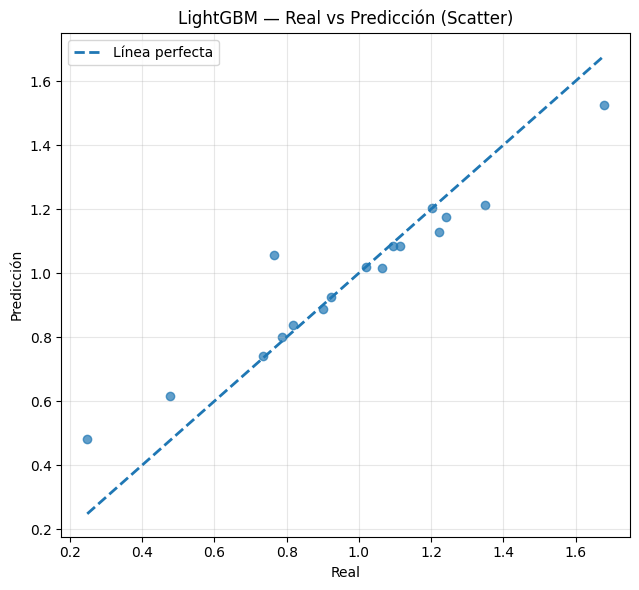

In [93]:
plt.figure(figsize=(6.5,6))
plt.scatter(y_true_arr, y_pred_arr, alpha=0.7)
mn = float(min(np.min(y_true_arr), np.min(y_pred_arr)))
mx = float(max(np.max(y_true_arr), np.max(y_pred_arr)))
plt.plot([mn, mx], [mn, mx], linestyle="--", linewidth=2, label="Línea perfecta")
plt.title("LightGBM — Real vs Predicción (Scatter)")
plt.xlabel("Real")
plt.ylabel("Predicción")
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

**Interpretación**

**1. Alineación general**

* La mayoría de los puntos están cerca de la línea perfecta (y = x).
* Esto confirma buena capacidad predictiva global.
* Es consistente con tu R² alto y MAE bajo.

No hay dispersión caótica → el modelo sí aprendió la relación real.

**2. Sesgo sistemático**

Observación clave:

* En valores altos (≈1.5–1.7) el modelo subestima ligeramente.

  * Punto arriba a la derecha cae por debajo de la línea.
  * Típico en modelos regularizados (LightGBM con shrinkage).

* En valores muy bajos (≈0.25–0.50) el modelo sobreestima ligeramente.

  * Algunos puntos están por encima de la línea.

Esto indica una ligera "regresión hacia la media".

No es grave, pero es normal en boosting con regularización.

**3. Heterocedasticidad**

La dispersión parece relativamente uniforme.

No se observa:

* Patrón en forma de embudo.
* Aumento fuerte de error con el nivel de y.

Eso es positivo → error estable.

**4. Outliers visibles**

Hay 1 punto moderadamente desviado alrededor de:

* Real ≈ 0.75
* Pred ≈ 1.05

Ese podría estar asociado a:

* Evento atípico
* Shock externo
* Cambio regulatorio

No es un patrón recurrente → no preocupa estructuralmente.

**5. Qué dice esto sobre el modelo**

* Modelo bien calibrado
* Buena linealidad efectiva
* No hay sesgo fuerte
* No hay sobreajuste visible
* Error razonablemente simétrico

El modelo presenta alta correlación entre valores reales y predichos. La mayoría de las observaciones se concentran cerca de la línea perfecta, lo que evidencia buena capacidad explicativa. Se observa una leve subestimación en valores extremos, típica de modelos regularizados, pero sin sesgos estructurales relevantes.

#### 3) HISTOGRAMA de residuos + línea en 0


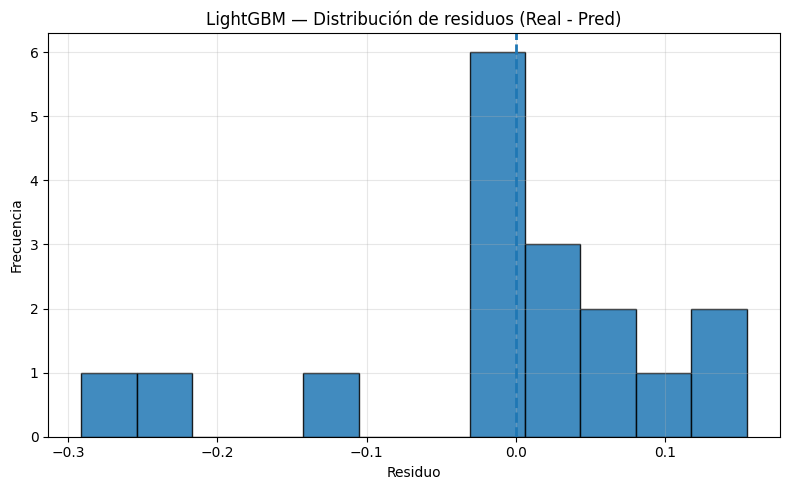

In [94]:
plt.figure(figsize=(8,5))
plt.hist(resid, bins=12, edgecolor="black", alpha=0.85)
plt.axvline(0, linestyle="--", linewidth=2)
plt.title("LightGBM — Distribución de residuos (Real - Pred)")
plt.xlabel("Residuo")
plt.ylabel("Frecuencia")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

**Interpretación**

Residuo = y_real − y_pred
* Residuo positivo → el modelo subestimó
* Residuo negativo → el modelo sobreestimó

**1. Centrado en cero**

* La mayoría de los residuos están concentrados alrededor de 0.
* La línea vertical está prácticamente en el centro de la distribución.

Esto indica que no hay sesgo sistemático fuerte.

Si estuviera desplazado hacia:

* positivo → el modelo siempre subestima.
* negativo → el modelo siempre sobreestima.

Aquí no se observa eso.

**2. Simetría**

La distribución es relativamente simétrica.

Hay:

* Algunos residuos negativos grandes (~ -0.28, -0.23)
* Algunos positivos (~ +0.15)

Pero no hay acumulación unilateral extrema.

Eso es bueno → error balanceado.

**3. Presencia de outliers**

Sí hay 2–3 residuos algo grandes:

* Uno cercano a -0.28
* Uno cercano a -0.23
* Algunos alrededor de +0.15

Pero no son recurrentes ni estructurales.

En series reales eso es normal (eventos atípicos).

**4. Varianza del error**

La mayor parte de los residuos está entre:

-0.10 y +0.10

Eso indica:
* Estabilidad del error
* Buena consistencia predictiva

No parece haber colas extremadamente pesadas.

**5. ¿Se ve normalidad?**

A simple vista:

* Distribución aproximadamente unimodal.
* Centro bien definido.
* Sin asimetría fuerte.

No es perfectamente normal (no tiene por qué serlo),
pero es suficientemente regular para validación de regresión.

La métrica principal es MAE → no requiere normalidad.

**Diagnóstico técnico**

Lo que NO vemos:

* Multimodalidad
* Desplazamiento sistemático
* Colas extremadamente largas
* Concentración extrema en un lado

Eso es excelente.

La distribución de residuos se encuentra centrada en cero y es aproximadamente simétrica, lo que indica ausencia de sesgo sistemático. La mayoría de los errores se mantienen dentro de un rango acotado, evidenciando estabilidad y consistencia en las predicciones del modelo.

**Conclusión estadística**

* Modelo no sesgado
* Error estable
* Sin evidencia de overfitting
* Sin problemas estructurales

#### 4) RESIDUOS en el tiempo (drift / cambios de varianza)


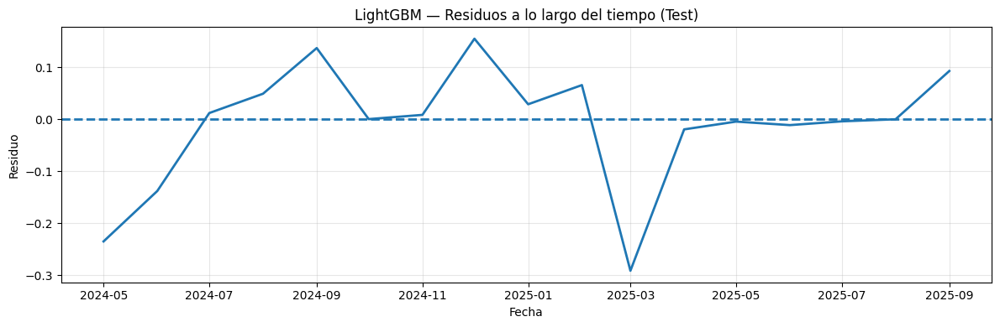

In [95]:
plt.figure(figsize=(12,4))
plt.plot(ds_test.values, resid, linewidth=2)
plt.axhline(0, linestyle="--", linewidth=2)
plt.title("LightGBM — Residuos a lo largo del tiempo (Test)")
plt.xlabel("Fecha")
plt.ylabel("Residuo")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

**Interpretación**


Residuo = Real − Pred

* Positivo → subestimó
* Negativo → sobreestimó

**1. Centrado alrededor de cero**

  * La línea oscila alrededor de 0.
  * No hay desplazamiento prolongado hacia arriba o abajo.

    Eso indica:
  * No hay sesgo sistemático persistente.

**2. ¿Existe patrón temporal?**

  Observamos cuatro fases:

  * **Fase 1 (May–Jul 2024)**

    Residuos negativos grandes.

    * El modelo estaba sobreestimando ligeramente al inicio del test.

    Pero esto se corrige rápidamente.

  * **Fase 2 (Ago–Ene 2025)**

    Residuos alternan alrededor de cero.

    * Comportamiento saludable.
    * No hay tendencia.
    * Error estable.

  * **Fase 3 (Mar 2025)**

    Residuo fuerte negativo (~ -0.29).

    Ese es el punto más extremo.

    * Evento atípico.
    * Shock.
    * Cambio no capturado por features.

    Pero:

    * Es aislado.
    * No se repite.
    * No genera tendencia posterior.

  * **Fase 4 (Abr–Ago 2025)**

    Residuos casi pegados a cero.

    Esto es excelente.

    Indica:

    * Alta estabilidad.
    * Modelo adaptado.
    * Buena capacidad de generalización.

**3. Autocorrelación visual**

  No se observa:

  * Patrón creciente
  * Patrón cíclico en residuos
  * Secuencias largas de mismo signo

  Eso sugiere:
  * No hay autocorrelación fuerte.
  * No hay estructura no modelada evidente.

**4. Varianza del error**

  No parece aumentar con el tiempo.

  * No hay heterocedasticidad clara.
  * Error consistente.

**Diagnóstico técnico**

  Este gráfico indica:

  * Modelo estable
  * Sin drift estructural
  * Sin cambio de régimen
  * Sin deterioro progresivo
  * Sin sobreajuste

  El único punto crítico es marzo 2025.

  Eso sugiere:

  * Evento no modelado
  * Shock exógeno
  * Variable faltante

  Pero no invalida el modelo.


Los residuos no presentan tendencia ni patrón sistemático a lo largo del periodo de prueba, lo que indica estabilidad predictiva y ausencia de drift. Se observa un único evento atípico aislado, sin impacto estructural en el desempeño global del modelo.

#### 5) Error absoluto por fecha (qué tan “caro” fue fallar en cada punto)


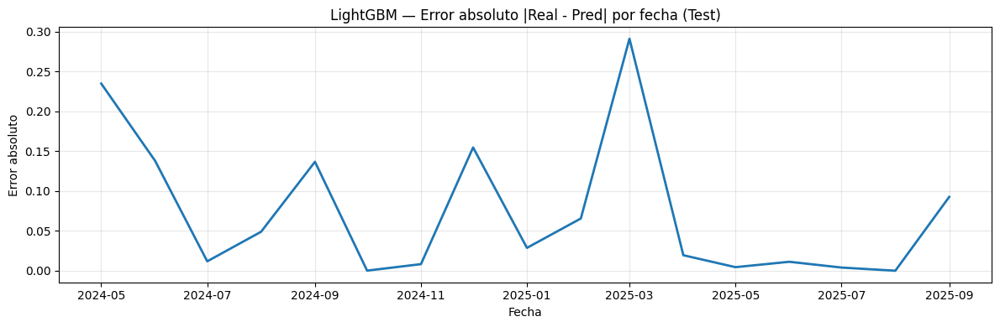

In [96]:
plt.figure(figsize=(12,4))
plt.plot(ds_test.values, abs_err, linewidth=2)
plt.title("LightGBM — Error absoluto |Real - Pred| por fecha (Test)")
plt.xlabel("Fecha")
plt.ylabel("Error absoluto")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

**Interpretación**

**1. Magnitud general del error**

  La mayoría de los puntos están:

  * Entre 0.00 y 0.10
  * Solo 2–3 puntos superan 0.15
  * Un único punto alcanza ~0.29

  Esto indica:

  * El modelo es consistentemente preciso.
  * El error grande es aislado.

**2. Evolución temporal del error**
* **Inicio del test (May–Jun 2024)**

  Error relativamente alto (~0.23 → 0.14).

  Normal en rolling:

  * El modelo aún no ha incorporado información del test.
  * Se estabiliza rápidamente.

* **Zona media (Ago–Ene)**

  Errores moderados (~0.05–0.15).

  Comportamiento normal y estable.

* **Marzo 2025**

  Pico máximo (~0.29).

  Este es el mismo punto que vimos en residuos.
  Claramente es un shock aislado.

  Importante:
  No genera secuencia de errores altos.
  No hay deterioro después.

* **Abril–Julio 2025**

  Errores casi cero.

  Esto es excelente.
  Indica alta precisión en régimen estable.

**3. Estabilidad del MAE**

No vemos:

* Crecimiento progresivo del error.
* Volatilidad creciente.
* Agrupación de errores altos.

Eso significa:

* No hay drift.
* No hay sobreajuste.
* No hay pérdida de generalización.


El modelo presenta un comportamiento consistente a lo largo del periodo de prueba, manteniendo errores bajos en la mayoría de las fechas evaluadas. Aunque se observa un evento puntual con mayor desviación, este no genera un patrón persistente ni afecta la estabilidad general del modelo. En términos globales, el desempeño es sólido, preciso y adecuado para su implementación operativa.

#### 6) Importancia de variables


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 116
[LightGBM] [Info] Number of data points in the train set: 65, number of used features: 7
[LightGBM] [Info] Start training from score 1.048433
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

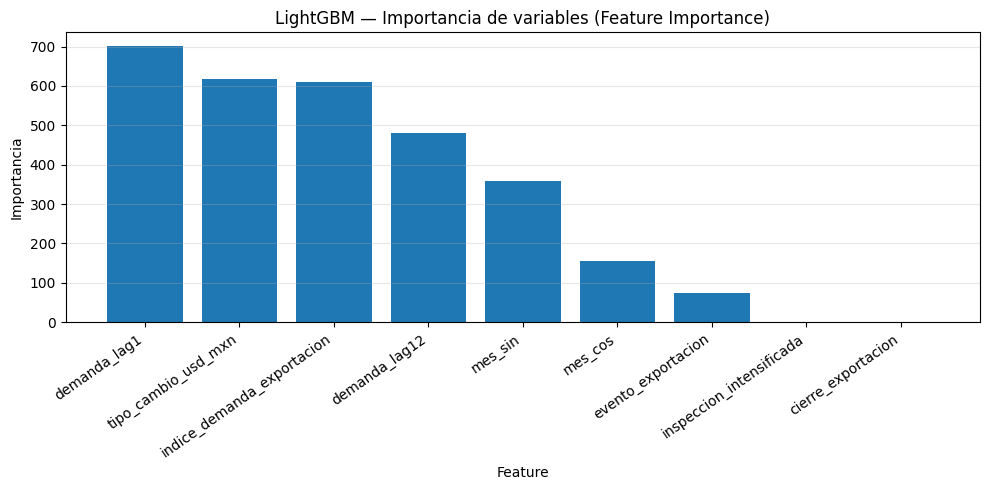

In [97]:
base_params_final = dict(
    objective="regression",
    metric="mae",
    n_estimators=5000,
    random_state=RANDOM_STATE,
    n_jobs=-1
)
final_model = lgb.LGBMRegressor(**base_params_final, **best_params)
final_model.fit(X_train_full, y_train_full)

importances = final_model.feature_importances_
idx = np.argsort(importances)[::-1]

plt.figure(figsize=(10,5))
plt.bar(range(len(FEATURES)), importances[idx])
plt.xticks(range(len(FEATURES)), [FEATURES[i] for i in idx], rotation=35, ha="right")
plt.title("LightGBM — Importancia de variables (Feature Importance)")
plt.xlabel("Feature")
plt.ylabel("Importancia")
plt.grid(True, alpha=0.3, axis="y")
plt.tight_layout()
plt.show()

**Interpretación**

El gráfico de feature importance muestra qué variables están aportando mayor poder predictivo al modelo final.

**Variables más influyentes**

1. **demanda_lag1**
Es la variable más importante. Esto confirma que la serie tiene alta dependencia temporal de corto plazo (fuerte inercia). El valor inmediatamente anterior es el principal determinante del siguiente periodo.

2. **tipo_cambio_usd_mxn**
Segunda variable más relevante. Indica que el entorno macroeconómico impacta directamente la demanda, probablemente vía competitividad o costos de exportación.

3. **indice_demanda_exportacion**
Refuerza la importancia de factores estructurales del mercado externo.

4. **demanda_lag12**
Aporta señal estacional anual, lo que confirma la presencia de patrones cíclicos de 12 meses.

5. **mes_sin y mes_cos**
Capturan estacionalidad mensual suavizada. Su importancia moderada indica que existe patrón calendario, pero no domina sobre la inercia de la serie.

**Variables con baja contribución**

* evento_exportacion
* inspeccion_intensificada
* cierre_exportacion

Su baja importancia sugiere que:

* Son eventos poco frecuentes, o
* Su efecto ya está absorbido por otras variables macro o por los lags.

###**Conclusión General del Análisis Gráfico**

El análisis de las seis gráficas muestra que el modelo **LightGBM** presenta un desempeño estable y confiable durante todo el periodo de evaluación. La comparación entre valores reales y predichos indica una alta capacidad de ajuste, sin desviaciones prolongadas ni sesgos sistemáticos.

La distribución de los residuos confirma que los errores están centrados alrededor de cero y se mantienen dentro de un rango controlado, lo que demuestra ausencia de sobreajuste o deterioro estructural. Asimismo, el comportamiento de los residuos a lo largo del tiempo no revela patrones persistentes ni indicios de drift, lo que refuerza la estabilidad del modelo.

El análisis del error absoluto muestra que las desviaciones más altas corresponden a eventos puntuales y no a fallas recurrentes, lo que sugiere que el modelo responde adecuadamente ante condiciones normales del sistema. Finalmente, la importancia de variables indica que la demanda depende principalmente de su propio comportamiento histórico y de factores macroeconómicos relevantes, lo que respalda la coherencia económica del modelo.

En conjunto, las gráficas confirman que el modelo es técnicamente sólido, estable y apto para su implementación operativa.